# 불량품 예측

불량품을 예측하기 위해 다음과 같은 함수화 정리를 진행한다. 혼란을 막기 위해 모든 과정을 함수화 하기로 한다.  
목차는 다음과 같다.

- 1. Load packages & Data
- 2. Function

## 1. Load Packages & Data

In [124]:
### ide packages
import os
from pprint import pprint
import numpy as np
import pandas as pd
import random
import string
from tqdm import tqdm

# sklearn preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    make_scorer,
    roc_curve,
    auc,
    precision_recall_curve,
    recall_score,
    silhouette_score,
)

# models
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from catboost import CatBoostClassifier, Pool
from lightgbm import LGBMClassifier, plot_metric
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.cluster import KMeans

# plot
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px

# tuning
import optuna

In [125]:
# load data
load_dir = './data/'
train = pd.read_csv(load_dir + "train.csv")
test = pd.read_csv(load_dir + "test.csv")

## 2. Functions

In [126]:
# 평가 스코어 지정하기
f1_scorer = make_scorer(f1_score, pos_label=1, average = 'binary')

# 평가 매트릭 계산 결과 보여주기
def get_clf_eval(y_test, y_pred=None):
    confusion = confusion_matrix(y_test, y_pred, labels=[True, False])
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, labels=[True, False])
    recall = recall_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred, labels=[True, False])

    print("오차행렬:\n", confusion)
    print("\n정확도: {:.4f}".format(accuracy))
    print("정밀도: {:.4f}".format(precision))
    print("재현율: {:.4f}".format(recall))
    print("F1: {:.4f}".format(F1))

In [127]:
# 해당 공정 맞춤형 위치 옮기기
def move_data(data):
    # divide
    dam = data.filter(regex='_Dam')
    fill1 = data.filter(regex='_Fill1')
    fill2 = data.filter(regex='_Fill2')
    autoclave = data.filter(regex='_AutoClave')
    target = data['target']

    # dam
    dam = dam.dropna(axis=1, how='all')
    dam = dam.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam')
    dam_mask = dam[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan])].iloc[:, 24:].shift(-1, axis = 1).values
    dam.loc[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan]), dam.columns[24:]] = dam_mask
    dam = dam.drop(columns='WorkMode Collect Result_Dam')

    # fill1
    fill1 = fill1.dropna(axis=1, how='all')
    fill1 = fill1.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1')
    fill1_mask = fill1[fill1['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].isin(['OK', np.nan])].iloc[:, 14:].shift(-1, axis = 1).values
    fill1.loc[fill1['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].isin(['OK', np.nan]), fill1.columns[14:]] = fill1_mask
    fill1 = fill1.drop(columns='WorkMode Collect Result_Fill1')

    # fill2
    fill2 = fill2.dropna(axis=1, how='all')
    fill2 = fill2.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2')
    fill2_mask = fill2[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan])].iloc[:, 24:].shift(-1, axis = 1).values
    fill2.loc[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan]), fill2.columns[24:]] = fill2_mask
    fill2 = fill2.drop(columns='WorkMode Collect Result_Fill2')

    # CONCAT
    data = pd.concat([dam, fill1, fill2, autoclave, target], axis=1)
    
    return data

In [128]:
# 칼럼 위치 변경
def swap_columns(df, condition, col1, col2):
    # 조건에 해당하는 행 필터링
    filtered_df = df[condition]
    
    # 값 교환
    df.loc[condition, [col1, col2]] = filtered_df[[col1, col2]].copy().iloc[:, ::-1].values

    return df

In [129]:
# Equipment 방향 통일과 잘못된 위치 재조정하기
def change_data(train, test):
    # train
    train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float)
    train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] = train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float)


    # 이동 전
    X_sum_down_1 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    X_sum_down_2 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float).mean()
    X_sum_up_1 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    X_sum_up_2 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float).mean()

    X_sum_down = (X_sum_down_1 - X_sum_down_2) / 2 # stage1에서 빼고, Stage3에서 더하기 <500
    X_sum_up = (X_sum_up_2 - X_sum_up_1) / 2 # stage1에서 더하고, Stage 3에서 빼기

    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] += X_sum_up
    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] -= X_sum_up

    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] -= X_sum_down
    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] += X_sum_down

    # test
    test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float)
    test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] = test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float)


    # 이동 전
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] += X_sum_up
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] -= X_sum_up

    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] -= X_sum_down
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] += X_sum_down

    # train
    Y_sum_dam_1 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_2 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'] = Y_sum_dam_1 + Y_sum_dam_2 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam']

    Y_sum_dam_3 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_4 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'] = Y_sum_dam_3 + Y_sum_dam_4 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam']

    Y_sum_dam_5 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_6 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'] = Y_sum_dam_5 + Y_sum_dam_6 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam']

    Y_sum_fill_1 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_2 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'] = Y_sum_fill_1 + Y_sum_fill_2 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1']

    Y_sum_fill_3 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_4 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'] = Y_sum_fill_3 + Y_sum_fill_4 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1']

    Y_sum_fill_5 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_6 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float).mean()
    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'] = Y_sum_fill_5 + Y_sum_fill_6 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1']

    # test
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'] = Y_sum_dam_1 + Y_sum_dam_2 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'] = Y_sum_dam_5 + Y_sum_dam_6 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'] = Y_sum_dam_3 + Y_sum_dam_4 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'] = Y_sum_fill_1 + Y_sum_fill_2 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'] = Y_sum_fill_5 + Y_sum_fill_6 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'] = Y_sum_fill_3 + Y_sum_fill_4 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1']

    ### Train
    # 조건을 만족하는 행 인덱스를 찾음
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) >= 200

    # DISCHARGED TIME OF RESIN(Stage1) 
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam')

    # Stage1 Circle1 Distance Speed Collect
    swap_columns(train, condition, 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage3 Circle2 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Circle4 Distance Speed Collect Result_Dam')

    # Stage1 Line1 Distance Speed Collect
    swap_columns(train, condition, 'Stage1 Line1 Distance Speed Collect Result_Dam', 'Stage3 Line1 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line3 Distance Speed Collect Result_Dam', 'Stage3 Line3 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line4 Distance Speed Collect Result_Dam')

    # THICKNESS 1
    # swap_columns(train, condition, 'THICKNESS 1 Collect Result_Dam', 'THICKNESS 3 Collect Result_Dam')

    ### 젤 마지막에 와야됨!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam')


    ### Test
    # 조건을 만족하는 행 인덱스를 찾음
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) >= 200

    # DISCHARGED TIME OF RESIN(Stage1) 
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam')

    # Stage1 Circle1 Distance Speed Collect
    swap_columns(test, condition, 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage3 Circle2 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Circle4 Distance Speed Collect Result_Dam')

    # Stage1 Line1 Distance Speed Collect
    swap_columns(test, condition, 'Stage1 Line1 Distance Speed Collect Result_Dam', 'Stage3 Line1 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line3 Distance Speed Collect Result_Dam', 'Stage3 Line3 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line4 Distance Speed Collect Result_Dam')

    # THICKNESS 1
    # swap_columns(train, condition, 'THICKNESS 1 Collect Result_Dam', 'THICKNESS 3 Collect Result_Dam')

    ### 젤 마지막에 와야됨!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam')
    
    ### Train
    # 조건을 만족하는 행 인덱스를 찾음
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].astype(float) < 200

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1')

    ### Test
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].astype(float) < 200

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1')
    
    ### Train
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1')

    ### Test
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1')

    return train, test

In [130]:
# Dam, Fill1, Fill2에서 지정된 값이 다를 경우 Abnormal 
def inconsistant(data, columnname, iwantthiscolumnsname, is_train = True):
    # 장비 번호가 다르면 불일치
    if is_train:
        cri = [
            df_train[columnname + '_Dam'] != df_train[columnname + '_Fill1'],
            df_train[columnname + '_Dam'] != df_train[columnname + '_Fill2'],
            df_train[columnname + '_Fill1'] != df_train[columnname + '_Fill2'],
            data[iwantthiscolumnsname] == 1
        ]
        
    else:
        cri = [
            df_test[columnname + '_Dam'] != df_test[columnname + '_Fill1'],
            df_test[columnname + '_Dam'] != df_test[columnname + '_Fill2'],
            df_test[columnname + '_Fill1'] != df_test[columnname + '_Fill1'],
            data[iwantthiscolumnsname] == 1
        ]
    con = [1, 1, 1, 1]

    data[iwantthiscolumnsname] = np.select(cri, con, default = 0)

In [131]:
# 변수 세팅
def variable_setting(types, tr, te, columns_to_convert, columns_to):
    train = tr.copy()
    test = te.copy()
    
    if types == 'catboost':
        dtype = 'string'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)

        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    elif types == 'lightgbm':
        dtype = 'float'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)

        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    elif types == 'xgboost':
        dtype = 'float'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    return train, test

In [132]:
def model_best_threshold(model, X_valid, y_valid):
    # Precision - Recall
    y_pred_proba = model.predict_proba(X_valid)[:, 1]

    precision, recall, thresholds = precision_recall_curve(y_valid, y_pred_proba)
    f1_scores = 2*recall*precision / (recall + precision)
    cat_best_threshold = thresholds[np.argmax(f1_scores)]
    y_pred_custom_threshold = (y_pred_proba >= cat_best_threshold).astype(int)
    
    return thresholds, y_pred_custom_threshold

In [133]:
def xgboost_optuna(train, cat_features_indices):
    X = train.drop(columns=['target'])
    y = train['target']

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1.0, log=True),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 5),
            'lambda': trial.suggest_float('lambda', 1e-3, 10.0, log=True),
            'alpha': trial.suggest_float('alpha', 1e-3, 10.0, log=True),
            'seed': 42,
        }

        model = XGBClassifier(eval_metric='logloss', **params, early_stopping_rounds = 50, enable_categorical=True)

        model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], verbose=0)

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)

        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

In [134]:
def lightgbm_optuna(train, cat_features_indices):

    X = train.drop(columns=['target'])
    y = train['target']

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    def objective(trial):
        lgbm_params = {
            'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
            "max_depth": trial.suggest_int('max_depth', 3, 63),
            "learning_rate": trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True), 
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
            "min_child_weight": trial.suggest_float('min_child_weight', 0.5, 4),
            "min_child_samples": trial.suggest_int('min_child_samples', 5, 100),
            "subsample": trial.suggest_float('subsample', 0.4, 1),
            "subsample_freq": trial.suggest_int('subsample_freq', 0, 5),
            "colsample_bytree": trial.suggest_float('colsample_bytree', 0.2, 1),
            'num_leaves': trial.suggest_int('num_leaves', 2, 64),
        }

        model = LGBMClassifier(**lgbm_params, device='cpu', random_state=42, verbose=-1)

        # 범주형 피처 적용
        model.fit(X_train, y_train, categorical_feature=cat_features_indices,
            eval_set = [(X_valid, y_valid)],
            callbacks=[
                lgb.early_stopping(stopping_rounds=50),
            ]
        )

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)

        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

In [135]:
def catboost_optuna(train, cat_features_indices):
    
    # train X, y
    X = train.drop(columns=['target'])
    y = train['target']

    # $plit 
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # Pooling
    train_pool = Pool(X_train, y_train, cat_features=cat_features_indices)
    valid_pool = Pool(X_valid, y_valid, cat_features=cat_features_indices)
    
    # tuning parameters
    def objective(trial):
        # 하이퍼파라미터를 샘플링
        params = {
            "iterations": trial.suggest_int("iterations", 100, 1000),
            "depth": trial.suggest_int("depth", 4, 10),
            "learning_rate": trial.suggest_float("learning_rate", 1e-3, 1.0, log=True),
            "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-2, 10.0),
            "border_count": trial.suggest_int("border_count", 32, 255),
            "random_strength": trial.suggest_float("random_strength", 1e-9, 10.0),
            "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
            "od_type": trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
            "od_wait": trial.suggest_int("od_wait", 10, 50),
            "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
#             "scale_pos_weight": trial.suggest_int('scale_pos_weight', 6, 10),
            "verbose": 0,
            "random_seed": 42
        }

        # CatBoost 모델 학습
        model = CatBoostClassifier(**params)
        model.fit(train_pool, eval_set=valid_pool, early_stopping_rounds=50, verbose=0)

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)
        
        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

## 3. Setting

In [136]:
# inconsistant 열 이름
columnname = [
    'Equipment', 
    'Receip No Collect Result', 
    'Production Qty Collect Result', 
    'PalletID Collect Result'
]

In [137]:
# 최종 선택할 행 이름
sel_col = [
    'Model.Suffix_Dam',
    'Workorder_Dam',
    'CURE SPEED Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'Head Clean Position Z Collect Result_Dam',
    'Head Purge Position Z Collect Result_Dam',
    'Head Zero Position Y Collect Result_Dam',
    'Head Zero Position Z Collect Result_Dam',
    'Machine Tact time Collect Result_Dam',
    'Stage1 Circle1 Distance Speed Collect Result_Dam',
    'Stage1 Line1 Distance Speed Collect Result_Dam',
    'Stage1 Line2 Distance Speed Collect Result_Dam',
    'Stage1 Line3 Distance Speed Collect Result_Dam',
    'Stage1 Line4 Distance Speed Collect Result_Dam',
    'Stage2 Circle1 Distance Speed Collect Result_Dam',
    'Stage2 Line1 Distance Speed Collect Result_Dam',
    'Stage2 Line2 Distance Speed Collect Result_Dam',
    'Stage2 Line3 Distance Speed Collect Result_Dam',
    'Stage2 Line4 Distance Speed Collect Result_Dam',
    'Stage3 Circle1 Distance Speed Collect Result_Dam',
    'Stage3 Line1 Distance Speed Collect Result_Dam',
    'Stage3 Line2 Distance Speed Collect Result_Dam',
    'Stage3 Line3 Distance Speed Collect Result_Dam',
    'Stage3 Line4 Distance Speed Collect Result_Dam',
    'THICKNESS 1 Collect Result_Dam', 
    'THICKNESS 2 Collect Result_Dam',
    'THICKNESS 3 Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
    'Head Purge Position Z Collect Result_Fill1',
    'Machine Tact time Collect Result_Fill1',
    'CURE END POSITION Z Collect Result_Fill2',
    'CURE SPEED Collect Result_Fill2',
    'CURE START POSITION Z Collect Result_Fill2',
    'Machine Tact time Collect Result_Fill2',
    '1st Pressure Collect Result_AutoClave',
    '2nd Pressure Collect Result_AutoClave',
    '3rd Pressure Collect Result_AutoClave',
    'Chamber Temp. Collect Result_AutoClave',
    'inconsistant',
    'Stage1 Line diffent Distance Speed_Dam',
    'Stage2 Line diffent Distance Speed_Dam',
    'Stage3 Line diffent Distance Speed_Dam',
    'PalletID Collect Result_Dam',
    'Receip No Collect Result_Dam',
    'Equipment_Dam',
    'kmeans_5',
    'round_1st_time',
    'round_2nd_time',
    'round_3rd_time',
    'all_time',
    'RESIN Adjusted_Predicted_Volume Stage1 Dam',
    'RESIN Adjusted_Predicted_Volume Stage2 Dam',
    'RESIN Adjusted_Predicted_Volume Stage3 Dam',
    'RESIN Adjusted_Predicted_Volume Stage1 Fill1',
    'RESIN Adjusted_Predicted_Volume Stage2 Fill1',
    'RESIN Adjusted_Predicted_Volume Stage3 Fill1',
    'target'
]

## 4. Matched Data

In [138]:
# 위치 옮기기
train_move = move_data(train)
test_move = move_data(test)

/tmp/ipykernel_1429/691509256.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 0.     0.012  0.    ...  0.    -0.019  0.   ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dam.loc[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan]), dam.columns[24:]] = dam_mask
/tmp/ipykernel_1429/691509256.py:28: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[114.612 114.612  85.    ...  85.    114.612  85.   ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  fill2.loc[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan]), fill2.columns[24:]] = fill2_mask
/tmp/ipykernel_1429/691509256.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Valu

In [139]:
# 위치 변경 및 Equipment2 를 Equipment1 방향으로 변경
df_train, df_test = change_data(train_move, test_move)

### Type Change

In [140]:
# 데이터 타입 변경하기
type_change = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'
]

for i in type_change:
    df_train[i] = df_train[i].astype('float64')
    df_test[i] = df_test[i].astype('float64')

### Modified Equipment data type

In [141]:
# Equipment 번호만 가져오기
df_train['Equipment_Dam'] = df_train['Equipment_Dam'].str.slice(15, 16)
df_train['Equipment_Fill1'] = df_train['Equipment_Fill1'].str.slice(17, 18)
df_train['Equipment_Fill2'] = df_train['Equipment_Fill2'].str.slice(17, 18)

df_test['Equipment_Dam'] = df_test['Equipment_Dam'].str.slice(15, 16)
df_test['Equipment_Fill1'] = df_test['Equipment_Fill1'].str.slice(17, 18)
df_test['Equipment_Fill2'] = df_test['Equipment_Fill2'].str.slice(17, 18)

### New Column

In [142]:
# 불일치 변수
df_train['inconsistant'] = 0
df_test['inconsistant'] = 0

# 장착
for i in columnname:
    inconsistant(df_train, i, 'inconsistant', True)
    inconsistant(df_test, i, 'inconsistant', False)

In [143]:
# 시간이 0이하, 900이상인 값은 이상치로 분류
for j in ['Machine Tact time Collect Result_Dam', 'Machine Tact time Collect Result_Fill1', 'Machine Tact time Collect Result_Fill2']:
    cri = [
        df_train[j] <= 0,
        df_train[j] > 900
    ]
    cri2 = [
        df_test[j] <= 0,
        df_test[j] > 900
    ]
    con = [
        1, 1
    ]
    df_train['inconsistant'] = np.select(cri, con, default = df_train['inconsistant'])
    df_test['inconsistant'] = np.select(cri2, con, default = df_test['inconsistant'])

### Speed Line & Circle

In [144]:
# 라인별로 속도가 같아야 정상이다.
df_train['Stage1 Line diffent Distance Speed_Dam'] = ((df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage1 Line Sum Speed_Dam'] = df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line4 Distance Speed Collect Result_Dam']

df_train['Stage2 Line diffent Distance Speed_Dam'] = ((df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage2 Line Sum Speed_Dam'] = df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line4 Distance Speed Collect Result_Dam']

df_train['Stage3 Line diffent Distance Speed_Dam'] = ((df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage3 Line Sum Speed_Dam'] = df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line4 Distance Speed Collect Result_Dam']


In [145]:
# 라인별로 속도가 같아야 정상이다.
df_test['Stage1 Line diffent Distance Speed_Dam'] = ((df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage1 Line Sum Speed_Dam'] = df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line4 Distance Speed Collect Result_Dam']

df_test['Stage2 Line diffent Distance Speed_Dam'] = ((df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage2 Line Sum Speed_Dam'] = df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line4 Distance Speed Collect Result_Dam']

df_test['Stage3 Line diffent Distance Speed_Dam'] = ((df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage3 Line Sum Speed_Dam'] = df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line4 Distance Speed Collect Result_Dam']

### Cure differenciates

In [146]:
# 경화 x 좌표 dam
df_train['cure_x_dist_dam'] = df_train['CURE START POSITION X Collect Result_Dam'] - df_train['CURE END POSITION X Collect Result_Dam']
df_test['cure_x_dist_dam'] = df_test['CURE START POSITION X Collect Result_Dam'] - df_test['CURE END POSITION X Collect Result_Dam']

In [147]:
# 경화 z좌표 dam
df_train['cure_z_dist_dam'] = df_train['CURE START POSITION Z Collect Result_Dam'] - df_train['CURE END POSITION Z Collect Result_Dam']
df_test['cure_z_dist_dam'] = df_test['CURE START POSITION Z Collect Result_Dam'] - df_test['CURE END POSITION Z Collect Result_Dam']

In [148]:
# 경화 z좌표 fill2
df_train['cure_z_dist_fill2'] = df_train['CURE START POSITION Z Collect Result_Fill2'] - df_train['CURE END POSITION Z Collect Result_Fill2']
df_test['cure_z_dist_fill2'] = df_test['CURE START POSITION Z Collect Result_Fill2'] - df_test['CURE END POSITION Z Collect Result_Fill2']

### time 보정

In [149]:
# time 보정하기
df_train['round_1st_time'] = round(df_train['1st Pressure 1st Pressure Unit Time_AutoClave'], -1)
df_train['round_2nd_time'] = round(df_train['2nd Pressure Unit Time_AutoClave'], -1)
df_train['round_3rd_time'] = round(df_train['3rd Pressure Unit Time_AutoClave'], -1)
df_train['all_time'] = round(df_train['Chamber Temp. Unit Time_AutoClave'], -1)

df_test['round_1st_time'] = round(df_test['1st Pressure 1st Pressure Unit Time_AutoClave'], -1)
df_test['round_2nd_time'] = round(df_test['2nd Pressure Unit Time_AutoClave'], -1)
df_test['round_3rd_time'] = round(df_test['3rd Pressure Unit Time_AutoClave'], -1)
df_test['all_time'] = round(df_test['Chamber Temp. Unit Time_AutoClave'], -1)

time_col = [
    '1st Pressure 1st Pressure Unit Time_AutoClave',
    '2nd Pressure Unit Time_AutoClave',
    '3rd Pressure Unit Time_AutoClave',
    'Chamber Temp. Unit Time_AutoClave'
]

# 적용
df_train = df_train.drop(columns = time_col, axis = 1)
df_test = df_test.drop(columns = time_col, axis = 1)

### K-means cluster

In [150]:
cluster_col = [
    'CURE SPEED Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
    'Dispense Volume(Stage1) Collect Result_Dam',
    'Dispense Volume(Stage2) Collect Result_Dam',
    'Dispense Volume(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',
    'Head Clean Position Z Collect Result_Dam',
    'Head Purge Position Z Collect Result_Dam',
    'Head Zero Position Y Collect Result_Dam',
    'Head Zero Position Z Collect Result_Dam',
    'Machine Tact time Collect Result_Dam', 
    'PalletID Collect Result_Dam',
    'Production Qty Collect Result_Dam',
    'Receip No Collect Result_Dam',
    'Stage1 Circle1 Distance Speed Collect Result_Dam',
    'Stage1 Circle2 Distance Speed Collect Result_Dam',
    'Stage1 Circle3 Distance Speed Collect Result_Dam',
    'Stage1 Circle4 Distance Speed Collect Result_Dam',
    'Stage1 Line1 Distance Speed Collect Result_Dam',
    'Stage1 Line2 Distance Speed Collect Result_Dam',
    'Stage1 Line3 Distance Speed Collect Result_Dam',
    'Stage1 Line4 Distance Speed Collect Result_Dam',
    'Stage2 Circle1 Distance Speed Collect Result_Dam',
    'Stage2 Circle2 Distance Speed Collect Result_Dam',
    'Stage2 Circle3 Distance Speed Collect Result_Dam',
    'Stage2 Circle4 Distance Speed Collect Result_Dam',
    'Stage2 Line1 Distance Speed Collect Result_Dam',
    'Stage2 Line2 Distance Speed Collect Result_Dam',
    'Stage2 Line3 Distance Speed Collect Result_Dam',
    'Stage2 Line4 Distance Speed Collect Result_Dam',
    'Stage3 Circle1 Distance Speed Collect Result_Dam',
    'Stage3 Circle2 Distance Speed Collect Result_Dam',
    'Stage3 Circle3 Distance Speed Collect Result_Dam',
    'Stage3 Circle4 Distance Speed Collect Result_Dam',
    'Stage3 Line1 Distance Speed Collect Result_Dam',
    'Stage3 Line2 Distance Speed Collect Result_Dam',
    'Stage3 Line3 Distance Speed Collect Result_Dam',
    'Stage3 Line4 Distance Speed Collect Result_Dam',
    'THICKNESS 1 Collect Result_Dam', 'THICKNESS 2 Collect Result_Dam',
    'THICKNESS 3 Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
    'Dispense Volume(Stage1) Collect Result_Fill1',
    'Dispense Volume(Stage2) Collect Result_Fill1',
    'Dispense Volume(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1',
    'Head Purge Position Z Collect Result_Fill1',
    'CURE SPEED Collect Result_Fill2', 'inconsistant', 'cure_x_dist_dam',
    'cure_z_dist_dam', 'cure_z_dist_fill2'
]

In [151]:
# kmeans에 사용할 칼럼만 불러오기
use_train = df_train[cluster_col]
use_test = df_test[cluster_col]

In [152]:
# # 실루엣 분석을 사용하여 최적의 K값 탐색
# silhouette_scores = []
# for k in range(2, 11):
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(use_train)
#     score = silhouette_score(use_train, kmeans.labels_)
#     silhouette_scores.append(score)

# # 실루엣 분석 그래프 그리기
# plt.plot(range(2, 11), silhouette_scores, marker='o')

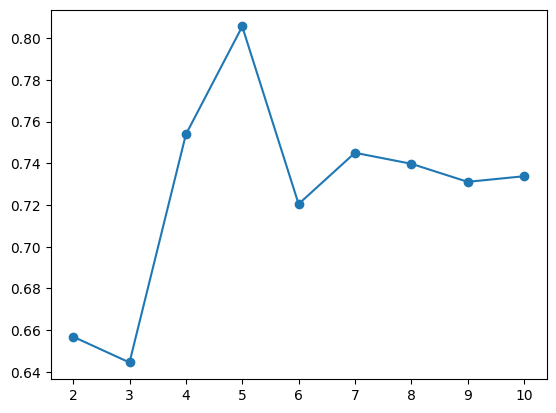

In [153]:
# parameters
best_k = 5 # centroid의 best 개수 -> elbow, 실루엣 두 방법을 비교하여 선정한다.
abnormal = 1 # 시뮬레이션에서 이상치 판독 기준 개수

# Best k 적합하기
best = KMeans(
        n_clusters = best_k,    # 클러스터 수 설정
        init="random",   # 초기 중심점을 무작위로 선택
        n_init="auto",    # k-means 알고리즘 반복 실행 횟수 설정
        random_state=42
    ).fit(use_train)

In [154]:
df_train['kmeans_5'] = best.labels_

In [155]:
df_test['kmeans_5'] = best.predict(use_test)

### 각 Stage별 새로운 Resin 값을 제시하기 위한 코드

In [156]:
## train
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_train['RESIN Predicted_Volume Stage1 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam']
df_train['RESIN Predicted_Volume Stage2 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam']
df_train['RESIN Predicted_Volume Stage3 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_train['Stage1 Scaling_Factor'] = df_train['Dispense Volume(Stage1) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage1 Dam']
df_train['Stage2 Scaling_Factor'] = df_train['Dispense Volume(Stage2) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage2 Dam']
df_train['Stage3 Scaling_Factor'] = df_train['Dispense Volume(Stage3) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage3 Dam']

# Stage별 조정된 예측 토출량 계산
df_train['RESIN Adjusted_Predicted_Volume Stage1 Dam'] = df_train['RESIN Predicted_Volume Stage1 Dam'] * df_train['Stage1 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage2 Dam'] = df_train['RESIN Predicted_Volume Stage2 Dam'] * df_train['Stage2 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage3 Dam'] = df_train['RESIN Predicted_Volume Stage3 Dam'] * df_train['Stage3 Scaling_Factor'].mean()

## test
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_test['RESIN Predicted_Volume Stage1 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam']
df_test['RESIN Predicted_Volume Stage2 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam']
df_test['RESIN Predicted_Volume Stage3 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_test['Stage1 Scaling_Factor'] = df_test['Dispense Volume(Stage1) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage1 Dam']
df_test['Stage2 Scaling_Factor'] = df_test['Dispense Volume(Stage2) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage2 Dam']
df_test['Stage3 Scaling_Factor'] = df_test['Dispense Volume(Stage3) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage3 Dam']

# Stage별 조정된 예측 토출량 계산
df_test['RESIN Adjusted_Predicted_Volume Stage1 Dam'] = df_test['RESIN Predicted_Volume Stage1 Dam'] * df_test['Stage1 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage2 Dam'] = df_test['RESIN Predicted_Volume Stage2 Dam'] * df_test['Stage2 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage3 Dam'] = df_test['RESIN Predicted_Volume Stage3 Dam'] * df_test['Stage3 Scaling_Factor'].mean()

In [157]:
## train
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_train['RESIN Predicted_Volume Stage1 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1']
df_train['RESIN Predicted_Volume Stage2 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1']
df_train['RESIN Predicted_Volume Stage3 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_train['Stage1 Scaling_Factor'] = df_train['Dispense Volume(Stage1) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage1 Fill1']
df_train['Stage2 Scaling_Factor'] = df_train['Dispense Volume(Stage2) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage2 Fill1']
df_train['Stage3 Scaling_Factor'] = df_train['Dispense Volume(Stage3) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage3 Fill1']

# Stage별 조정된 예측 토출량 계산
df_train['RESIN Adjusted_Predicted_Volume Stage1 Fill1'] = df_train['RESIN Predicted_Volume Stage1 Fill1'] * df_train['Stage1 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage2 Fill1'] = df_train['RESIN Predicted_Volume Stage2 Fill1'] * df_train['Stage2 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage3 Fill1'] = df_train['RESIN Predicted_Volume Stage3 Fill1'] * df_train['Stage3 Scaling_Factor'].mean()

## test
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_test['RESIN Predicted_Volume Stage1 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1']
df_test['RESIN Predicted_Volume Stage2 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1']
df_test['RESIN Predicted_Volume Stage3 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_test['Stage1 Scaling_Factor'] = df_test['Dispense Volume(Stage1) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage1 Fill1']
df_test['Stage2 Scaling_Factor'] = df_test['Dispense Volume(Stage2) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage2 Fill1']
df_test['Stage3 Scaling_Factor'] = df_test['Dispense Volume(Stage3) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage3 Fill1']

# Stage별 조정된 예측 토출량 계산
df_test['RESIN Adjusted_Predicted_Volume Stage1 Fill1'] = df_test['RESIN Predicted_Volume Stage1 Fill1'] * df_test['Stage1 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage2 Fill1'] = df_test['RESIN Predicted_Volume Stage2 Fill1'] * df_test['Stage2 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage3 Fill1'] = df_test['RESIN Predicted_Volume Stage3 Fill1'] * df_test['Stage3 Scaling_Factor'].mean()

### Type 수정

In [158]:
label_encoders = {}
categorical_features = ['Workorder_Dam', 'Model.Suffix_Dam']

# 시드 설정
np.random.seed(42)
for feature in categorical_features:
    le = LabelEncoder()
    df_train[feature] = le.fit_transform(df_train[feature])
    
    # 검증 데이터에 있는 새로운 값에 대해 처리
    unique_values = set(df_test[feature].unique()) - set(le.classes_)
    if unique_values:
        # 새로운 값들을 인코딩할 무작위 숫자 생성
        new_labels = np.random.randint(0, len(le.classes_), size=len(unique_values))
        # 새로운 값들을 인코딩
        le.classes_ = np.append(le.classes_, list(unique_values))
        le.transform(list(unique_values))  # transform을 호출해서 classes_ 업데이트
    
    df_test[feature] = le.transform(df_test[feature])
    label_encoders[feature] = le

### 변수 선택

In [159]:
df_train = df_train[sel_col]
df_test = df_test[sel_col]

### rename

In [160]:
# collect result 빼기
df_train.columns = df_train.columns.str.replace(' Collect Result', '')
df_test.columns = df_test.columns.str.replace(' Collect Result', '')

In [161]:
name_dic = {
    'Model.Suffix_Dam': 'Model.Suffix',
    'Workorder_Dam': 'Workorder',
    'Receip No_Dam': 'Receip',
    'Equipment_Dam': 'Equipment',
    'PalletID_Dam': 'PalletID'
}

df_train = df_train.rename(columns=name_dic)
df_test = df_test.rename(columns=name_dic)

# 이 아래부터 자유롭게 변환하여 사용하세요

## 위의 함수도 경우에 따라 자유롭게 변형해도 됩니다.

### target 0, 1 변환

In [162]:
df_train['target'] = np.where(df_train['target'] == 'Normal', 0, 1)

### Equipment별 데이터 나누기

In [163]:
df_train_equip1 = df_train[df_train['Equipment'] == '1']
df_test_equip1 = df_test[df_test['Equipment'] == '1']

In [164]:
df_train_equip2 = df_train[df_train['Equipment'] == '2']
df_test_equip2 = df_test[df_test['Equipment'] == '2']

In [165]:
equip1_index_train = df_train_equip1.index
equip2_index_train = df_train_equip2.index

equip1_index_test = df_test_equip1.index
equip2_index_test = df_test_equip2.index

In [166]:
df_train_equip1 = df_train[df_train['Equipment'] == '1'].reset_index(drop = True)
df_test_equip1 = df_test[df_test['Equipment'] == '1'].reset_index(drop = True)

df_train_equip2 = df_train[df_train['Equipment'] == '2'].reset_index(drop = True)
df_test_equip2 = df_test[df_test['Equipment'] == '2'].reset_index(drop = True)

## 5. 데이터 학습하기


### setting

In [43]:
# 변환 리스트
columns_to_convert = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
]  

# 변환할 컬럼명 리스트
columns_to = [
    'Head Zero Position Y_Dam',
    'Head Zero Position Z_Dam',
    'Head Clean Position Z_Dam',
    'Head Purge Position Z_Dam',
    'Head Purge Position Z_Fill1',
    'CURE START POSITION Z_Fill2',
    'CURE END POSITION Z_Fill2',
    'CURE SPEED_Fill2',
    'Stage1 Circle1 Distance Speed_Dam',
    'Stage2 Circle1 Distance Speed_Dam',
    'Stage3 Circle1 Distance Speed_Dam',
    'Stage1 Line diffent Distance Speed_Dam',
    'Stage2 Line diffent Distance Speed_Dam',
    'Stage3 Line diffent Distance Speed_Dam',
    'kmeans_5',
    'round_1st_time',
    'round_2nd_time',
    'round_3rd_time',
    'all_time'
]

In [44]:
cat_features_indices = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
] + columns_to

In [45]:
# data
cat_train, cat_test = variable_setting('catboost', df_train_equip1, df_test_equip1, columns_to_convert, columns_to)
lgbm_train, lgbm_test = variable_setting('lightgbm', df_train_equip1, df_test_equip1, columns_to_convert, columns_to)
xgb_train, xgb_test = variable_setting('xgboost', df_train_equip1, df_test_equip1, columns_to_convert, columns_to)

### Best_Params 얻기

In [46]:
# optuna tuning
cat_best_params, X_cat, y_cat, cat_train_index, cat_valid_index = catboost_optuna(cat_train, cat_features_indices)

[I 2024-08-22 11:06:12,353] A new study created in memory with name: no-name-519937fa-ef59-426a-bb4d-6141258d4b67
[I 2024-08-22 11:06:26,615] Trial 0 finished with value: 0.19983347210657784 and parameters: {'iterations': 437, 'depth': 10, 'learning_rate': 0.15702970884055384, 'l2_leaf_reg': 5.990598257128395, 'border_count': 66, 'random_strength': 1.559945204206032, 'bagging_temperature': 0.05808361216819946, 'od_type': 'IncToDec', 'od_wait': 39, 'boosting_type': 'Plain'}. Best is trial 0 with value: 0.19983347210657784.
[I 2024-08-22 11:06:42,849] Trial 1 finished with value: 0.1726716519374575 and parameters: {'iterations': 850, 'depth': 5, 'learning_rate': 0.0035113563139704067, 'l2_leaf_reg': 1.8422110534358038, 'border_count': 100, 'random_strength': 5.247564316797622, 'bagging_temperature': 0.43194501864211576, 'od_type': 'Iter', 'od_wait': 15, 'boosting_type': 'Plain'}. Best is trial 0 with value: 0.19983347210657784.
[I 2024-08-22 11:07:22,732] Trial 2 finished with value: 0.1

Best trial:
  Value: 0.21141649048625794
  Params: 
    iterations: 264
    depth: 7
    learning_rate: 0.24507275170156848
    l2_leaf_reg: 9.71229229873129
    border_count: 103
    random_strength: 2.7746741755435647
    bagging_temperature: 0.8631709972421505
    od_type: Iter
    od_wait: 10
    boosting_type: Ordered


In [47]:
# optuna tuning
lgbm_best_params, X_lgbm, y_lgbm, lgbm_train_index, lgbm_valid_index = lightgbm_optuna(lgbm_train, cat_features_indices)

[I 2024-08-22 11:17:46,276] A new study created in memory with name: no-name-57898e89-c455-4a94-b080-bd9fc79ad5aa


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:17:48,470] Trial 0 finished with value: 0.19409282700421943 and parameters: {'n_estimators': 812, 'max_depth': 60, 'learning_rate': 0.0029106359131330704, 'reg_alpha': 0.24810409748678125, 'reg_lambda': 0.004207988669606638, 'min_child_weight': 1.0459808211767092, 'min_child_samples': 10, 'subsample': 0.9197056874649611, 'subsample_freq': 3, 'colsample_bytree': 0.7664580622368364, 'num_leaves': 3}. Best is trial 0 with value: 0.19409282700421943.


Did not meet early stopping. Best iteration is:
[812]	valid_0's binary_logloss: 0.21235
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1467]	valid_0's binary_logloss: 0.219845


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:17:51,320] Trial 1 finished with value: 0.0 and parameters: {'n_estimators': 1467, 'max_depth': 53, 'learning_rate': 0.00026587543983272726, 'reg_alpha': 0.005337032762603957, 'reg_lambda': 0.00541524411940254, 'min_child_weight': 1.564847850358382, 'min_child_samples': 55, 'subsample': 0.6591670111852694, 'subsample_freq': 1, 'colsample_bytree': 0.6894823157779035, 'num_leaves': 10}. Best is trial 0 with value: 0.19409282700421943.


Training until validation scores don't improve for 50 rounds


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:17:52,201] Trial 2 finished with value: 0.0 and parameters: {'n_estimators': 721, 'max_depth': 25, 'learning_rate': 0.000816845589476017, 'reg_alpha': 1.382623217936987, 'reg_lambda': 0.006290644294586149, 'min_child_weight': 2.2998205344476403, 'min_child_samples': 61, 'subsample': 0.42787024763199866, 'subsample_freq': 3, 'colsample_bytree': 0.33641929894983325, 'num_leaves': 6}. Best is trial 0 with value: 0.19409282700421943.


Did not meet early stopping. Best iteration is:
[721]	valid_0's binary_logloss: 0.220439
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1039]	valid_0's binary_logloss: 0.210025


[I 2024-08-22 11:17:55,280] Trial 3 finished with value: 0.20938628158844763 and parameters: {'n_estimators': 1444, 'max_depth': 61, 'learning_rate': 0.004138040112561018, 'reg_alpha': 0.01653693718282442, 'reg_lambda': 0.002458603276328005, 'min_child_weight': 2.894815592792549, 'min_child_samples': 47, 'subsample': 0.47322294090686734, 'subsample_freq': 2, 'colsample_bytree': 0.22751081689217473, 'num_leaves': 59}. Best is trial 3 with value: 0.20938628158844763.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:17:57,919] Trial 4 finished with value: 0.1920152091254753 and parameters: {'n_estimators': 684, 'max_depth': 43, 'learning_rate': 0.0004201672054372534, 'reg_alpha': 0.12030178871154672, 'reg_lambda': 0.1537592023548176, 'min_child_weight': 1.1469905943393446, 'min_child_samples': 98, 'subsample': 0.8650796940166687, 'subsample_freq': 5, 'colsample_bytree': 0.915861880342119, 'num_leaves': 39}. Best is trial 3 with value: 0.20938628158844763.


Did not meet early stopping. Best iteration is:
[684]	valid_0's binary_logloss: 0.219982
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1414]	valid_0's binary_logloss: 0.217413


[I 2024-08-22 11:18:02,038] Trial 5 finished with value: 0.2048040455120101 and parameters: {'n_estimators': 1414, 'max_depth': 8, 'learning_rate': 0.0002465844721448739, 'reg_alpha': 0.0015167330688076208, 'reg_lambda': 0.02001342062287998, 'min_child_weight': 1.860370513913187, 'min_child_samples': 31, 'subsample': 0.8972425054911576, 'subsample_freq': 2, 'colsample_bytree': 0.4247476077499046, 'num_leaves': 36}. Best is trial 3 with value: 0.20938628158844763.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:03,957] Trial 6 finished with value: 0.19329896907216493 and parameters: {'n_estimators': 555, 'max_depth': 51, 'learning_rate': 0.00014096175149815865, 'reg_alpha': 8.862326508576253, 'reg_lambda': 1.2273800987852967, 'min_child_weight': 1.1955048853696035, 'min_child_samples': 5, 'subsample': 0.8892768570729005, 'subsample_freq': 4, 'colsample_bytree': 0.7832057344327898, 'num_leaves': 50}. Best is trial 3 with value: 0.20938628158844763.


Did not meet early stopping. Best iteration is:
[555]	valid_0's binary_logloss: 0.223123
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:05,431] Trial 7 finished with value: 0.19009370816599733 and parameters: {'n_estimators': 481, 'max_depth': 24, 'learning_rate': 0.0001705053926026929, 'reg_alpha': 2.8340904295147746, 'reg_lambda': 0.3113095956122124, 'min_child_weight': 1.6581430869842722, 'min_child_samples': 11, 'subsample': 0.5865893930293973, 'subsample_freq': 1, 'colsample_bytree': 0.7836849426704513, 'num_leaves': 42}. Best is trial 3 with value: 0.20938628158844763.


Did not meet early stopping. Best iteration is:
[481]	valid_0's binary_logloss: 0.222722
Training until validation scores don't improve for 50 rounds


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:18:07,190] Trial 8 finished with value: 0.0 and parameters: {'n_estimators': 1376, 'max_depth': 31, 'learning_rate': 0.00017345566642360953, 'reg_alpha': 0.7128188058401367, 'reg_lambda': 1.1044350847124695, 'min_child_weight': 2.4644701914932368, 'min_child_samples': 79, 'subsample': 0.6962773578186345, 'subsample_freq': 3, 'colsample_bytree': 0.5420328146868397, 'num_leaves': 3}. Best is trial 3 with value: 0.20938628158844763.


Did not meet early stopping. Best iteration is:
[1376]	valid_0's binary_logloss: 0.222506
Training until validation scores don't improve for 50 rounds


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:18:07,913] Trial 9 finished with value: 0.0 and parameters: {'n_estimators': 518, 'max_depth': 4, 'learning_rate': 0.0018742210985555703, 'reg_alpha': 0.018089390092767135, 'reg_lambda': 0.1082138291061399, 'min_child_weight': 3.6764826587413255, 'min_child_samples': 28, 'subsample': 0.6462297538213778, 'subsample_freq': 4, 'colsample_bytree': 0.383038532393298, 'num_leaves': 6}. Best is trial 3 with value: 0.20938628158844763.


Did not meet early stopping. Best iteration is:
[518]	valid_0's binary_logloss: 0.21794
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:09,258] Trial 10 finished with value: 0.2118811881188119 and parameters: {'n_estimators': 1123, 'max_depth': 44, 'learning_rate': 0.008691089486124973, 'reg_alpha': 0.024400771927662202, 'reg_lambda': 0.0011447070776131048, 'min_child_weight': 3.2574490847879742, 'min_child_samples': 39, 'subsample': 0.40669661435551696, 'subsample_freq': 0, 'colsample_bytree': 0.20984893565195006, 'num_leaves': 64}. Best is trial 10 with value: 0.2118811881188119.


Early stopping, best iteration is:
[502]	valid_0's binary_logloss: 0.209939
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:10,415] Trial 11 finished with value: 0.21166306695464362 and parameters: {'n_estimators': 1142, 'max_depth': 42, 'learning_rate': 0.009588418536116118, 'reg_alpha': 0.02344574163871334, 'reg_lambda': 0.0011066835670797846, 'min_child_weight': 3.228664519418552, 'min_child_samples': 38, 'subsample': 0.4047844499396721, 'subsample_freq': 0, 'colsample_bytree': 0.2484675793960146, 'num_leaves': 64}. Best is trial 10 with value: 0.2118811881188119.


Early stopping, best iteration is:
[383]	valid_0's binary_logloss: 0.208326
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:11,761] Trial 12 finished with value: 0.20798514391829154 and parameters: {'n_estimators': 1103, 'max_depth': 40, 'learning_rate': 0.009613909972104616, 'reg_alpha': 0.04481839128894382, 'reg_lambda': 0.001029636908767823, 'min_child_weight': 3.6985293534389845, 'min_child_samples': 37, 'subsample': 0.5126396185753415, 'subsample_freq': 0, 'colsample_bytree': 0.20362083825494987, 'num_leaves': 62}. Best is trial 10 with value: 0.2118811881188119.


Early stopping, best iteration is:
[475]	valid_0's binary_logloss: 0.210142
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:12,448] Trial 13 finished with value: 0.1947194719471947 and parameters: {'n_estimators': 1120, 'max_depth': 40, 'learning_rate': 0.009951044619173715, 'reg_alpha': 0.004266587910190727, 'reg_lambda': 7.266943511144061, 'min_child_weight': 3.119707737904152, 'min_child_samples': 67, 'subsample': 0.4170938644683172, 'subsample_freq': 0, 'colsample_bytree': 0.53216529309064, 'num_leaves': 22}. Best is trial 10 with value: 0.2118811881188119.


Early stopping, best iteration is:
[209]	valid_0's binary_logloss: 0.215366
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:14,157] Trial 14 finished with value: 0.21510297482837532 and parameters: {'n_estimators': 1176, 'max_depth': 49, 'learning_rate': 0.004973541716877472, 'reg_alpha': 0.04358090917703344, 'reg_lambda': 0.03132642408656095, 'min_child_weight': 3.1616848374638136, 'min_child_samples': 43, 'subsample': 0.5388818879978657, 'subsample_freq': 0, 'colsample_bytree': 0.29578283133055705, 'num_leaves': 52}. Best is trial 14 with value: 0.21510297482837532.


Early stopping, best iteration is:
[639]	valid_0's binary_logloss: 0.208109
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[838]	valid_0's binary_logloss: 0.211888


[I 2024-08-22 11:18:16,749] Trial 15 finished with value: 0.20523138832997986 and parameters: {'n_estimators': 957, 'max_depth': 51, 'learning_rate': 0.0046043509881095335, 'reg_alpha': 0.1778490002051104, 'reg_lambda': 0.02855937068226843, 'min_child_weight': 3.957633996251157, 'min_child_samples': 23, 'subsample': 0.5467216284935695, 'subsample_freq': 1, 'colsample_bytree': 0.43439298213168176, 'num_leaves': 52}. Best is trial 14 with value: 0.21510297482837532.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1256]	valid_0's binary_logloss: 0.210715


[I 2024-08-22 11:18:19,849] Trial 16 finished with value: 0.20308483290488435 and parameters: {'n_estimators': 1256, 'max_depth': 33, 'learning_rate': 0.0012027906411716696, 'reg_alpha': 0.051684434759865, 'reg_lambda': 0.021443548352303755, 'min_child_weight': 2.733695028537947, 'min_child_samples': 46, 'subsample': 0.8006754697504556, 'subsample_freq': 1, 'colsample_bytree': 0.31293543211040964, 'num_leaves': 51}. Best is trial 14 with value: 0.21510297482837532.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:20,872] Trial 17 finished with value: 0.20021528525296017 and parameters: {'n_estimators': 952, 'max_depth': 14, 'learning_rate': 0.005884144791687234, 'reg_alpha': 0.006737358642745858, 'reg_lambda': 0.04133206909441451, 'min_child_weight': 0.542895712277309, 'min_child_samples': 70, 'subsample': 0.9947663176861599, 'subsample_freq': 0, 'colsample_bytree': 0.49979292354263916, 'num_leaves': 26}. Best is trial 14 with value: 0.21510297482837532.


Early stopping, best iteration is:
[364]	valid_0's binary_logloss: 0.213757
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1232]	valid_0's binary_logloss: 0.211312


[I 2024-08-22 11:18:24,608] Trial 18 finished with value: 0.20116054158607352 and parameters: {'n_estimators': 1232, 'max_depth': 47, 'learning_rate': 0.002006032740306424, 'reg_alpha': 0.001058427819837614, 'reg_lambda': 0.012540311943291471, 'min_child_weight': 3.384158562531583, 'min_child_samples': 23, 'subsample': 0.5889387797811585, 'subsample_freq': 2, 'colsample_bytree': 0.29902874321501566, 'num_leaves': 55}. Best is trial 14 with value: 0.21510297482837532.


Training until validation scores don't improve for 50 rounds


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:18:25,601] Trial 19 finished with value: 0.0 and parameters: {'n_estimators': 1019, 'max_depth': 24, 'learning_rate': 0.0056760760560819615, 'reg_alpha': 0.637365735518874, 'reg_lambda': 0.6326322581799338, 'min_child_weight': 2.5909059981343057, 'min_child_samples': 84, 'subsample': 0.49942187300528806, 'subsample_freq': 0, 'colsample_bytree': 0.9550926416247638, 'num_leaves': 45}. Best is trial 14 with value: 0.21510297482837532.


Early stopping, best iteration is:
[191]	valid_0's binary_logloss: 0.216052
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:27,956] Trial 20 finished with value: 0.1935483870967742 and parameters: {'n_estimators': 833, 'max_depth': 54, 'learning_rate': 0.0006747716169120554, 'reg_alpha': 0.06273452264824793, 'reg_lambda': 0.053876546774528224, 'min_child_weight': 3.012978855185204, 'min_child_samples': 50, 'subsample': 0.7465548799232171, 'subsample_freq': 1, 'colsample_bytree': 0.6717766953364164, 'num_leaves': 30}. Best is trial 14 with value: 0.21510297482837532.


Did not meet early stopping. Best iteration is:
[833]	valid_0's binary_logloss: 0.215729
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:29,202] Trial 21 finished with value: 0.21627647714604234 and parameters: {'n_estimators': 1272, 'max_depth': 45, 'learning_rate': 0.007384032597635914, 'reg_alpha': 0.024258620126805363, 'reg_lambda': 0.0013580700166869236, 'min_child_weight': 3.2264784424750865, 'min_child_samples': 39, 'subsample': 0.4037914642523681, 'subsample_freq': 0, 'colsample_bytree': 0.2642298840435963, 'num_leaves': 64}. Best is trial 21 with value: 0.21627647714604234.


Early stopping, best iteration is:
[406]	valid_0's binary_logloss: 0.208301
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[912]	valid_0's binary_logloss: 0.208563


[I 2024-08-22 11:18:31,692] Trial 22 finished with value: 0.20607375271149672 and parameters: {'n_estimators': 1278, 'max_depth': 46, 'learning_rate': 0.003050863205982284, 'reg_alpha': 0.011932813654651302, 'reg_lambda': 0.0022551247376062077, 'min_child_weight': 3.534321602711528, 'min_child_samples': 38, 'subsample': 0.4629342233157273, 'subsample_freq': 0, 'colsample_bytree': 0.289579122403715, 'num_leaves': 58}. Best is trial 21 with value: 0.21627647714604234.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:33,130] Trial 23 finished with value: 0.2073170731707317 and parameters: {'n_estimators': 1321, 'max_depth': 35, 'learning_rate': 0.0064632659314069335, 'reg_alpha': 0.0354869595089324, 'reg_lambda': 0.009585986410727282, 'min_child_weight': 3.8685152669459466, 'min_child_samples': 56, 'subsample': 0.5590596782377714, 'subsample_freq': 1, 'colsample_bytree': 0.3785452509626802, 'num_leaves': 64}. Best is trial 21 with value: 0.21627647714604234.


Early stopping, best iteration is:
[413]	valid_0's binary_logloss: 0.213224
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1176]	valid_0's binary_logloss: 0.209569


[I 2024-08-22 11:18:35,527] Trial 24 finished with value: 0.21721311475409835 and parameters: {'n_estimators': 1176, 'max_depth': 56, 'learning_rate': 0.0028479103150092513, 'reg_alpha': 0.0977711090700889, 'reg_lambda': 0.0024484545895935655, 'min_child_weight': 3.344619931724392, 'min_child_samples': 42, 'subsample': 0.458937619792177, 'subsample_freq': 0, 'colsample_bytree': 0.2024027773163428, 'num_leaves': 47}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1106]	valid_0's binary_logloss: 0.20772


[I 2024-08-22 11:18:38,124] Trial 25 finished with value: 0.2125874125874126 and parameters: {'n_estimators': 1215, 'max_depth': 58, 'learning_rate': 0.0027573418576072994, 'reg_alpha': 0.31892488511602, 'reg_lambda': 0.0027382683167750787, 'min_child_weight': 2.108725799155482, 'min_child_samples': 20, 'subsample': 0.5244844929469674, 'subsample_freq': 0, 'colsample_bytree': 0.27626341277564, 'num_leaves': 47}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1048]	valid_0's binary_logloss: 0.214525


[I 2024-08-22 11:18:41,569] Trial 26 finished with value: 0.20169491525423727 and parameters: {'n_estimators': 1048, 'max_depth': 56, 'learning_rate': 0.0013751732692009267, 'reg_alpha': 0.09901158241908094, 'reg_lambda': 0.008120625060856, 'min_child_weight': 2.8378025975718346, 'min_child_samples': 45, 'subsample': 0.454350910529233, 'subsample_freq': 1, 'colsample_bytree': 0.4587414771891467, 'num_leaves': 55}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[842]	valid_0's binary_logloss: 0.209937


[I 2024-08-22 11:18:44,185] Trial 27 finished with value: 0.21014492753623187 and parameters: {'n_estimators': 1351, 'max_depth': 48, 'learning_rate': 0.004042452602326644, 'reg_alpha': 0.09658999634755197, 'reg_lambda': 0.002491944117068804, 'min_child_weight': 3.394597968921266, 'min_child_samples': 31, 'subsample': 0.6075497865125606, 'subsample_freq': 2, 'colsample_bytree': 0.35747096622483976, 'num_leaves': 44}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[801]	valid_0's binary_logloss: 0.214307


[I 2024-08-22 11:18:47,177] Trial 28 finished with value: 0.19527896995708155 and parameters: {'n_estimators': 1204, 'max_depth': 37, 'learning_rate': 0.0019474813527405011, 'reg_alpha': 0.009997350674808994, 'reg_lambda': 0.052540047478870526, 'min_child_weight': 3.567667344693259, 'min_child_samples': 63, 'subsample': 0.4856119276971165, 'subsample_freq': 0, 'colsample_bytree': 0.6085744858680346, 'num_leaves': 56}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[862]	valid_0's binary_logloss: 0.211682


[I 2024-08-22 11:18:49,775] Trial 29 finished with value: 0.2033613445378151 and parameters: {'n_estimators': 865, 'max_depth': 59, 'learning_rate': 0.0028705515412836527, 'reg_alpha': 0.0024436355411783417, 'reg_lambda': 0.003926223962047188, 'min_child_weight': 2.561947188562732, 'min_child_samples': 17, 'subsample': 0.44216301030877986, 'subsample_freq': 1, 'colsample_bytree': 0.261820441037179, 'num_leaves': 49}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:18:50,987] Trial 30 finished with value: 0.19801980198019803 and parameters: {'n_estimators': 1018, 'max_depth': 63, 'learning_rate': 0.0067196280231929225, 'reg_alpha': 0.3458181268929682, 'reg_lambda': 0.014059523241099218, 'min_child_weight': 3.0038951124348774, 'min_child_samples': 42, 'subsample': 0.5301027587109116, 'subsample_freq': 5, 'colsample_bytree': 0.40580278133065595, 'num_leaves': 40}. Best is trial 24 with value: 0.21721311475409835.


Early stopping, best iteration is:
[406]	valid_0's binary_logloss: 0.211484
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1148]	valid_0's binary_logloss: 0.20777


[I 2024-08-22 11:18:53,646] Trial 31 finished with value: 0.2139917695473251 and parameters: {'n_estimators': 1187, 'max_depth': 56, 'learning_rate': 0.0026327573018934307, 'reg_alpha': 0.3019714225456956, 'reg_lambda': 0.0034715404985917356, 'min_child_weight': 2.0485173594840145, 'min_child_samples': 16, 'subsample': 0.5009853630142763, 'subsample_freq': 0, 'colsample_bytree': 0.28586852037654126, 'num_leaves': 46}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[842]	valid_0's binary_logloss: 0.207903


[I 2024-08-22 11:18:55,545] Trial 32 finished with value: 0.21276595744680854 and parameters: {'n_estimators': 1499, 'max_depth': 55, 'learning_rate': 0.00354026651317479, 'reg_alpha': 0.24836330216341476, 'reg_lambda': 0.004111135664301367, 'min_child_weight': 2.0499716687158993, 'min_child_samples': 14, 'subsample': 0.6358612702993303, 'subsample_freq': 0, 'colsample_bytree': 0.3252400319201991, 'num_leaves': 33}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1191]	valid_0's binary_logloss: 0.213173


[I 2024-08-22 11:18:59,235] Trial 33 finished with value: 0.20374707259953162 and parameters: {'n_estimators': 1191, 'max_depth': 49, 'learning_rate': 0.002513614870168434, 'reg_alpha': 0.15951121363014362, 'reg_lambda': 0.006050498167332187, 'min_child_weight': 2.321394609254788, 'min_child_samples': 56, 'subsample': 0.4559552131690178, 'subsample_freq': 1, 'colsample_bytree': 0.2642145512054275, 'num_leaves': 60}. Best is trial 24 with value: 0.21721311475409835.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1033]	valid_0's binary_logloss: 0.20793


[I 2024-08-22 11:19:01,484] Trial 34 finished with value: 0.21841890790546042 and parameters: {'n_estimators': 1295, 'max_depth': 60, 'learning_rate': 0.005035104517725432, 'reg_alpha': 0.495574690292596, 'reg_lambda': 0.0016619751828743639, 'min_child_weight': 1.454887068161148, 'min_child_samples': 26, 'subsample': 0.5607317356799041, 'subsample_freq': 0, 'colsample_bytree': 0.20072589174180644, 'num_leaves': 53}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1000]	valid_0's binary_logloss: 0.209548


[I 2024-08-22 11:19:03,744] Trial 35 finished with value: 0.21359223300970873 and parameters: {'n_estimators': 1332, 'max_depth': 61, 'learning_rate': 0.00463854238763505, 'reg_alpha': 1.394332931145274, 'reg_lambda': 0.0018009962334569031, 'min_child_weight': 1.403787385149812, 'min_child_samples': 32, 'subsample': 0.5590578496147641, 'subsample_freq': 1, 'colsample_bytree': 0.20435760556080698, 'num_leaves': 52}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:19:04,566] Trial 36 finished with value: 0.2027231467473525 and parameters: {'n_estimators': 1296, 'max_depth': 63, 'learning_rate': 0.0076350951946101255, 'reg_alpha': 0.6810203746488598, 'reg_lambda': 0.001415137210918627, 'min_child_weight': 0.9970037282616495, 'min_child_samples': 52, 'subsample': 0.7050538335315042, 'subsample_freq': 0, 'colsample_bytree': 0.35638204010219665, 'num_leaves': 15}. Best is trial 34 with value: 0.21841890790546042.


Early stopping, best iteration is:
[416]	valid_0's binary_logloss: 0.213101
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[854]	valid_0's binary_logloss: 0.209391


[I 2024-08-22 11:19:06,963] Trial 37 finished with value: 0.21421800947867298 and parameters: {'n_estimators': 1425, 'max_depth': 51, 'learning_rate': 0.005169053400921551, 'reg_alpha': 0.06639699250120061, 'reg_lambda': 0.007425893310239383, 'min_child_weight': 0.7248367467368504, 'min_child_samples': 26, 'subsample': 0.4362880857072544, 'subsample_freq': 2, 'colsample_bytree': 0.2390082785113067, 'num_leaves': 59}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1078]	valid_0's binary_logloss: 0.211865


[I 2024-08-22 11:19:10,559] Trial 38 finished with value: 0.19158878504672897 and parameters: {'n_estimators': 1078, 'max_depth': 28, 'learning_rate': 0.000768312126758524, 'reg_alpha': 0.03138680324653089, 'reg_lambda': 0.0016341402723448494, 'min_child_weight': 1.7855209903331797, 'min_child_samples': 43, 'subsample': 0.4736119322085882, 'subsample_freq': 0, 'colsample_bytree': 0.8400736305100416, 'num_leaves': 36}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1394]	valid_0's binary_logloss: 0.21898


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:19:13,477] Trial 39 finished with value: 0.0 and parameters: {'n_estimators': 1394, 'max_depth': 53, 'learning_rate': 0.0005299852270990844, 'reg_alpha': 5.35858777930439, 'reg_lambda': 0.18907701403264524, 'min_child_weight': 2.7999084773452165, 'min_child_samples': 33, 'subsample': 0.6229070865566718, 'subsample_freq': 4, 'colsample_bytree': 0.3198207716881718, 'num_leaves': 55}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:19:14,562] Trial 40 finished with value: 0.1960352422907489 and parameters: {'n_estimators': 411, 'max_depth': 59, 'learning_rate': 0.0036231868334694693, 'reg_alpha': 1.026040748623305, 'reg_lambda': 3.0003443152391696, 'min_child_weight': 1.3466593857617628, 'min_child_samples': 49, 'subsample': 0.5816648820860745, 'subsample_freq': 3, 'colsample_bytree': 0.24669867547495242, 'num_leaves': 48}. Best is trial 34 with value: 0.21841890790546042.


Did not meet early stopping. Best iteration is:
[411]	valid_0's binary_logloss: 0.216
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[722]	valid_0's binary_logloss: 0.208427


[I 2024-08-22 11:19:16,651] Trial 41 finished with value: 0.20742358078602618 and parameters: {'n_estimators': 1442, 'max_depth': 52, 'learning_rate': 0.00502904598350779, 'reg_alpha': 0.07022403342013414, 'reg_lambda': 0.005655910657509175, 'min_child_weight': 0.785049430555538, 'min_child_samples': 26, 'subsample': 0.4338540311996557, 'subsample_freq': 2, 'colsample_bytree': 0.22502951038765695, 'num_leaves': 59}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:19:18,328] Trial 42 finished with value: 0.19937694704049844 and parameters: {'n_estimators': 1415, 'max_depth': 45, 'learning_rate': 0.007315529396595764, 'reg_alpha': 0.16174103086653574, 'reg_lambda': 0.008173488466772776, 'min_child_weight': 0.5145611311943014, 'min_child_samples': 27, 'subsample': 0.43266906830671237, 'subsample_freq': 4, 'colsample_bytree': 0.20102645568853386, 'num_leaves': 60}. Best is trial 34 with value: 0.21841890790546042.


Early stopping, best iteration is:
[613]	valid_0's binary_logloss: 0.210553
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[858]	valid_0's binary_logloss: 0.20914


[I 2024-08-22 11:19:20,689] Trial 43 finished with value: 0.212180746561886 and parameters: {'n_estimators': 1477, 'max_depth': 50, 'learning_rate': 0.005389012894093498, 'reg_alpha': 0.07468943009501697, 'reg_lambda': 0.013989751885980025, 'min_child_weight': 0.874295874621891, 'min_child_samples': 35, 'subsample': 0.40387063422142283, 'subsample_freq': 2, 'colsample_bytree': 0.24286131583774437, 'num_leaves': 53}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[727]	valid_0's binary_logloss: 0.208044


[I 2024-08-22 11:19:22,751] Trial 44 finished with value: 0.2118742724097788 and parameters: {'n_estimators': 733, 'max_depth': 57, 'learning_rate': 0.003681982170304805, 'reg_alpha': 0.018353495858034755, 'reg_lambda': 0.0031173486489951244, 'min_child_weight': 1.5447077738702957, 'min_child_samples': 8, 'subsample': 0.6809108271201036, 'subsample_freq': 1, 'colsample_bytree': 0.35855752819150855, 'num_leaves': 57}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[642]	valid_0's binary_logloss: 0.212533


[I 2024-08-22 11:19:24,711] Trial 45 finished with value: 0.20359281437125748 and parameters: {'n_estimators': 1368, 'max_depth': 41, 'learning_rate': 0.00720965668239179, 'reg_alpha': 0.03710028000295916, 'reg_lambda': 0.001987640097819219, 'min_child_weight': 3.173781316789756, 'min_child_samples': 40, 'subsample': 0.487727270940015, 'subsample_freq': 3, 'colsample_bytree': 0.23830169028227807, 'num_leaves': 61}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1155]	valid_0's binary_logloss: 0.207752


[I 2024-08-22 11:19:27,309] Trial 46 finished with value: 0.21114369501466276 and parameters: {'n_estimators': 1157, 'max_depth': 53, 'learning_rate': 0.0022020893597849067, 'reg_alpha': 0.0111519380753961, 'reg_lambda': 0.005984684912126968, 'min_child_weight': 1.0878344063256307, 'min_child_samples': 21, 'subsample': 0.5236958481196748, 'subsample_freq': 0, 'colsample_bytree': 0.34038152353820483, 'num_leaves': 42}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:19:29,173] Trial 47 finished with value: 0.1973164956590371 and parameters: {'n_estimators': 1270, 'max_depth': 44, 'learning_rate': 0.004303612471850099, 'reg_alpha': 0.40819077909126145, 'reg_lambda': 0.03420957319087249, 'min_child_weight': 0.7220304398400164, 'min_child_samples': 100, 'subsample': 0.43444752995786695, 'subsample_freq': 0, 'colsample_bytree': 0.4609129930466556, 'num_leaves': 50}. Best is trial 34 with value: 0.21841890790546042.


Early stopping, best iteration is:
[577]	valid_0's binary_logloss: 0.213617
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1445]	valid_0's binary_logloss: 0.220503


/tmp/ipykernel_1429/3135720735.py:38: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recall*precision / (recall + precision)
[I 2024-08-22 11:19:33,047] Trial 48 finished with value: 0.0 and parameters: {'n_estimators': 1445, 'max_depth': 38, 'learning_rate': 0.00030501040555902406, 'reg_alpha': 1.9301979194529617, 'reg_lambda': 0.023890536498766025, 'min_child_weight': 3.3680873138854013, 'min_child_samples': 29, 'subsample': 0.4751007286593077, 'subsample_freq': 1, 'colsample_bytree': 0.29268433585336806, 'num_leaves': 62}. Best is trial 34 with value: 0.21841890790546042.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:19:34,133] Trial 49 finished with value: 0.20575221238938052 and parameters: {'n_estimators': 1312, 'max_depth': 49, 'learning_rate': 0.008300045968963774, 'reg_alpha': 0.14426551660897174, 'reg_lambda': 0.001005530878281603, 'min_child_weight': 1.2582072463293497, 'min_child_samples': 60, 'subsample': 0.5475486270902242, 'subsample_freq': 0, 'colsample_bytree': 0.40463077469314435, 'num_leaves': 54}. Best is trial 34 with value: 0.21841890790546042.


Early stopping, best iteration is:
[318]	valid_0's binary_logloss: 0.212367
Best trial:
  Value: 0.21841890790546042
  Params: 
    n_estimators: 1295
    max_depth: 60
    learning_rate: 0.005035104517725432
    reg_alpha: 0.495574690292596
    reg_lambda: 0.0016619751828743639
    min_child_weight: 1.454887068161148
    min_child_samples: 26
    subsample: 0.5607317356799041
    subsample_freq: 0
    colsample_bytree: 0.20072589174180644
    num_leaves: 53


In [48]:
# optuna tuning
xgb_best_params, X_xgb, y_xgb, xgb_train_index, xgb_valid_index = xgboost_optuna(xgb_train, cat_features_indices)

[I 2024-08-22 11:19:34,153] A new study created in memory with name: no-name-47ce2831-93b3-4eb4-ad0f-7a6dcc19bd9b
[I 2024-08-22 11:19:34,633] Trial 0 finished with value: 0.1989708404802744 and parameters: {'n_estimators': 437, 'max_depth': 10, 'learning_rate': 0.15702970884055384, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'gamma': 0.7799726016810132, 'lambda': 0.0017073967431528124, 'alpha': 2.9154431891537547}. Best is trial 0 with value: 0.1989708404802744.
[I 2024-08-22 11:19:38,754] Trial 1 finished with value: 0.20670391061452514 and parameters: {'n_estimators': 641, 'max_depth': 8, 'learning_rate': 0.00115279871282324, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'gamma': 1.0616955533913808, 'lambda': 0.005337032762603957, 'alpha': 0.00541524411940254}. Best is trial 1 with value: 0.20670391061452514.
[I 2024-08-22 11:19:40,019] Trial 2 finished with value: 0.20718816067653278 and parameters: {'n_estimators': 374, 'max_d

Best trial:
  Value: 0.21739130434782608
  Params: 
    n_estimators: 614
    max_depth: 3
    learning_rate: 0.001023259619263001
    subsample: 0.9701330396670377
    colsample_bytree: 0.5798683888789545
    gamma: 1.008547677668823
    lambda: 0.008829261014562927
    alpha: 0.005469770936677748


### Models

In [49]:
# catboost
X_train_cat_last = cat_train.loc[cat_train_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_train_cat_last = cat_train.loc[cat_train_index, 'target'].reset_index(drop=True)

X_valid_cat_last = cat_train.loc[cat_valid_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_cat_last = cat_train.loc[cat_valid_index, 'target'].reset_index(drop=True)

X_cat = cat_train.loc[:, cat_train.columns.difference(['target'])]
y_cat = cat_train.loc[:, 'target']

X_test_cat = cat_test.loc[:, cat_test.columns.difference(['Set ID', 'target'])]

In [50]:
# lightgbm
X_train_lgbm_last = lgbm_train.loc[lgbm_train_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_train_lgbm_last = lgbm_train.loc[lgbm_train_index, 'target'].reset_index(drop=True)

X_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, 'target'].reset_index(drop=True)

X_lgbm = lgbm_train.loc[:, lgbm_train.columns.difference(['target'])]
y_lgbm = lgbm_train.loc[:, 'target']

X_test_lgbm = lgbm_test.loc[:, lgbm_test.columns.difference(['Set ID', 'target'])]

In [51]:
# xgboost
X_train_xgb_last = xgb_train.loc[xgb_train_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_train_xgb_last = xgb_train.loc[xgb_train_index, 'target'].reset_index(drop=True)

X_valid_xgb_last = xgb_train.loc[xgb_valid_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_xgb_last = xgb_train.loc[xgb_valid_index, 'target'].reset_index(drop=True)

X_xgb = xgb_train.loc[:, xgb_train.columns.difference(['target'])]
y_xgb = xgb_train.loc[:, 'target']

X_test_xgb = xgb_test.loc[:, xgb_test.columns.difference(['Set ID', 'target'])]

#### Startified CV

In [52]:
# parameter 지정
# gap: train 이후 몇개를 사용하지 않을것인지 정하기 위한 파라미터
tscv = StratifiedKFold(n_splits = 10, random_state=42, shuffle = True)

#### Catboost

0:	learn: 0.4496834	test: 0.4498717	best: 0.4498717 (0)	total: 59.7ms	remaining: 15.7s
100:	learn: 0.1928506	test: 0.2153605	best: 0.2152456 (70)	total: 6.97s	remaining: 11.3s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2152455911
bestIteration = 70

Shrink model to first 71 iterations.


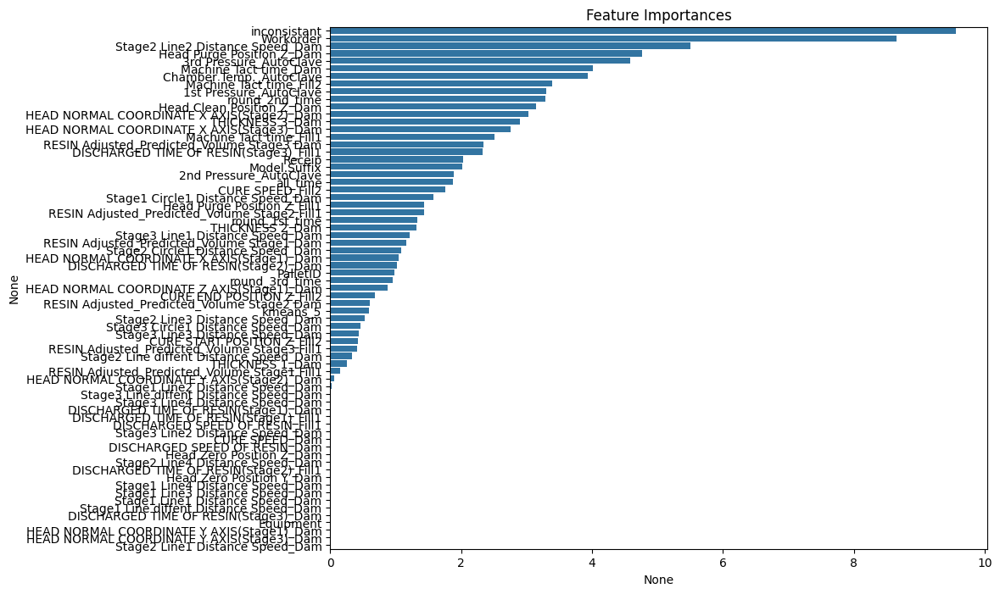

0:	learn: 0.4497143	test: 0.4493286	best: 0.4493286 (0)	total: 71.6ms	remaining: 18.8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2128102608
bestIteration = 13

Shrink model to first 14 iterations.


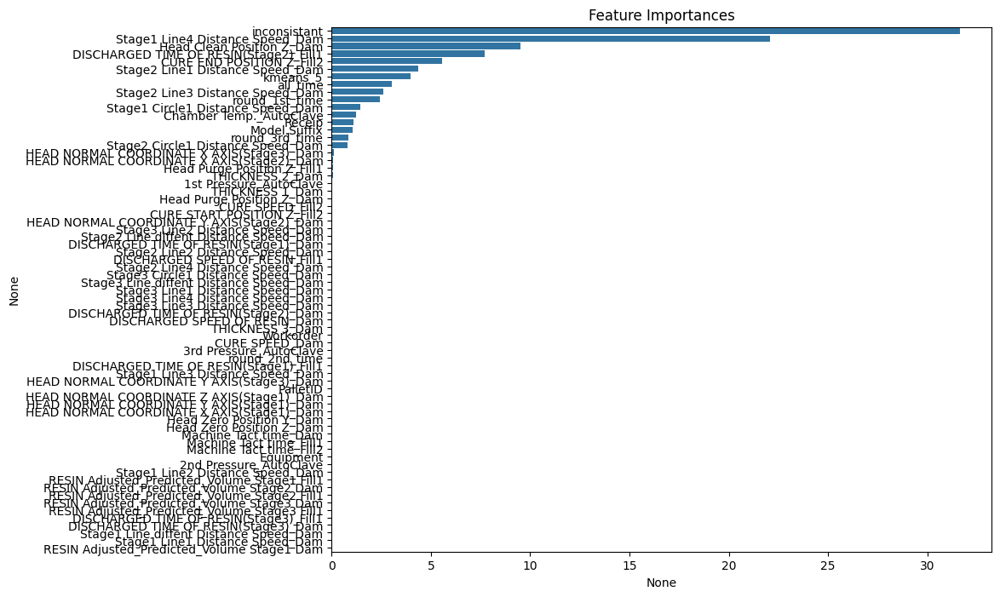

0:	learn: 0.4497274	test: 0.4498675	best: 0.4498675 (0)	total: 84.4ms	remaining: 22.2s
100:	learn: 0.1889398	test: 0.2102469	best: 0.2093201 (88)	total: 6.33s	remaining: 10.2s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2093200659
bestIteration = 88

Shrink model to first 89 iterations.


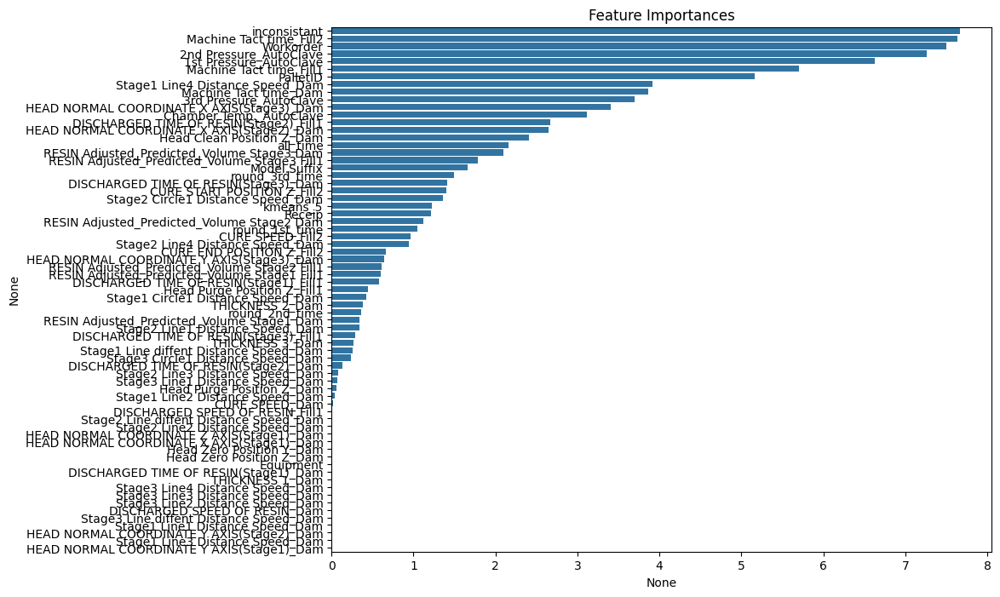

0:	learn: 0.4497148	test: 0.4491607	best: 0.4491607 (0)	total: 81.7ms	remaining: 21.5s
100:	learn: 0.1898229	test: 0.2103179	best: 0.2075771 (68)	total: 6.43s	remaining: 10.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2075770817
bestIteration = 68

Shrink model to first 69 iterations.


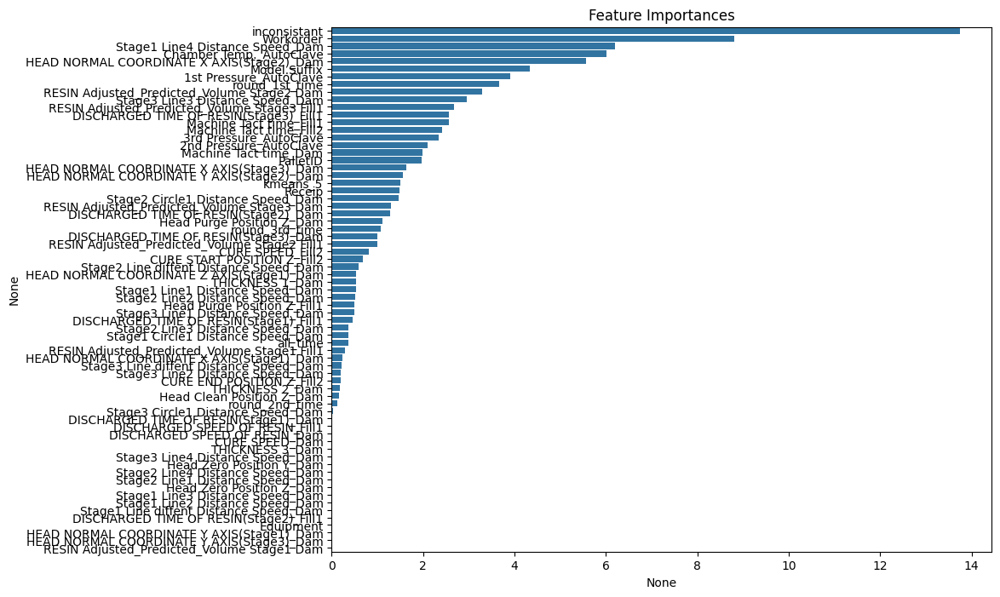

0:	learn: 0.4511046	test: 0.4507805	best: 0.4507805 (0)	total: 28.3ms	remaining: 7.43s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2103519475
bestIteration = 44

Shrink model to first 45 iterations.


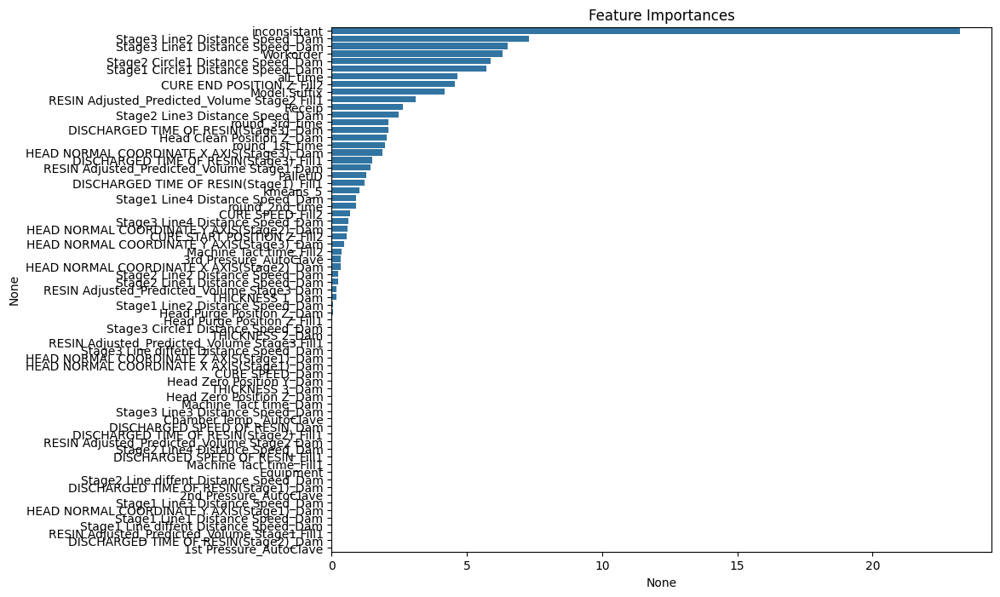

0:	learn: 0.4479511	test: 0.4487003	best: 0.4487003 (0)	total: 132ms	remaining: 34.7s
100:	learn: 0.1902230	test: 0.2054246	best: 0.2032780 (61)	total: 7.11s	remaining: 11.5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2032780473
bestIteration = 61

Shrink model to first 62 iterations.


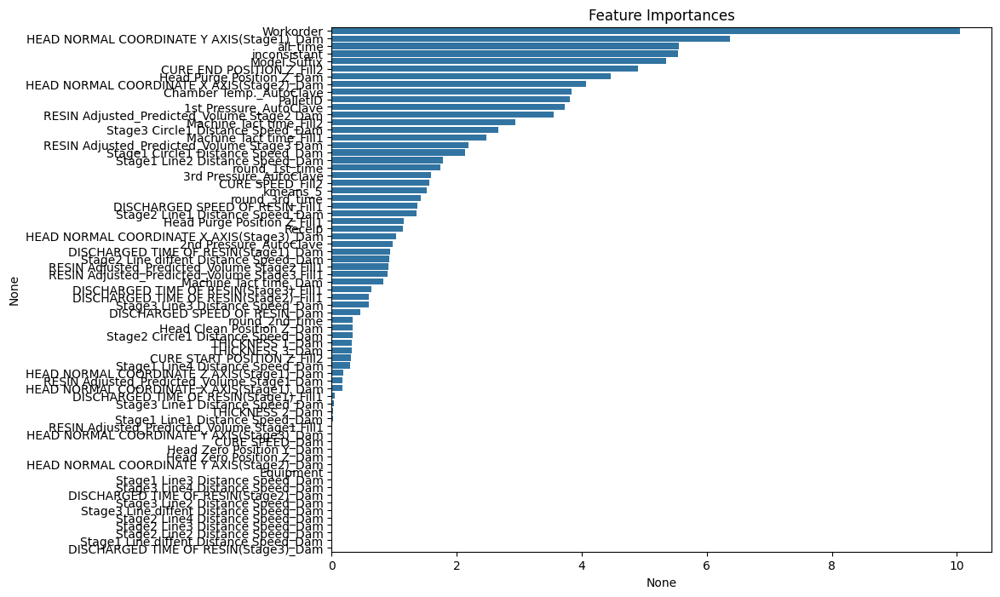

0:	learn: 0.4510046	test: 0.4510551	best: 0.4510551 (0)	total: 25.1ms	remaining: 6.61s
100:	learn: 0.1908272	test: 0.2050881	best: 0.2050483 (95)	total: 6.14s	remaining: 9.91s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2049242474
bestIteration = 115

Shrink model to first 116 iterations.


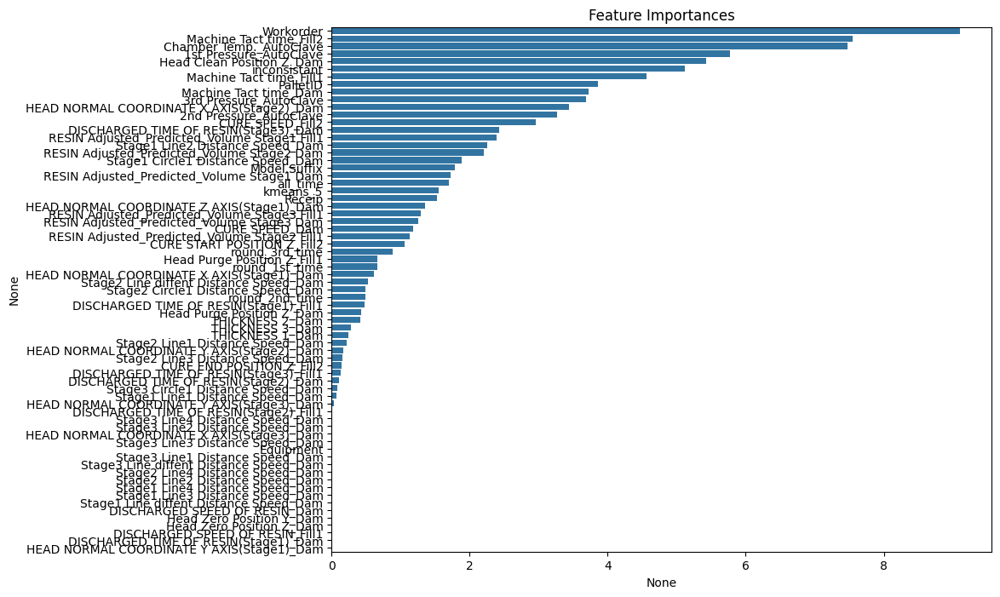

0:	learn: 0.4509856	test: 0.4510430	best: 0.4510430 (0)	total: 23.9ms	remaining: 6.28s
100:	learn: 0.1939179	test: 0.2068175	best: 0.2053125 (64)	total: 6.59s	remaining: 10.6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2053124983
bestIteration = 64

Shrink model to first 65 iterations.


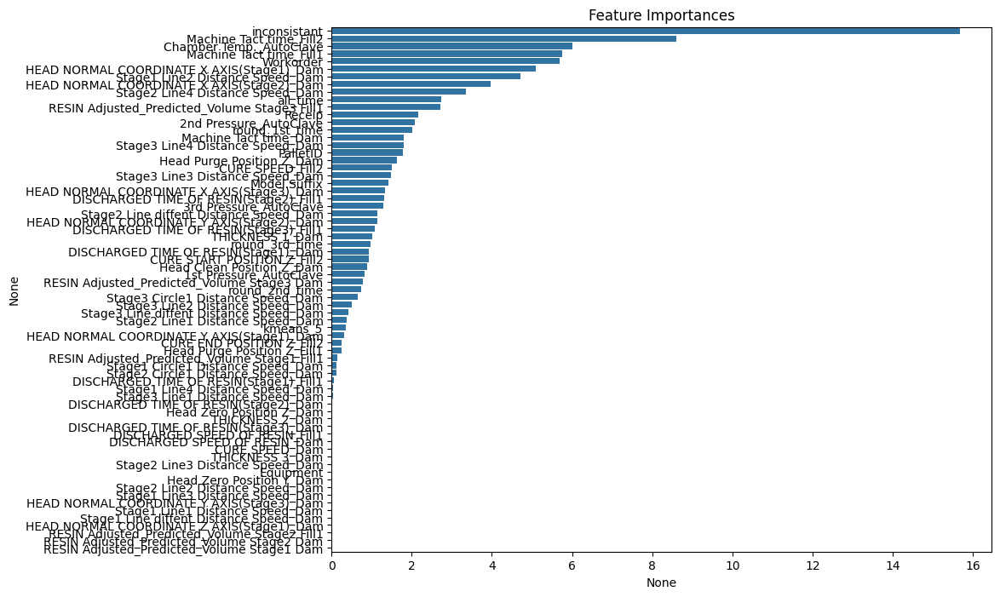

0:	learn: 0.4510046	test: 0.4510551	best: 0.4510551 (0)	total: 28.4ms	remaining: 7.47s
100:	learn: 0.1954378	test: 0.2054114	best: 0.2050840 (97)	total: 5.53s	remaining: 8.92s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2050839636
bestIteration = 97

Shrink model to first 98 iterations.


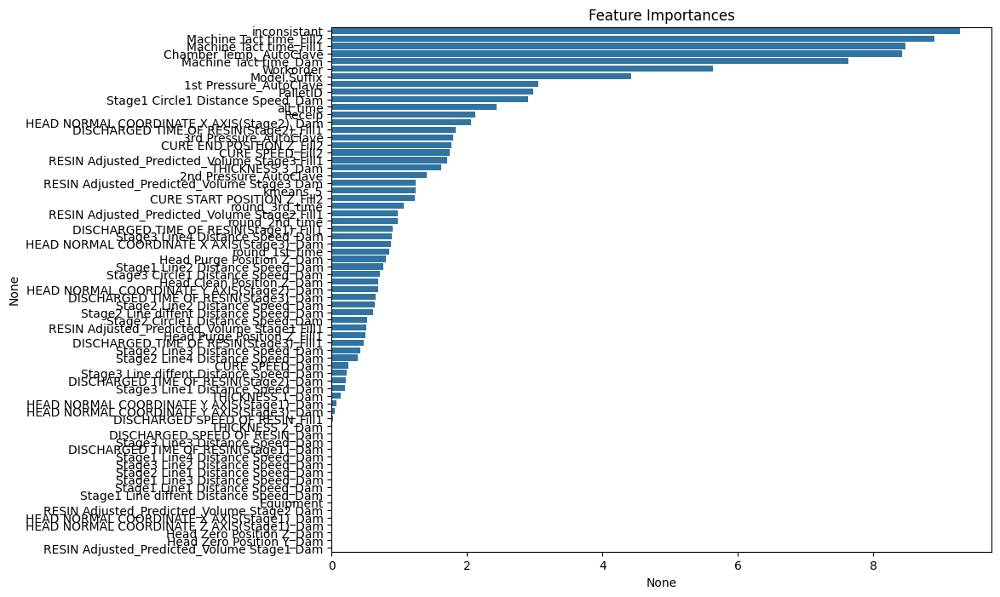

0:	learn: 0.4477781	test: 0.4469917	best: 0.4469917 (0)	total: 132ms	remaining: 34.6s
100:	learn: 0.1928092	test: 0.2075557	best: 0.2067335 (55)	total: 6.15s	remaining: 9.92s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2067335494
bestIteration = 55

Shrink model to first 56 iterations.


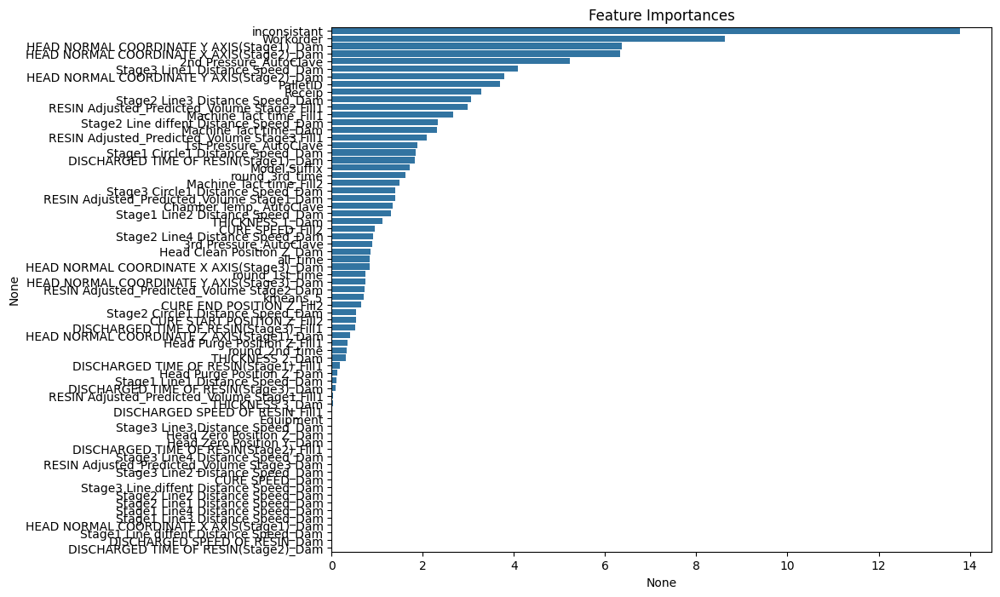

In [53]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_cat_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_cat_last, y_train_cat_last):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)
    
    
    # fit the model
    cat_best_model.fit(
        X_train_cat_last.iloc[train_idx], y_train_cat_last[train_idx],
        eval_set = [(X_train_cat_last.iloc[valid_idx], y_train_cat_last[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat_train.append(cat_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(cat_best_model.feature_importances_, index=list(X_train_cat_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [54]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat_train):
    pred_list.append(model.predict_proba(X_valid_cat_last)[:, 1])
    
# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [55]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_cat_last, cat_proba)
f1_scores = 2*recall*precision / (recall + precision)
cat_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_cat = (cat_proba >= cat_best_threshold).astype(int)

In [56]:
get_clf_eval(y_valid_cat_last, y_pred_custom_threshold_cat)

오차행렬:
 [[  64  233]
 [ 295 4414]]

정확도: 0.8945
정밀도: 0.1783
재현율: 0.2155
F1: 0.1951


#### Lightgbm

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[417]	valid_0's binary_logloss: 0.217038


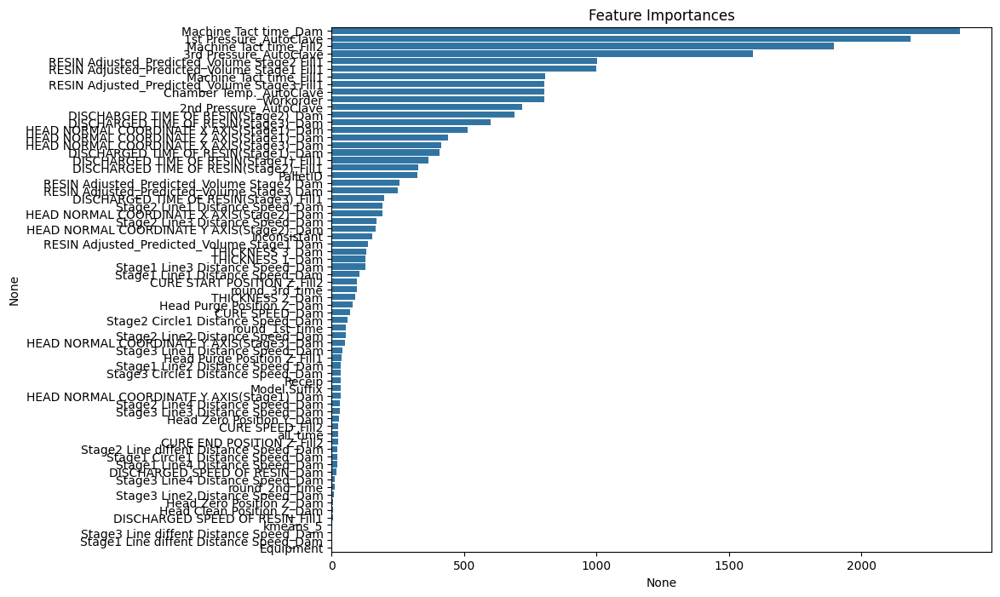

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[582]	valid_0's binary_logloss: 0.212523


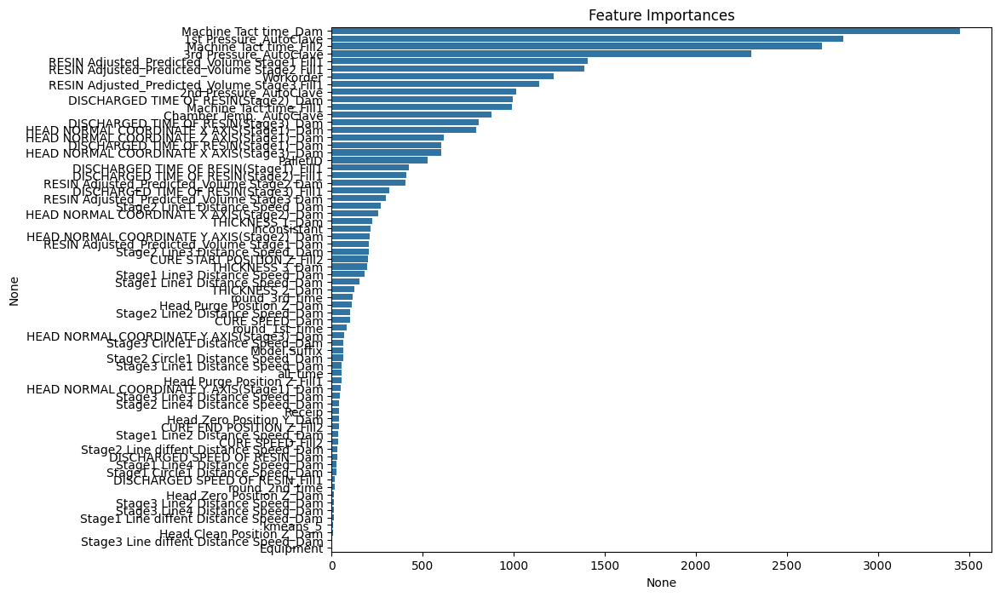

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[622]	valid_0's binary_logloss: 0.208043


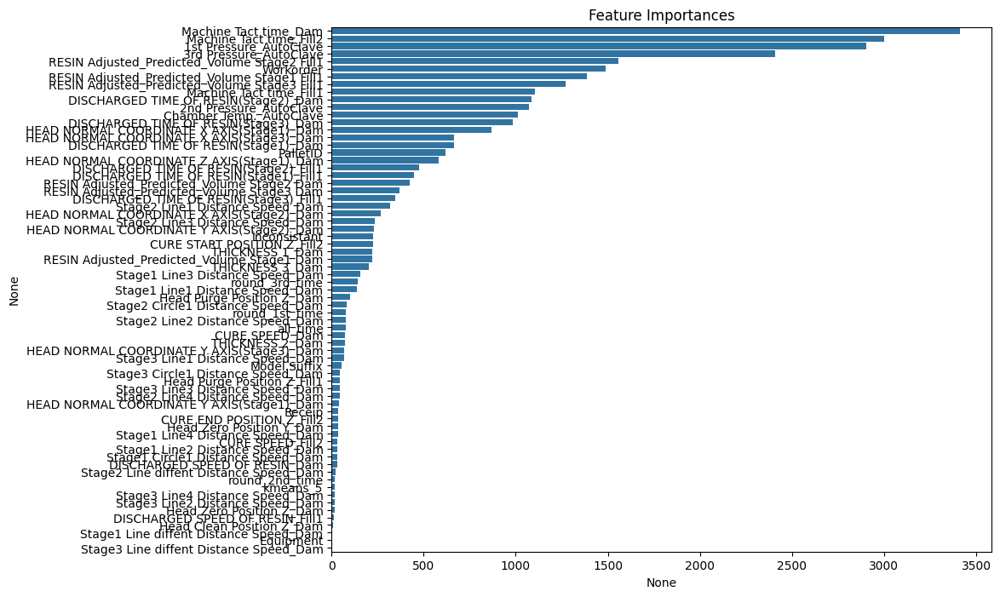

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[346]	valid_0's binary_logloss: 0.213601


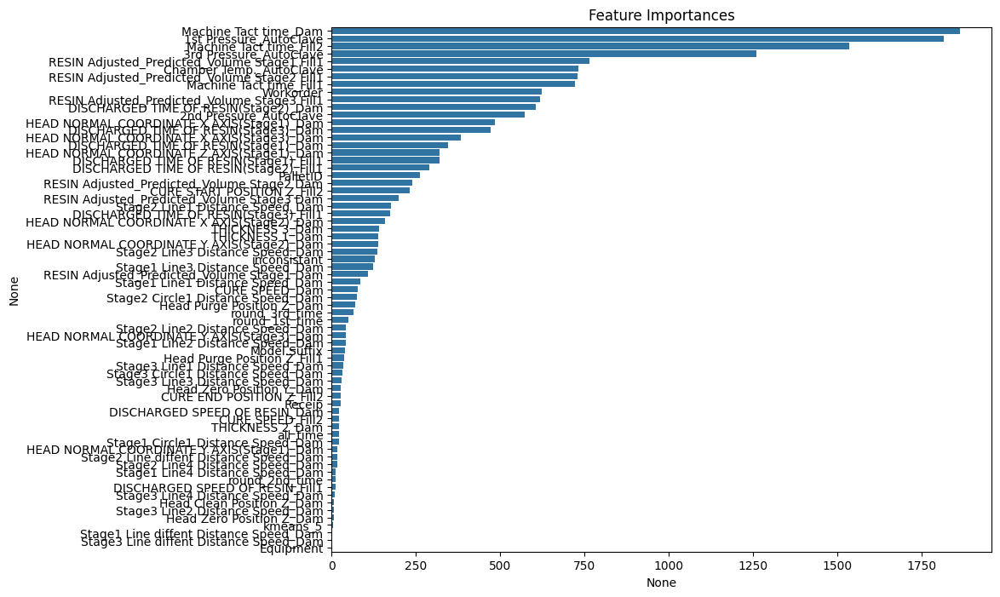

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[528]	valid_0's binary_logloss: 0.212011


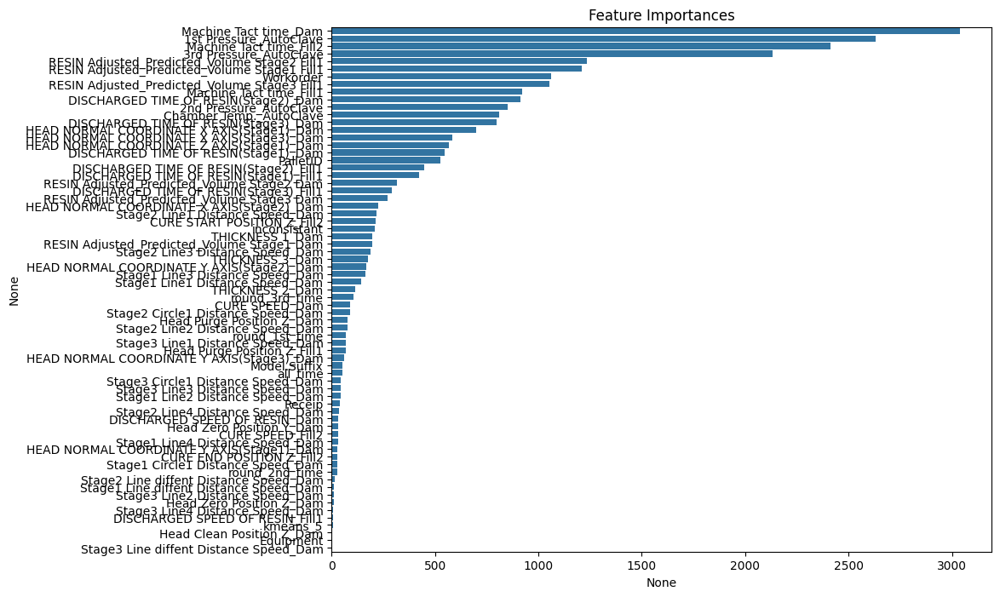

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[584]	valid_0's binary_logloss: 0.207026


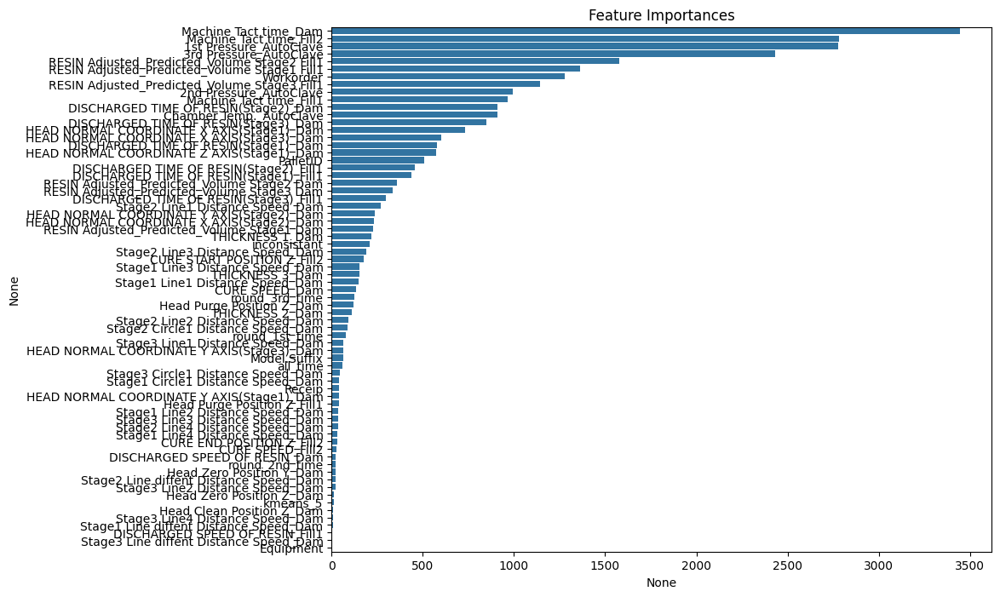

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[743]	valid_0's binary_logloss: 0.208654


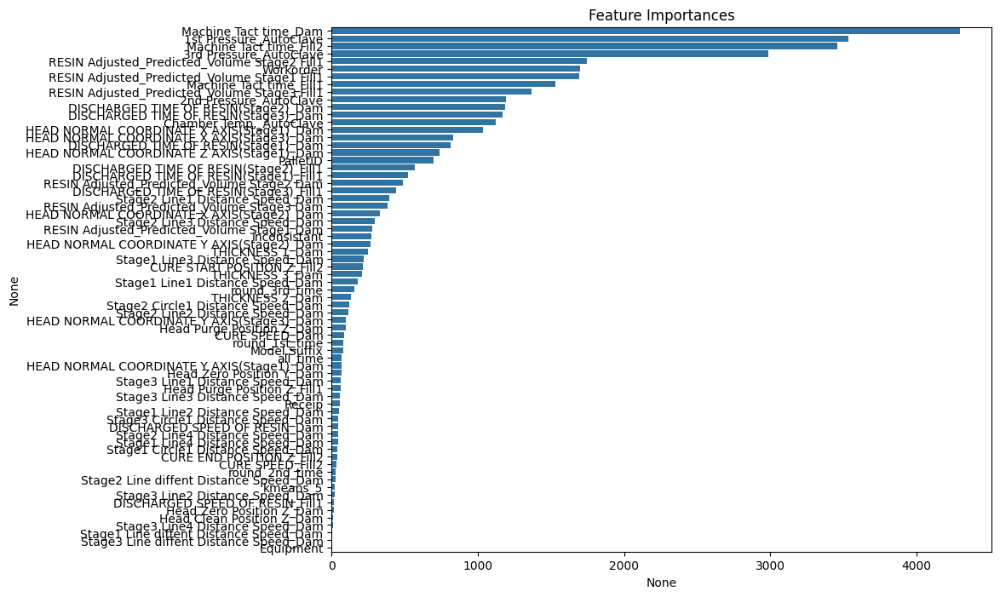

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[582]	valid_0's binary_logloss: 0.209011


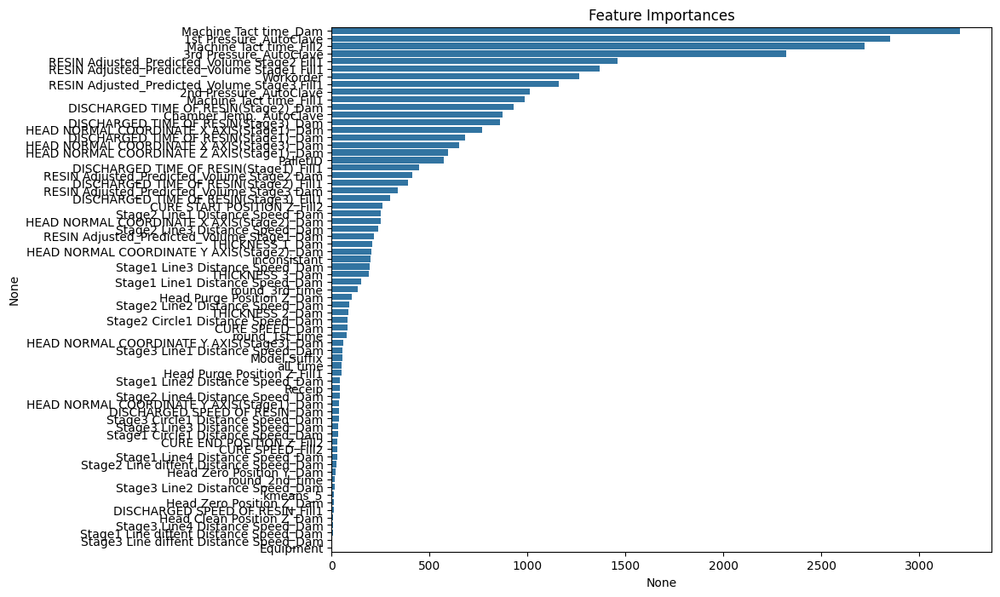

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[868]	valid_0's binary_logloss: 0.203816


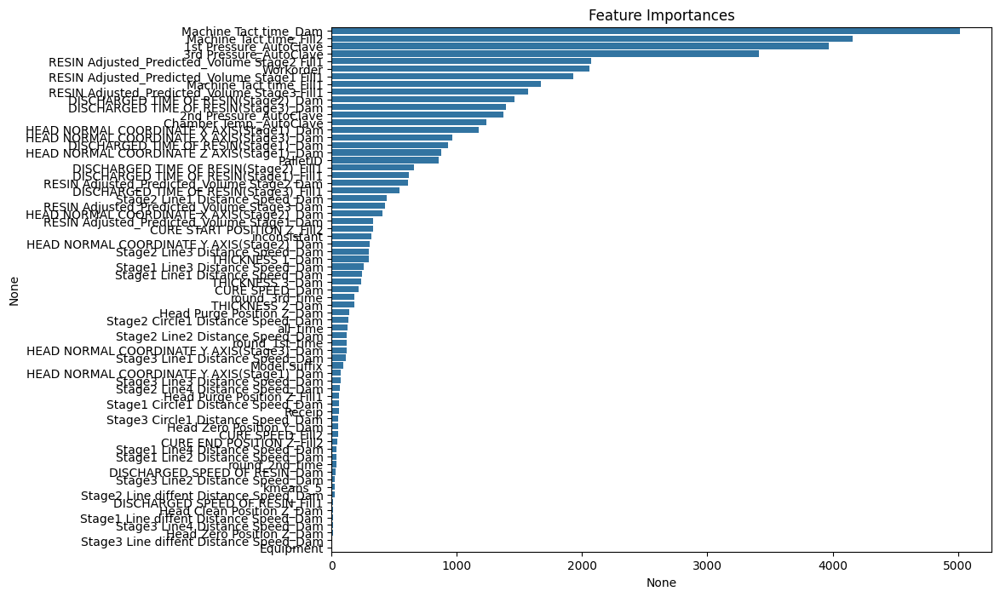

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[549]	valid_0's binary_logloss: 0.208967


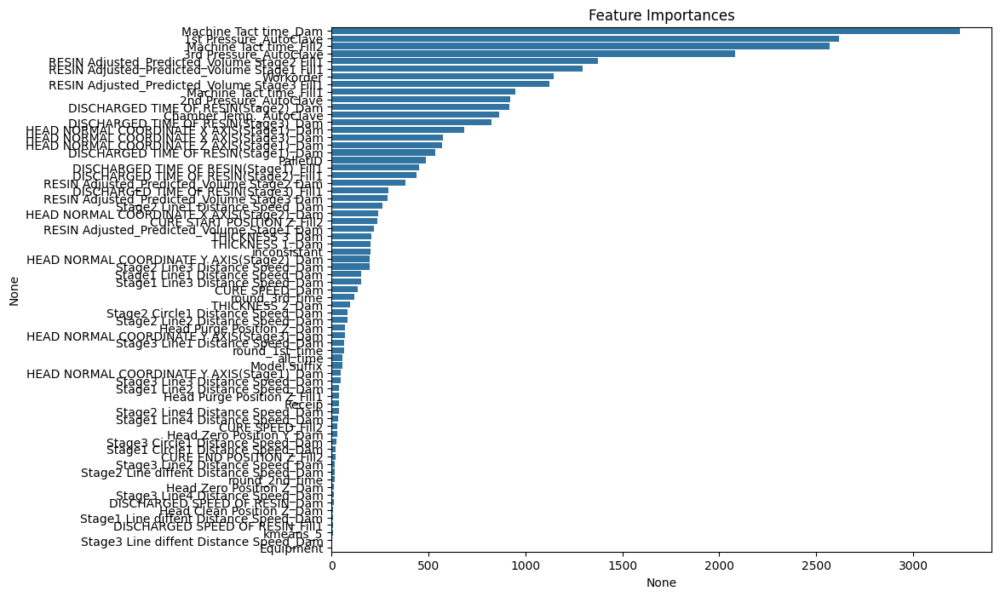

In [57]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_lgbm_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_lgbm_last, y_train_lgbm_last):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_train_lgbm_last.iloc[train_idx], y_train_lgbm_last[train_idx],
        eval_set = [(X_train_lgbm_last.iloc[valid_idx], y_train_lgbm_last[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm_train.append(lgbm_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(lgbm_best_model.feature_importances_, index=list(X_train_lgbm_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [58]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm_train):
    pred_list.append(model.predict_proba(X_valid_lgbm_last)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [59]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_lgbm_last, lgbm_proba)
f1_scores = 2*recall*precision / (recall + precision)
lgbm_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_lgbm = (lgbm_proba >= lgbm_best_threshold).astype(int)

In [60]:
get_clf_eval(y_valid_lgbm_last, y_pred_custom_threshold_lgbm)

오차행렬:
 [[  95  202]
 [ 499 4210]]

정확도: 0.8600
정밀도: 0.1599
재현율: 0.3199
F1: 0.2132


#### XGBoost

[0]	validation_0-logloss:0.26301
[100]	validation_0-logloss:0.25650
[200]	validation_0-logloss:0.25084
[300]	validation_0-logloss:0.24593
[400]	validation_0-logloss:0.24172
[500]	validation_0-logloss:0.23811
[600]	validation_0-logloss:0.23500
[613]	validation_0-logloss:0.23463


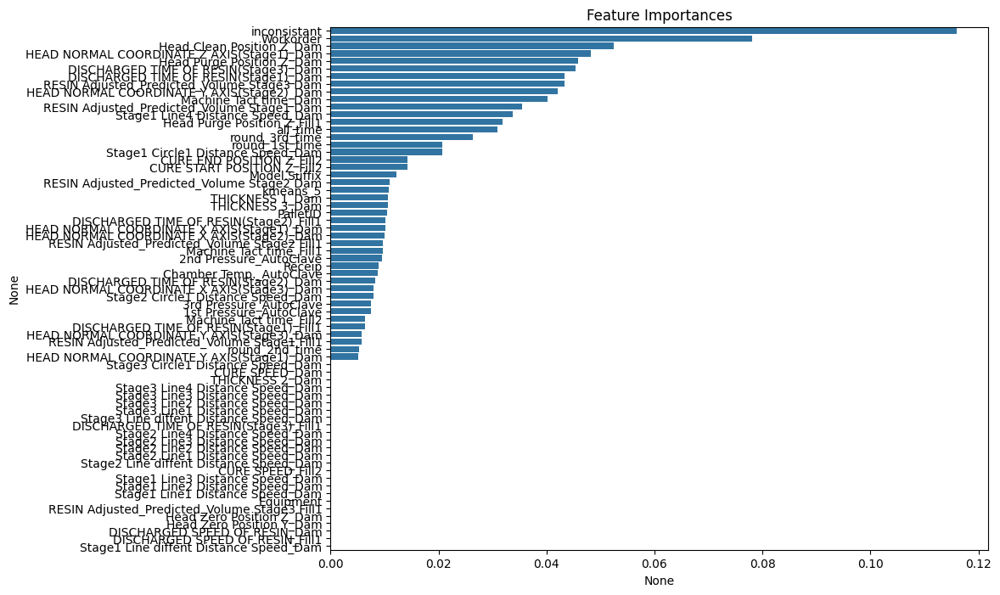

[0]	validation_0-logloss:0.26301
[100]	validation_0-logloss:0.25560
[200]	validation_0-logloss:0.24942
[300]	validation_0-logloss:0.24410
[400]	validation_0-logloss:0.23949
[500]	validation_0-logloss:0.23557
[600]	validation_0-logloss:0.23217
[613]	validation_0-logloss:0.23176


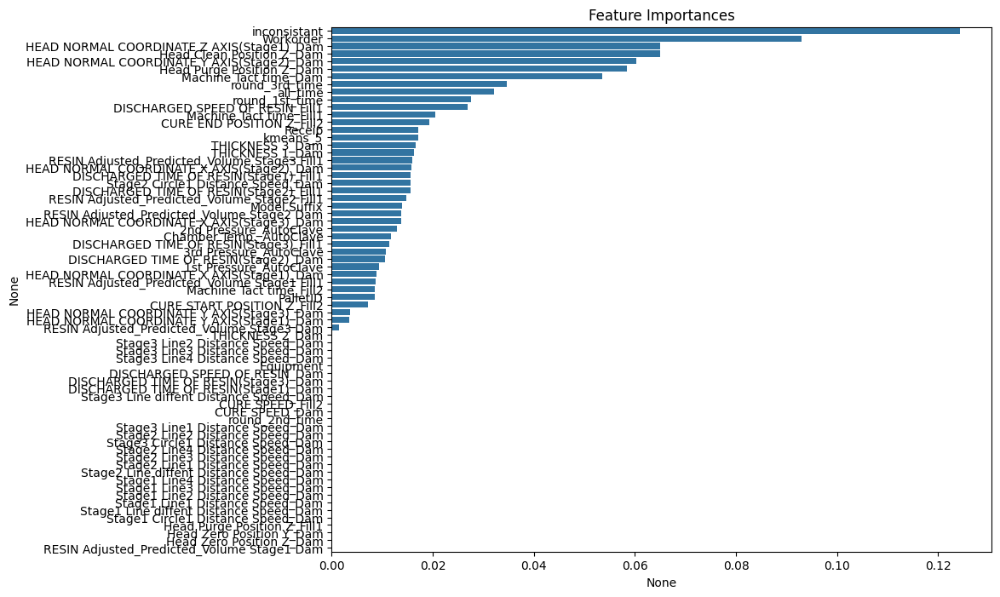

[0]	validation_0-logloss:0.26300
[100]	validation_0-logloss:0.25568
[200]	validation_0-logloss:0.24943
[300]	validation_0-logloss:0.24399
[400]	validation_0-logloss:0.23928
[500]	validation_0-logloss:0.23519
[600]	validation_0-logloss:0.23163
[613]	validation_0-logloss:0.23122


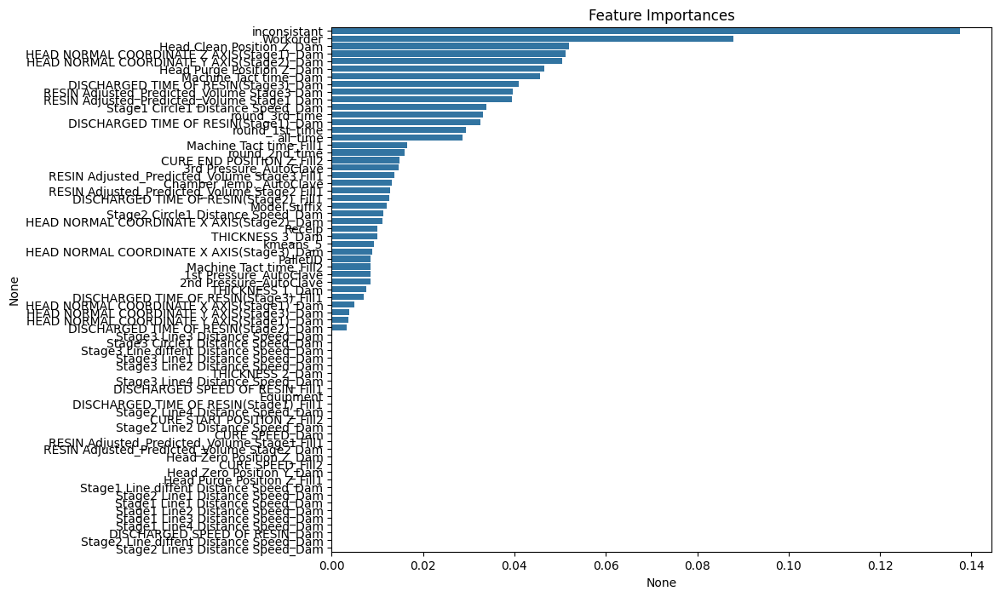

[0]	validation_0-logloss:0.26301
[100]	validation_0-logloss:0.25561
[200]	validation_0-logloss:0.24939
[300]	validation_0-logloss:0.24406
[400]	validation_0-logloss:0.23937
[500]	validation_0-logloss:0.23537
[600]	validation_0-logloss:0.23198
[613]	validation_0-logloss:0.23157


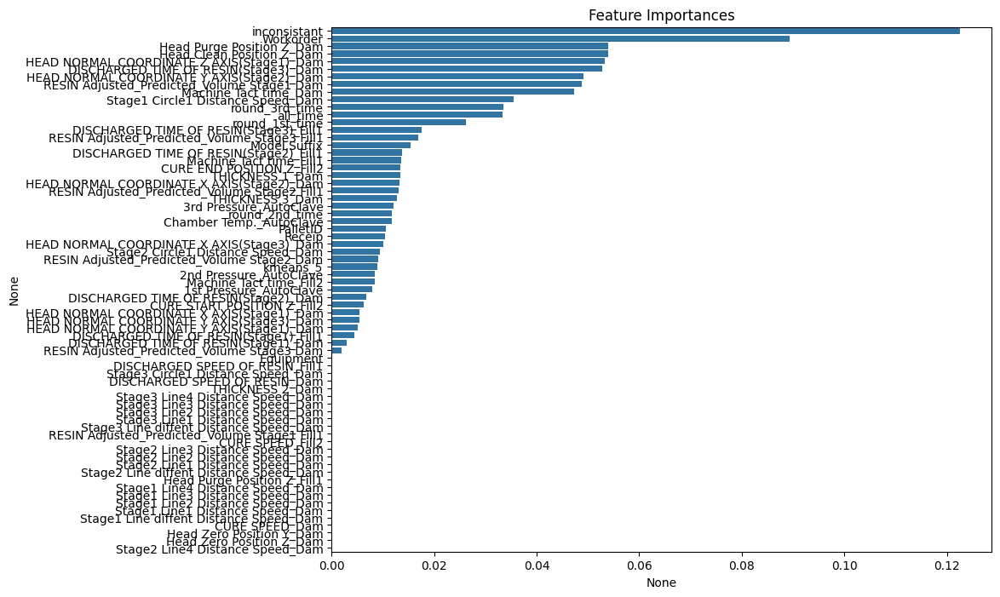

[0]	validation_0-logloss:0.26219
[100]	validation_0-logloss:0.25478
[200]	validation_0-logloss:0.24846
[300]	validation_0-logloss:0.24303
[400]	validation_0-logloss:0.23833
[500]	validation_0-logloss:0.23428
[600]	validation_0-logloss:0.23081
[613]	validation_0-logloss:0.23040


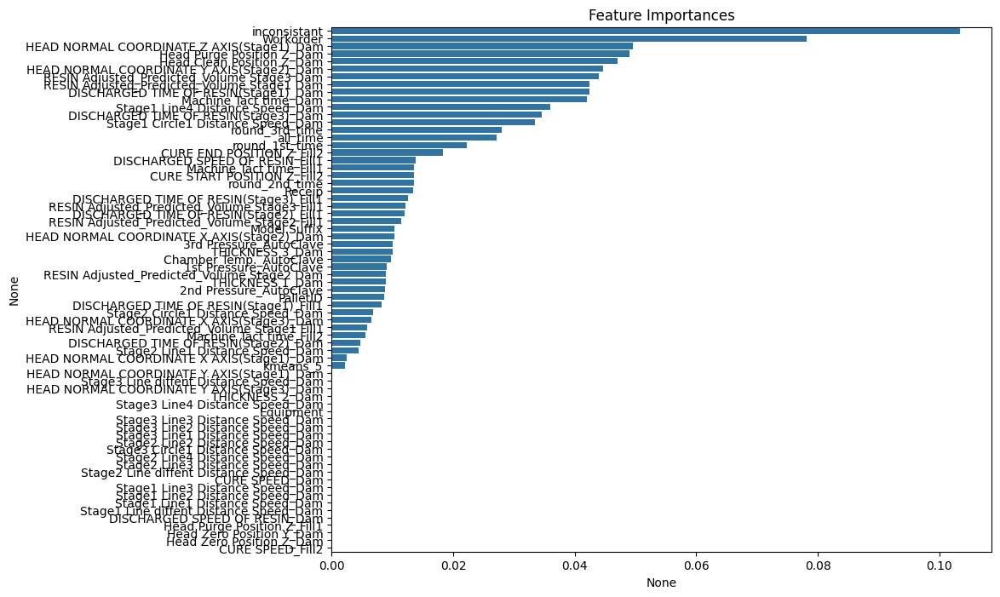

[0]	validation_0-logloss:0.26219
[100]	validation_0-logloss:0.25426
[200]	validation_0-logloss:0.24764
[300]	validation_0-logloss:0.24188
[400]	validation_0-logloss:0.23686
[500]	validation_0-logloss:0.23246
[600]	validation_0-logloss:0.22867
[613]	validation_0-logloss:0.22823


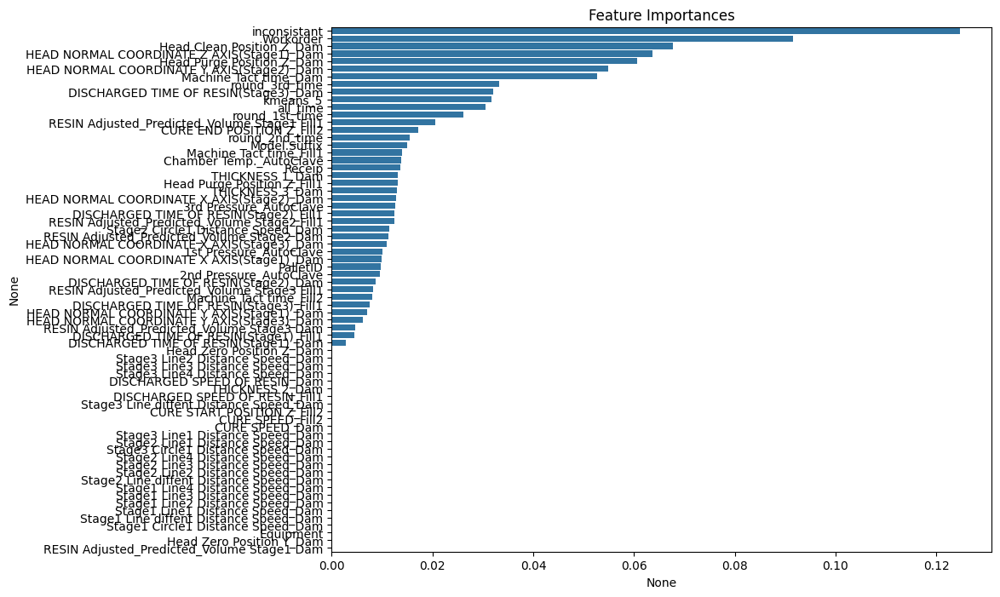

[0]	validation_0-logloss:0.26305
[100]	validation_0-logloss:0.25577
[200]	validation_0-logloss:0.24957
[300]	validation_0-logloss:0.24414
[400]	validation_0-logloss:0.23943
[500]	validation_0-logloss:0.23537
[600]	validation_0-logloss:0.23185
[613]	validation_0-logloss:0.23144


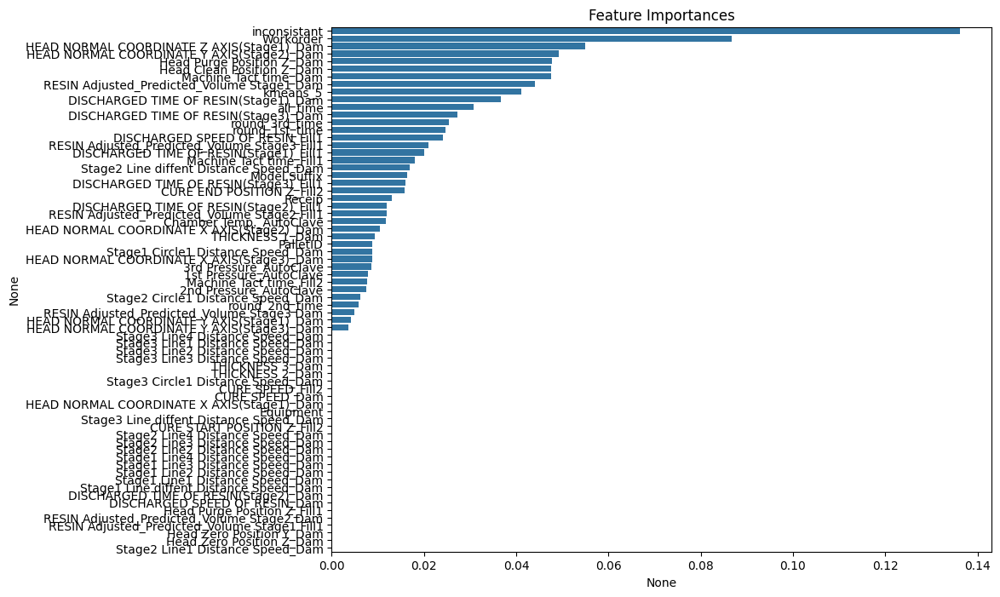

[0]	validation_0-logloss:0.26305
[100]	validation_0-logloss:0.25527
[200]	validation_0-logloss:0.24871
[300]	validation_0-logloss:0.24297
[400]	validation_0-logloss:0.23799
[500]	validation_0-logloss:0.23371
[600]	validation_0-logloss:0.23005
[613]	validation_0-logloss:0.22962


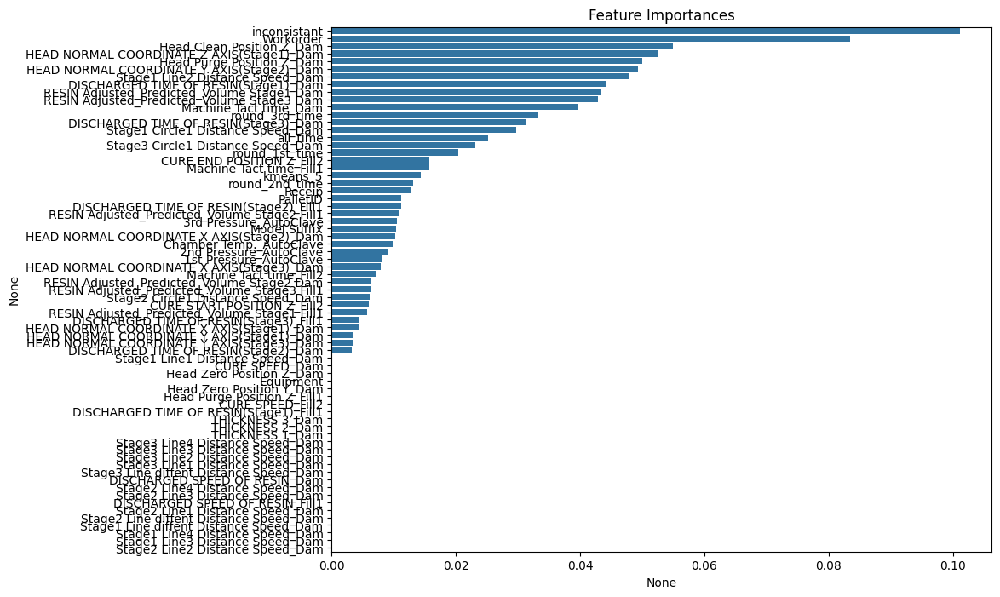

[0]	validation_0-logloss:0.26305
[100]	validation_0-logloss:0.25529
[200]	validation_0-logloss:0.24868
[300]	validation_0-logloss:0.24295
[400]	validation_0-logloss:0.23794
[500]	validation_0-logloss:0.23357
[600]	validation_0-logloss:0.22979
[613]	validation_0-logloss:0.22935


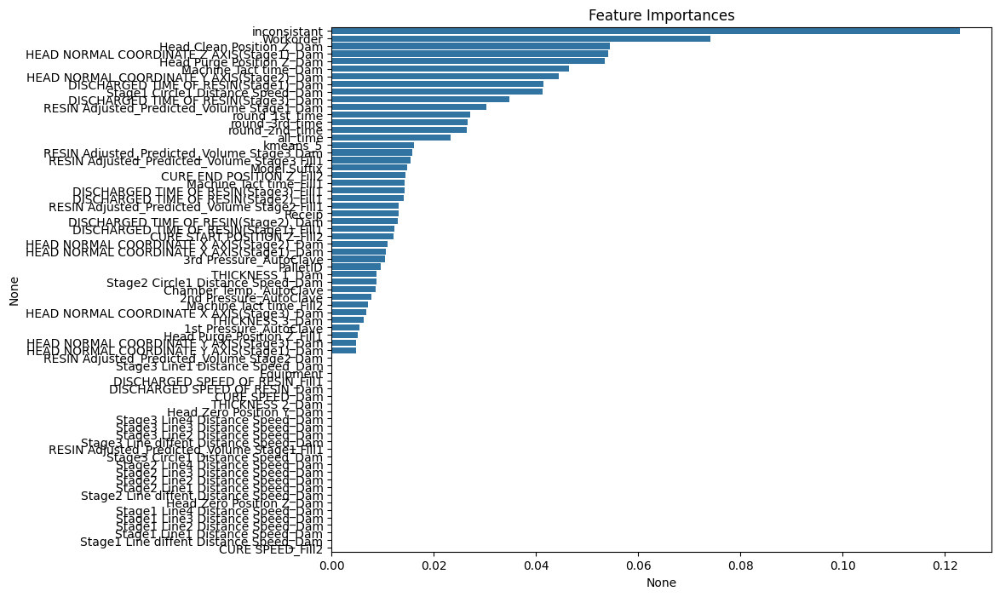

[0]	validation_0-logloss:0.26306
[100]	validation_0-logloss:0.25555
[200]	validation_0-logloss:0.24918
[300]	validation_0-logloss:0.24364
[400]	validation_0-logloss:0.23876
[500]	validation_0-logloss:0.23457
[600]	validation_0-logloss:0.23094
[613]	validation_0-logloss:0.23051


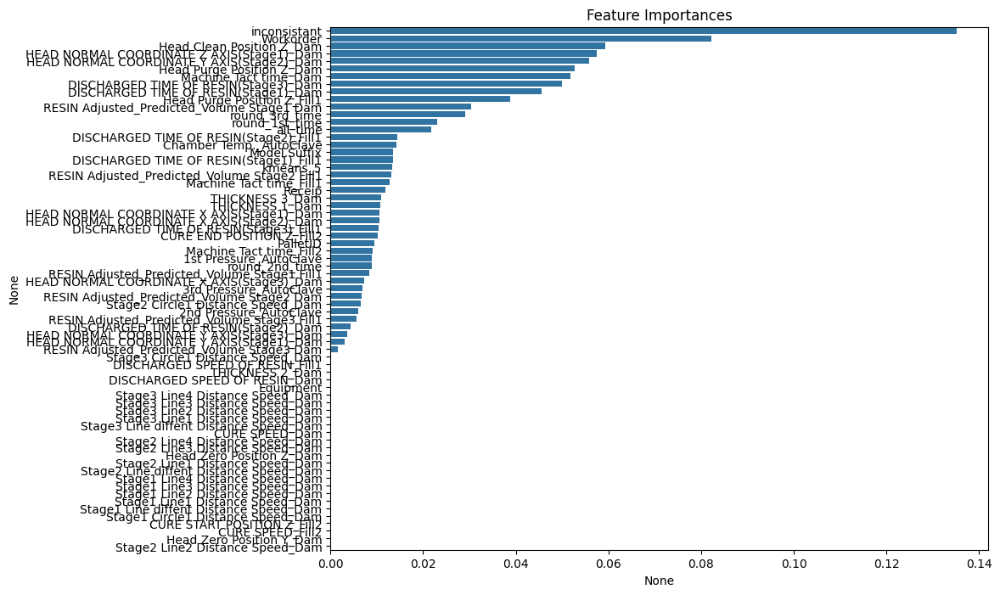

In [61]:
# Stratified cv fitting models_xgb_train

# 해당 모델 저장 리스트
models_xgb_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_xgb_last, y_train_xgb_last):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True,)

    # fit the model
    xgb_best_model.fit(
        X_train_xgb_last.iloc[train_idx], y_train_xgb_last[train_idx],
        eval_set = [(X_train_xgb_last.iloc[valid_idx], y_train_xgb_last[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb_train.append(xgb_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(xgb_best_model.feature_importances_, index=list(X_train_xgb_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [62]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb_train):
    pred_list.append(model.predict_proba(X_valid_xgb_last)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [63]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, xgb_proba)
f1_scores = 2*recall*precision / (recall + precision)
xgb_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_xgb = (xgb_proba >= xgb_best_threshold).astype(int)

In [64]:
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold_xgb)

오차행렬:
 [[  94  203]
 [ 507 4202]]

정확도: 0.8582
정밀도: 0.1564
재현율: 0.3165
F1: 0.2094


#### Ensemble tuning

In [65]:
def weight_test(last_num, test_set, prob):

    from itertools import product
    col_n = len(prob.columns)
    row_n = len(prob)
    
    
    # best ensemble
    best_f1 = 0
    best_f1_t = 0
    best_weights = None
    best_weights_t = None
    A = [i for i in range(last_num + 1)]
    
    for w in tqdm(product(A, repeat = col_n)):
        
        # 가중치 열 만들기
        weight_frame = pd.DataFrame([w]*row_n, columns = prob.columns)
        
        # 가중치 곱해주기
        prob_weight = prob * weight_frame
        
        # 가중치의 합
        w_sum = sum(w)
        
        # 평균 계산해주기
        final_proba = np.sum(prob_weight/w_sum, axis = 1)
        
        # 가중 평균 계산
        y_pred = (final_proba > 0.5).astype(int)

        # F1 스코어 계산
        f1 = f1_score(test_set, y_pred)

        # Threshold 스코어 계산
        precision, recall, thresholds = precision_recall_curve(test_set, final_proba)
        f1_scores = 2*recall*precision / (recall + precision)
        best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold = (final_proba >= best_threshold).astype(int)
        f1_t = f1_score(test_set, y_pred_custom_threshold)

        # 최고 성능 저장
        if f1 > best_f1:
            best_f1 = f1
            best_weights = w

        if f1_t > best_f1_t:
            best_f1_t = f1_t
            best_weights_t = w
            
#         print(f'weight: {w}, best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

    print('종료되었습니다.')
    return best_f1, best_f1_t, best_weights, best_weights_t

In [66]:
# 함수 적용
best_f1, best_f1_t, best_weights, best_weights_t = weight_test(last_num = 20, test_set = y_valid_xgb_last, prob = pd.DataFrame({'cat_proba': cat_proba, 'lgbm_proba': lgbm_proba, 'xgb_proba': xgb_proba}))
print(f'best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

9261it [01:17, 118.89it/s]

종료되었습니다.
best_f1: 0.10725552050473187, best_f1_t: 0.22576361221779545, best_weights: (1, 0, 0), best_weights_t: (16, 3, 13)


In [67]:
# best ensemble 적용
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
y_best = (cat + lgbm + xgb)/(sum(best_weights_t))

In [68]:
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, y_best)
f1_scores = 2*recall*precision / (recall + precision)
weights_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold = (y_best >= weights_best_threshold).astype(int)
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold)

오차행렬:
 [[  85  212]
 [ 371 4338]]

정확도: 0.8835
정밀도: 0.1864
재현율: 0.2862
F1: 0.2258


## 6. Inference

### Catboost

In [69]:
# 해당 모델 저장 리스트
models_cat = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_cat, y_cat):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)

    # fit the model
    cat_best_model.fit(
        X_cat.iloc[train_idx], y_cat[train_idx],
        eval_set = [(X_cat.iloc[valid_idx], y_cat[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat.append(cat_best_model)

0:	learn: 0.4480957	test: 0.4477058	best: 0.4477058 (0)	total: 35.5ms	remaining: 9.34s
100:	learn: 0.1913720	test: 0.2051747	best: 0.2038796 (54)	total: 7.15s	remaining: 11.5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2038795731
bestIteration = 54

Shrink model to first 55 iterations.
0:	learn: 0.4480127	test: 0.4484696	best: 0.4484696 (0)	total: 31.8ms	remaining: 8.35s
100:	learn: 0.1939707	test: 0.2122883	best: 0.2109862 (67)	total: 6.43s	remaining: 10.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2109862177
bestIteration = 67

Shrink model to first 68 iterations.
0:	learn: 0.4483973	test: 0.4474914	best: 0.4474914 (0)	total: 32.5ms	remaining: 8.55s
100:	learn: 0.1917931	test: 0.2039388	best: 0.2037868 (58)	total: 7.7s	remaining: 12.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2037867627
bestIteration = 58

Shrink model to first 59 iterations.
0:	learn: 0.4482568	test: 0.4478526	best: 0.4478526 (0)	total: 34

In [70]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat):
    pred_list.append(model.predict_proba(X_test_cat)[:, 1])

# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [71]:
np.unique(np.where(cat_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([10701,    33]))

### LGBM

In [72]:
# 해당 모델 저장 리스트
models_lgbm = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_lgbm, y_lgbm):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_lgbm.iloc[train_idx], y_lgbm[train_idx],
        eval_set = [(X_lgbm.iloc[valid_idx], y_lgbm[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm.append(lgbm_best_model)

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[570]	valid_0's binary_logloss: 0.208839
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[474]	valid_0's binary_logloss: 0.212301
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[877]	valid_0's binary_logloss: 0.20278
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[680]	valid_0's binary_logloss: 0.206758
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[788]	valid_0's binary_logloss: 0.20811
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[641]	valid_0's binary_logloss: 0.209081
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[582]	valid_0's binary_logloss: 0.204134
Training until validation scores don't impr

In [73]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm):
    pred_list.append(model.predict_proba(X_test_lgbm)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [74]:
np.unique(np.where(lgbm_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([10715,    19]))

### XGB

In [75]:
# 해당 모델 저장 리스트
models_xgb = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_xgb, y_xgb):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True)

    # fit the model
    xgb_best_model.fit(
        X_xgb.iloc[train_idx], y_xgb[train_idx],
        eval_set = [(X_xgb.iloc[valid_idx], y_xgb[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb.append(xgb_best_model)

[0]	validation_0-logloss:0.26252
[100]	validation_0-logloss:0.25466
[200]	validation_0-logloss:0.24807
[300]	validation_0-logloss:0.24239
[400]	validation_0-logloss:0.23742
[500]	validation_0-logloss:0.23313
[600]	validation_0-logloss:0.22941
[613]	validation_0-logloss:0.22898
[0]	validation_0-logloss:0.26252
[100]	validation_0-logloss:0.25542
[200]	validation_0-logloss:0.24936
[300]	validation_0-logloss:0.24407
[400]	validation_0-logloss:0.23951
[500]	validation_0-logloss:0.23554
[600]	validation_0-logloss:0.23216
[613]	validation_0-logloss:0.23177
[0]	validation_0-logloss:0.26251
[100]	validation_0-logloss:0.25468
[200]	validation_0-logloss:0.24812
[300]	validation_0-logloss:0.24245
[400]	validation_0-logloss:0.23757
[500]	validation_0-logloss:0.23335
[600]	validation_0-logloss:0.22971
[613]	validation_0-logloss:0.22928
[0]	validation_0-logloss:0.26252
[100]	validation_0-logloss:0.25474
[200]	validation_0-logloss:0.24817
[300]	validation_0-logloss:0.24242
[400]	validation_0-logloss:0

In [76]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb):
    pred_list.append(model.predict_proba(X_test_xgb)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [77]:
np.unique(np.where(xgb_proba >= 0.5, 1, 0), return_counts = True)

(array([0]), array([10734]))

In [78]:
# 추론
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
p1 = (cat + lgbm + xgb)/(sum(best_weights_t))

## 5. 데이터 학습하기


### setting

In [79]:
# 변환 리스트
columns_to_convert = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
]  

# 변환할 컬럼명 리스트
columns_to = [
    'Head Zero Position Y_Dam',
    'Head Zero Position Z_Dam',
    'Head Clean Position Z_Dam',
    'Head Purge Position Z_Dam',
    'Head Purge Position Z_Fill1',
    'CURE START POSITION Z_Fill2',
    'CURE END POSITION Z_Fill2',
    'CURE SPEED_Fill2',
    'Stage1 Circle1 Distance Speed_Dam',
    'Stage2 Circle1 Distance Speed_Dam',
    'Stage3 Circle1 Distance Speed_Dam',
    'Stage1 Line diffent Distance Speed_Dam',
    'Stage2 Line diffent Distance Speed_Dam',
    'Stage3 Line diffent Distance Speed_Dam',
    'kmeans_5',
    'round_1st_time',
    'round_2nd_time',
    'round_3rd_time',
    'all_time'
]

In [80]:
cat_features_indices = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
] + columns_to

In [81]:
# data
cat_train, cat_test = variable_setting('catboost', df_train_equip2, df_test_equip2, columns_to_convert, columns_to)
lgbm_train, lgbm_test = variable_setting('lightgbm', df_train_equip2, df_test_equip2, columns_to_convert, columns_to)
xgb_train, xgb_test = variable_setting('xgboost', df_train_equip2, df_test_equip2, columns_to_convert, columns_to)

### Best_Params 얻기

In [82]:
# optuna tuning
cat_best_params, X_cat, y_cat, cat_train_index, cat_valid_index = catboost_optuna(cat_train, cat_features_indices)

[I 2024-08-22 11:26:34,733] A new study created in memory with name: no-name-27fd25fe-a82c-4065-8e44-e0af73c2e0c4
[I 2024-08-22 11:26:43,218] Trial 0 finished with value: 0.2830769230769231 and parameters: {'iterations': 437, 'depth': 10, 'learning_rate': 0.15702970884055384, 'l2_leaf_reg': 5.990598257128395, 'border_count': 66, 'random_strength': 1.559945204206032, 'bagging_temperature': 0.05808361216819946, 'od_type': 'IncToDec', 'od_wait': 39, 'boosting_type': 'Plain'}. Best is trial 0 with value: 0.2830769230769231.
[I 2024-08-22 11:26:54,645] Trial 1 finished with value: 0.28571428571428575 and parameters: {'iterations': 850, 'depth': 5, 'learning_rate': 0.0035113563139704067, 'l2_leaf_reg': 1.8422110534358038, 'border_count': 100, 'random_strength': 5.247564316797622, 'bagging_temperature': 0.43194501864211576, 'od_type': 'Iter', 'od_wait': 15, 'boosting_type': 'Plain'}. Best is trial 1 with value: 0.28571428571428575.
[I 2024-08-22 11:27:20,558] Trial 2 finished with value: 0.25

Best trial:
  Value: 0.3208955223880597
  Params: 
    iterations: 1000
    depth: 4
    learning_rate: 0.033397291256783805
    l2_leaf_reg: 3.4869976484485563
    border_count: 40
    random_strength: 7.495504987259448
    bagging_temperature: 0.23539057714476183
    od_type: IncToDec
    od_wait: 41
    boosting_type: Plain


In [83]:
# optuna tuning
lgbm_best_params, X_lgbm, y_lgbm, lgbm_train_index, lgbm_valid_index = lightgbm_optuna(lgbm_train, cat_features_indices)

[I 2024-08-22 11:34:13,718] A new study created in memory with name: no-name-318abac2-b966-48f0-beff-a9c21dc21122


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:14,512] Trial 0 finished with value: 0.2472727272727273 and parameters: {'n_estimators': 812, 'max_depth': 60, 'learning_rate': 0.0029106359131330704, 'reg_alpha': 0.24810409748678125, 'reg_lambda': 0.004207988669606638, 'min_child_weight': 1.0459808211767092, 'min_child_samples': 10, 'subsample': 0.9197056874649611, 'subsample_freq': 3, 'colsample_bytree': 0.7664580622368364, 'num_leaves': 3}. Best is trial 0 with value: 0.2472727272727273.


Did not meet early stopping. Best iteration is:
[812]	valid_0's binary_logloss: 0.19868
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:16,366] Trial 1 finished with value: 0.21263482280431437 and parameters: {'n_estimators': 1467, 'max_depth': 53, 'learning_rate': 0.00026587543983272726, 'reg_alpha': 0.005337032762603957, 'reg_lambda': 0.00541524411940254, 'min_child_weight': 1.564847850358382, 'min_child_samples': 55, 'subsample': 0.6591670111852694, 'subsample_freq': 1, 'colsample_bytree': 0.6894823157779035, 'num_leaves': 10}. Best is trial 0 with value: 0.2472727272727273.


Did not meet early stopping. Best iteration is:
[1467]	valid_0's binary_logloss: 0.208627
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:16,967] Trial 2 finished with value: 0.18425460636515914 and parameters: {'n_estimators': 721, 'max_depth': 25, 'learning_rate': 0.000816845589476017, 'reg_alpha': 1.382623217936987, 'reg_lambda': 0.006290644294586149, 'min_child_weight': 2.2998205344476403, 'min_child_samples': 61, 'subsample': 0.42787024763199866, 'subsample_freq': 3, 'colsample_bytree': 0.33641929894983325, 'num_leaves': 6}. Best is trial 0 with value: 0.2472727272727273.


Did not meet early stopping. Best iteration is:
[721]	valid_0's binary_logloss: 0.210783
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1416]	valid_0's binary_logloss: 0.197114


[I 2024-08-22 11:34:19,900] Trial 3 finished with value: 0.25389755011135856 and parameters: {'n_estimators': 1444, 'max_depth': 61, 'learning_rate': 0.004138040112561018, 'reg_alpha': 0.01653693718282442, 'reg_lambda': 0.002458603276328005, 'min_child_weight': 2.894815592792549, 'min_child_samples': 47, 'subsample': 0.47322294090686734, 'subsample_freq': 2, 'colsample_bytree': 0.22751081689217473, 'num_leaves': 59}. Best is trial 3 with value: 0.25389755011135856.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:21,729] Trial 4 finished with value: 0.21926910299003322 and parameters: {'n_estimators': 684, 'max_depth': 43, 'learning_rate': 0.0004201672054372534, 'reg_alpha': 0.12030178871154672, 'reg_lambda': 0.1537592023548176, 'min_child_weight': 1.1469905943393446, 'min_child_samples': 98, 'subsample': 0.8650796940166687, 'subsample_freq': 5, 'colsample_bytree': 0.915861880342119, 'num_leaves': 39}. Best is trial 3 with value: 0.25389755011135856.


Did not meet early stopping. Best iteration is:
[684]	valid_0's binary_logloss: 0.207964
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1414]	valid_0's binary_logloss: 0.207402


[I 2024-08-22 11:34:24,579] Trial 5 finished with value: 0.24817518248175185 and parameters: {'n_estimators': 1414, 'max_depth': 8, 'learning_rate': 0.0002465844721448739, 'reg_alpha': 0.0015167330688076208, 'reg_lambda': 0.02001342062287998, 'min_child_weight': 1.860370513913187, 'min_child_samples': 31, 'subsample': 0.8972425054911576, 'subsample_freq': 2, 'colsample_bytree': 0.4247476077499046, 'num_leaves': 36}. Best is trial 3 with value: 0.25389755011135856.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:25,736] Trial 6 finished with value: 0.2315369261477046 and parameters: {'n_estimators': 555, 'max_depth': 51, 'learning_rate': 0.00014096175149815865, 'reg_alpha': 8.862326508576253, 'reg_lambda': 1.2273800987852967, 'min_child_weight': 1.1955048853696035, 'min_child_samples': 5, 'subsample': 0.8892768570729005, 'subsample_freq': 4, 'colsample_bytree': 0.7832057344327898, 'num_leaves': 50}. Best is trial 3 with value: 0.25389755011135856.


Did not meet early stopping. Best iteration is:
[555]	valid_0's binary_logloss: 0.213267
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:26,692] Trial 7 finished with value: 0.20055710306406688 and parameters: {'n_estimators': 481, 'max_depth': 24, 'learning_rate': 0.0001705053926026929, 'reg_alpha': 2.8340904295147746, 'reg_lambda': 0.3113095956122124, 'min_child_weight': 1.6581430869842722, 'min_child_samples': 11, 'subsample': 0.5865893930293973, 'subsample_freq': 1, 'colsample_bytree': 0.7836849426704513, 'num_leaves': 42}. Best is trial 3 with value: 0.25389755011135856.


Did not meet early stopping. Best iteration is:
[481]	valid_0's binary_logloss: 0.213482
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:27,793] Trial 8 finished with value: 0.2017291066282421 and parameters: {'n_estimators': 1376, 'max_depth': 31, 'learning_rate': 0.00017345566642360953, 'reg_alpha': 0.7128188058401367, 'reg_lambda': 1.1044350847124695, 'min_child_weight': 2.4644701914932368, 'min_child_samples': 79, 'subsample': 0.6962773578186345, 'subsample_freq': 3, 'colsample_bytree': 0.5420328146868397, 'num_leaves': 3}. Best is trial 3 with value: 0.25389755011135856.


Did not meet early stopping. Best iteration is:
[1376]	valid_0's binary_logloss: 0.212545
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:28,291] Trial 9 finished with value: 0.21722846441947566 and parameters: {'n_estimators': 518, 'max_depth': 4, 'learning_rate': 0.0018742210985555703, 'reg_alpha': 0.018089390092767135, 'reg_lambda': 0.1082138291061399, 'min_child_weight': 3.6764826587413255, 'min_child_samples': 28, 'subsample': 0.6462297538213778, 'subsample_freq': 4, 'colsample_bytree': 0.383038532393298, 'num_leaves': 6}. Best is trial 3 with value: 0.25389755011135856.


Did not meet early stopping. Best iteration is:
[518]	valid_0's binary_logloss: 0.206762
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:29,349] Trial 10 finished with value: 0.26273458445040215 and parameters: {'n_estimators': 1123, 'max_depth': 44, 'learning_rate': 0.008691089486124973, 'reg_alpha': 0.024400771927662202, 'reg_lambda': 0.0011447070776131048, 'min_child_weight': 3.2574490847879742, 'min_child_samples': 39, 'subsample': 0.40669661435551696, 'subsample_freq': 0, 'colsample_bytree': 0.20984893565195006, 'num_leaves': 64}. Best is trial 10 with value: 0.26273458445040215.


Early stopping, best iteration is:
[462]	valid_0's binary_logloss: 0.195706
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:30,190] Trial 11 finished with value: 0.26136363636363635 and parameters: {'n_estimators': 1142, 'max_depth': 42, 'learning_rate': 0.009588418536116118, 'reg_alpha': 0.02344574163871334, 'reg_lambda': 0.0011066835670797846, 'min_child_weight': 3.228664519418552, 'min_child_samples': 38, 'subsample': 0.4047844499396721, 'subsample_freq': 0, 'colsample_bytree': 0.2484675793960146, 'num_leaves': 64}. Best is trial 10 with value: 0.26273458445040215.


Early stopping, best iteration is:
[330]	valid_0's binary_logloss: 0.196171
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:31,185] Trial 12 finished with value: 0.28061224489795916 and parameters: {'n_estimators': 1103, 'max_depth': 40, 'learning_rate': 0.009613909972104616, 'reg_alpha': 0.04481839128894382, 'reg_lambda': 0.001029636908767823, 'min_child_weight': 3.6985293534389845, 'min_child_samples': 37, 'subsample': 0.5126396185753415, 'subsample_freq': 0, 'colsample_bytree': 0.20362083825494987, 'num_leaves': 62}. Best is trial 12 with value: 0.28061224489795916.


Early stopping, best iteration is:
[463]	valid_0's binary_logloss: 0.195893
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:31,925] Trial 13 finished with value: 0.24615384615384617 and parameters: {'n_estimators': 1073, 'max_depth': 40, 'learning_rate': 0.00995113558192139, 'reg_alpha': 0.047175968357603716, 'reg_lambda': 7.266943511144061, 'min_child_weight': 3.9774535585917965, 'min_child_samples': 67, 'subsample': 0.5216620861619956, 'subsample_freq': 0, 'colsample_bytree': 0.53216529309064, 'num_leaves': 20}. Best is trial 12 with value: 0.28061224489795916.


Early stopping, best iteration is:
[367]	valid_0's binary_logloss: 0.198346
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1050]	valid_0's binary_logloss: 0.191888


[I 2024-08-22 11:34:34,481] Trial 14 finished with value: 0.2808988764044944 and parameters: {'n_estimators': 1197, 'max_depth': 34, 'learning_rate': 0.004973541716877472, 'reg_alpha': 0.0038832510946508548, 'reg_lambda': 0.03132642408656095, 'min_child_weight': 3.2352108032228846, 'min_child_samples': 22, 'subsample': 0.5374833310878779, 'subsample_freq': 0, 'colsample_bytree': 0.23134330612231227, 'num_leaves': 52}. Best is trial 14 with value: 0.2808988764044944.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[847]	valid_0's binary_logloss: 0.192788


[I 2024-08-22 11:34:36,786] Trial 15 finished with value: 0.273972602739726 and parameters: {'n_estimators': 1242, 'max_depth': 16, 'learning_rate': 0.004700517020048799, 'reg_alpha': 0.00104669623507392, 'reg_lambda': 0.029052788929390908, 'min_child_weight': 2.800008565146464, 'min_child_samples': 22, 'subsample': 0.7720893446707345, 'subsample_freq': 1, 'colsample_bytree': 0.4311342927642616, 'num_leaves': 51}. Best is trial 14 with value: 0.2808988764044944.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:38,694] Trial 16 finished with value: 0.24469820554649263 and parameters: {'n_estimators': 953, 'max_depth': 33, 'learning_rate': 0.0012027906411716696, 'reg_alpha': 0.004531292986525177, 'reg_lambda': 0.021443548352303755, 'min_child_weight': 3.597340537843098, 'min_child_samples': 22, 'subsample': 0.5510032017653995, 'subsample_freq': 1, 'colsample_bytree': 0.31413906992669555, 'num_leaves': 27}. Best is trial 14 with value: 0.2808988764044944.


Did not meet early stopping. Best iteration is:
[953]	valid_0's binary_logloss: 0.20415
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:39,918] Trial 17 finished with value: 0.2682926829268293 and parameters: {'n_estimators': 952, 'max_depth': 25, 'learning_rate': 0.005884144791687234, 'reg_alpha': 0.0045455553502116094, 'reg_lambda': 0.04133206909441451, 'min_child_weight': 0.542895712277309, 'min_child_samples': 43, 'subsample': 0.9947663176861599, 'subsample_freq': 0, 'colsample_bytree': 0.4788172800243625, 'num_leaves': 53}. Best is trial 14 with value: 0.2808988764044944.


Early stopping, best iteration is:
[487]	valid_0's binary_logloss: 0.195123
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1245]	valid_0's binary_logloss: 0.198957


[I 2024-08-22 11:34:42,821] Trial 18 finished with value: 0.2514734774066797 and parameters: {'n_estimators': 1245, 'max_depth': 37, 'learning_rate': 0.002125802786955225, 'reg_alpha': 0.15498035953380346, 'reg_lambda': 0.012953743702305983, 'min_child_weight': 3.259028186065253, 'min_child_samples': 23, 'subsample': 0.5912455575976941, 'subsample_freq': 2, 'colsample_bytree': 0.29716020446315383, 'num_leaves': 47}. Best is trial 14 with value: 0.2808988764044944.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1253]	valid_0's binary_logloss: 0.200752


[I 2024-08-22 11:34:46,506] Trial 19 finished with value: 0.2303839732888147 and parameters: {'n_estimators': 1253, 'max_depth': 50, 'learning_rate': 0.0007423779884313272, 'reg_alpha': 0.007463412627576915, 'reg_lambda': 0.6326322581799338, 'min_child_weight': 3.923830362144299, 'min_child_samples': 75, 'subsample': 0.7750644357229618, 'subsample_freq': 0, 'colsample_bytree': 0.9550926416247638, 'num_leaves': 56}. Best is trial 14 with value: 0.2808988764044944.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:48,321] Trial 20 finished with value: 0.22302158273381298 and parameters: {'n_estimators': 1049, 'max_depth': 20, 'learning_rate': 0.0033336623101209, 'reg_alpha': 0.053461034565710004, 'reg_lambda': 0.057269890132341066, 'min_child_weight': 2.674516412892317, 'min_child_samples': 52, 'subsample': 0.4806529976333816, 'subsample_freq': 1, 'colsample_bytree': 0.6673985530322577, 'num_leaves': 30}. Best is trial 14 with value: 0.2808988764044944.


Early stopping, best iteration is:
[832]	valid_0's binary_logloss: 0.200818
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:50,100] Trial 21 finished with value: 0.28481012658227844 and parameters: {'n_estimators': 1264, 'max_depth': 10, 'learning_rate': 0.0061350548491114045, 'reg_alpha': 0.0010890553559972302, 'reg_lambda': 0.009778584279744026, 'min_child_weight': 2.8834159357914926, 'min_child_samples': 16, 'subsample': 0.7757910788219748, 'subsample_freq': 1, 'colsample_bytree': 0.37889005748072807, 'num_leaves': 45}. Best is trial 21 with value: 0.28481012658227844.


Early stopping, best iteration is:
[706]	valid_0's binary_logloss: 0.192831
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:51,977] Trial 22 finished with value: 0.2779456193353474 and parameters: {'n_estimators': 1289, 'max_depth': 13, 'learning_rate': 0.006133198324117662, 'reg_alpha': 0.0025862559625797793, 'reg_lambda': 0.00703553723509874, 'min_child_weight': 3.0172280127265596, 'min_child_samples': 16, 'subsample': 0.759390116409772, 'subsample_freq': 0, 'colsample_bytree': 0.274124133000877, 'num_leaves': 58}. Best is trial 21 with value: 0.28481012658227844.


Early stopping, best iteration is:
[725]	valid_0's binary_logloss: 0.191777
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:34:53,235] Trial 23 finished with value: 0.24861878453038672 and parameters: {'n_estimators': 1335, 'max_depth': 34, 'learning_rate': 0.006656407745344353, 'reg_alpha': 0.0017761279913808981, 'reg_lambda': 0.002471272634837585, 'min_child_weight': 3.5527143678512667, 'min_child_samples': 34, 'subsample': 0.6174732517383721, 'subsample_freq': 1, 'colsample_bytree': 0.35253328105526494, 'num_leaves': 44}. Best is trial 21 with value: 0.28481012658227844.


Early stopping, best iteration is:
[590]	valid_0's binary_logloss: 0.197864
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1170]	valid_0's binary_logloss: 0.196698


[I 2024-08-22 11:34:55,747] Trial 24 finished with value: 0.2873900293255133 and parameters: {'n_estimators': 1170, 'max_depth': 30, 'learning_rate': 0.0024333656702141115, 'reg_alpha': 0.008558640253820573, 'reg_lambda': 0.014218586135212902, 'min_child_weight': 3.419477836562592, 'min_child_samples': 16, 'subsample': 0.818605519663222, 'subsample_freq': 0, 'colsample_bytree': 0.2021700846645574, 'num_leaves': 46}. Best is trial 24 with value: 0.2873900293255133.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1208]	valid_0's binary_logloss: 0.19423


[I 2024-08-22 11:34:58,668] Trial 25 finished with value: 0.27325581395348836 and parameters: {'n_estimators': 1209, 'max_depth': 30, 'learning_rate': 0.001858240562628547, 'reg_alpha': 0.009217087552392035, 'reg_lambda': 0.011119726102092798, 'min_child_weight': 2.549530332244163, 'min_child_samples': 17, 'subsample': 0.8292737097751314, 'subsample_freq': 1, 'colsample_bytree': 0.38768618263442717, 'num_leaves': 47}. Best is trial 24 with value: 0.2873900293255133.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:00,592] Trial 26 finished with value: 0.2544169611307421 and parameters: {'n_estimators': 860, 'max_depth': 13, 'learning_rate': 0.0028391197253686707, 'reg_alpha': 0.0027331346948612934, 'reg_lambda': 0.057152517354671785, 'min_child_weight': 3.071368212125656, 'min_child_samples': 5, 'subsample': 0.7237551473570757, 'subsample_freq': 2, 'colsample_bytree': 0.2836896966354832, 'num_leaves': 34}. Best is trial 24 with value: 0.2873900293255133.


Did not meet early stopping. Best iteration is:
[860]	valid_0's binary_logloss: 0.198514
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1173]	valid_0's binary_logloss: 0.193552


[I 2024-08-22 11:35:03,334] Trial 27 finished with value: 0.27848101265822783 and parameters: {'n_estimators': 1173, 'max_depth': 20, 'learning_rate': 0.0014021921566238365, 'reg_alpha': 0.009513181798847798, 'reg_lambda': 0.17926888549631168, 'min_child_weight': 2.070698902549679, 'min_child_samples': 14, 'subsample': 0.8006796534361725, 'subsample_freq': 0, 'colsample_bytree': 0.46357585658181333, 'num_leaves': 40}. Best is trial 24 with value: 0.2873900293255133.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:04,647] Trial 28 finished with value: 0.24318658280922428 and parameters: {'n_estimators': 1045, 'max_depth': 7, 'learning_rate': 0.004554416673223788, 'reg_alpha': 0.0011155363529308062, 'reg_lambda': 0.014380400711659004, 'min_child_weight': 3.412820804847073, 'min_child_samples': 29, 'subsample': 0.7109308659082586, 'subsample_freq': 1, 'colsample_bytree': 0.2648065543856637, 'num_leaves': 23}. Best is trial 24 with value: 0.2873900293255133.


Did not meet early stopping. Best iteration is:
[1043]	valid_0's binary_logloss: 0.197124
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1048]	valid_0's binary_logloss: 0.191542


[I 2024-08-22 11:35:07,369] Trial 29 finished with value: 0.28391167192429023 and parameters: {'n_estimators': 1338, 'max_depth': 28, 'learning_rate': 0.002915050606770317, 'reg_alpha': 0.002819667062493702, 'reg_lambda': 0.06502706397708059, 'min_child_weight': 2.7999231373226583, 'min_child_samples': 9, 'subsample': 0.9601698089863673, 'subsample_freq': 0, 'colsample_bytree': 0.5960149344510018, 'num_leaves': 47}. Best is trial 24 with value: 0.2873900293255133.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1062]	valid_0's binary_logloss: 0.191349


[I 2024-08-22 11:35:10,673] Trial 30 finished with value: 0.2888086642599278 and parameters: {'n_estimators': 1373, 'max_depth': 19, 'learning_rate': 0.0029109151817579924, 'reg_alpha': 0.0027988531933006034, 'reg_lambda': 0.08408959516189499, 'min_child_weight': 2.270933144321593, 'min_child_samples': 9, 'subsample': 0.9453054944339846, 'subsample_freq': 2, 'colsample_bytree': 0.6173834694627636, 'num_leaves': 45}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[949]	valid_0's binary_logloss: 0.190663


[I 2024-08-22 11:35:13,640] Trial 31 finished with value: 0.28673835125448033 and parameters: {'n_estimators': 1339, 'max_depth': 28, 'learning_rate': 0.0028830618289677513, 'reg_alpha': 0.002301676262665723, 'reg_lambda': 0.07085810874812647, 'min_child_weight': 2.225524672890644, 'min_child_samples': 9, 'subsample': 0.9695427372227091, 'subsample_freq': 2, 'colsample_bytree': 0.6213194524838287, 'num_leaves': 45}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1190]	valid_0's binary_logloss: 0.191349


[I 2024-08-22 11:35:17,009] Trial 32 finished with value: 0.27848101265822783 and parameters: {'n_estimators': 1500, 'max_depth': 19, 'learning_rate': 0.002444928695023735, 'reg_alpha': 0.001011436281648907, 'reg_lambda': 0.29718702176672857, 'min_child_weight': 2.1234735138043654, 'min_child_samples': 10, 'subsample': 0.9506275604538674, 'subsample_freq': 2, 'colsample_bytree': 0.6862846425384526, 'num_leaves': 38}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[865]	valid_0's binary_logloss: 0.192001


[I 2024-08-22 11:35:19,371] Trial 33 finished with value: 0.2796352583586626 and parameters: {'n_estimators': 1310, 'max_depth': 10, 'learning_rate': 0.003767752717604404, 'reg_alpha': 0.0020619127898477835, 'reg_lambda': 0.003560808497073304, 'min_child_weight': 2.4063620323252004, 'min_child_samples': 16, 'subsample': 0.8544237941873281, 'subsample_freq': 3, 'colsample_bytree': 0.6091471847336857, 'num_leaves': 43}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1391]	valid_0's binary_logloss: 0.19114


[I 2024-08-22 11:35:22,752] Trial 34 finished with value: 0.2828282828282828 and parameters: {'n_estimators': 1391, 'max_depth': 23, 'learning_rate': 0.0015058443176973158, 'reg_alpha': 0.00681244344577302, 'reg_lambda': 0.005804858410836891, 'min_child_weight': 1.9030533869751713, 'min_child_samples': 5, 'subsample': 0.930288812492973, 'subsample_freq': 2, 'colsample_bytree': 0.7394021012910605, 'num_leaves': 30}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1447]	valid_0's binary_logloss: 0.197967


[I 2024-08-22 11:35:26,698] Trial 35 finished with value: 0.2534246575342466 and parameters: {'n_estimators': 1447, 'max_depth': 16, 'learning_rate': 0.0007725121919173724, 'reg_alpha': 0.011729520777883954, 'reg_lambda': 0.00865501316095918, 'min_child_weight': 1.40444386067925, 'min_child_samples': 25, 'subsample': 0.9797181295483139, 'subsample_freq': 2, 'colsample_bytree': 0.607592126367602, 'num_leaves': 46}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1352]	valid_0's binary_logloss: 0.195414


[I 2024-08-22 11:35:30,876] Trial 36 finished with value: 0.2689075630252101 and parameters: {'n_estimators': 1352, 'max_depth': 27, 'learning_rate': 0.0010454132557892427, 'reg_alpha': 0.0038009207876400315, 'reg_lambda': 0.09739286540444739, 'min_child_weight': 2.2430729342485085, 'min_child_samples': 18, 'subsample': 0.9053124053497892, 'subsample_freq': 3, 'colsample_bytree': 0.5459866507272821, 'num_leaves': 56}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:32,343] Trial 37 finished with value: 0.22612085769980508 and parameters: {'n_estimators': 1007, 'max_depth': 4, 'learning_rate': 0.0034852426402198584, 'reg_alpha': 0.0022001566624143547, 'reg_lambda': 0.025747947767893683, 'min_child_weight': 2.5900263571077784, 'min_child_samples': 100, 'subsample': 0.8367546942914729, 'subsample_freq': 4, 'colsample_bytree': 0.8631709258875226, 'num_leaves': 38}. Best is trial 30 with value: 0.2888086642599278.


Did not meet early stopping. Best iteration is:
[1004]	valid_0's binary_logloss: 0.200409
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:33,522] Trial 38 finished with value: 0.27710843373493976 and parameters: {'n_estimators': 837, 'max_depth': 17, 'learning_rate': 0.007108009419645606, 'reg_alpha': 0.326193630965742, 'reg_lambda': 0.004240430681978003, 'min_child_weight': 1.8083014703201123, 'min_child_samples': 11, 'subsample': 0.8799035565280935, 'subsample_freq': 2, 'colsample_bytree': 0.6419248648197485, 'num_leaves': 42}. Best is trial 30 with value: 0.2888086642599278.


Early stopping, best iteration is:
[364]	valid_0's binary_logloss: 0.191755
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1423]	valid_0's binary_logloss: 0.203575


[I 2024-08-22 11:35:36,722] Trial 39 finished with value: 0.2254335260115607 and parameters: {'n_estimators': 1423, 'max_depth': 12, 'learning_rate': 0.00047559330562450206, 'reg_alpha': 0.0015341463338232513, 'reg_lambda': 0.2036774370318941, 'min_child_weight': 2.2931687839106747, 'min_child_samples': 90, 'subsample': 0.9251931660800286, 'subsample_freq': 1, 'colsample_bytree': 0.7320995927983392, 'num_leaves': 34}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:37,796] Trial 40 finished with value: 0.22926829268292684 and parameters: {'n_estimators': 411, 'max_depth': 22, 'learning_rate': 0.0024420852855384476, 'reg_alpha': 0.013236848342691229, 'reg_lambda': 0.5342805871180871, 'min_child_weight': 2.996820752152047, 'min_child_samples': 59, 'subsample': 0.8109720496346251, 'subsample_freq': 3, 'colsample_bytree': 0.5120278353211792, 'num_leaves': 49}. Best is trial 30 with value: 0.2888086642599278.


Did not meet early stopping. Best iteration is:
[411]	valid_0's binary_logloss: 0.2019
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1086]	valid_0's binary_logloss: 0.192198


[I 2024-08-22 11:35:40,816] Trial 41 finished with value: 0.2746478873239437 and parameters: {'n_estimators': 1294, 'max_depth': 27, 'learning_rate': 0.002578822051225974, 'reg_alpha': 0.002968735181744942, 'reg_lambda': 0.09979457258322974, 'min_child_weight': 2.6535641785875126, 'min_child_samples': 9, 'subsample': 0.9650576026363845, 'subsample_freq': 1, 'colsample_bytree': 0.6384068350481019, 'num_leaves': 54}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[815]	valid_0's binary_logloss: 0.191877


[I 2024-08-22 11:35:43,622] Trial 42 finished with value: 0.28368794326241137 and parameters: {'n_estimators': 1386, 'max_depth': 29, 'learning_rate': 0.003810127280000488, 'reg_alpha': 0.005556453993501727, 'reg_lambda': 0.06603417720825934, 'min_child_weight': 2.8610012850522244, 'min_child_samples': 9, 'subsample': 0.9456334996911943, 'subsample_freq': 2, 'colsample_bytree': 0.5692994007091206, 'num_leaves': 45}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1482]	valid_0's binary_logloss: 0.192605


[I 2024-08-22 11:35:47,646] Trial 43 finished with value: 0.27888446215139445 and parameters: {'n_estimators': 1482, 'max_depth': 28, 'learning_rate': 0.0016796819709053068, 'reg_alpha': 0.0015410048095702408, 'reg_lambda': 0.04259728542372614, 'min_child_weight': 2.0581682887234143, 'min_child_samples': 14, 'subsample': 0.8681151516372517, 'subsample_freq': 5, 'colsample_bytree': 0.8491317111474884, 'num_leaves': 48}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1022]	valid_0's binary_logloss: 0.19087


[I 2024-08-22 11:35:50,212] Trial 44 finished with value: 0.2876712328767123 and parameters: {'n_estimators': 1337, 'max_depth': 37, 'learning_rate': 0.0030343675154321506, 'reg_alpha': 0.0031895861948726136, 'reg_lambda': 0.01964322090342213, 'min_child_weight': 2.447271949192646, 'min_child_samples': 19, 'subsample': 0.9998283116726976, 'subsample_freq': 1, 'colsample_bytree': 0.580676528434346, 'num_leaves': 40}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1175]	valid_0's binary_logloss: 0.195674


[I 2024-08-22 11:35:53,359] Trial 45 finished with value: 0.2642642642642643 and parameters: {'n_estimators': 1175, 'max_depth': 37, 'learning_rate': 0.0021787832820208135, 'reg_alpha': 0.02986508122864562, 'reg_lambda': 0.01373408327309046, 'min_child_weight': 2.385996733650493, 'min_child_samples': 28, 'subsample': 0.9980910178137404, 'subsample_freq': 2, 'colsample_bytree': 0.4884966977940436, 'num_leaves': 42}. Best is trial 30 with value: 0.2888086642599278.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:55,092] Trial 46 finished with value: 0.22448979591836732 and parameters: {'n_estimators': 735, 'max_depth': 59, 'learning_rate': 0.0005828492694273006, 'reg_alpha': 8.142621936421403, 'reg_lambda': 0.018881567980759534, 'min_child_weight': 2.2078054964135014, 'min_child_samples': 19, 'subsample': 0.9085840720674854, 'subsample_freq': 1, 'colsample_bytree': 0.42358065933969863, 'num_leaves': 40}. Best is trial 30 with value: 0.2888086642599278.


Did not meet early stopping. Best iteration is:
[735]	valid_0's binary_logloss: 0.208737
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:56,307] Trial 47 finished with value: 0.270440251572327 and parameters: {'n_estimators': 1271, 'max_depth': 45, 'learning_rate': 0.007815936220696946, 'reg_alpha': 0.007254529034312868, 'reg_lambda': 0.13405448208796966, 'min_child_weight': 1.494971984868422, 'min_child_samples': 33, 'subsample': 0.7494930668225197, 'subsample_freq': 2, 'colsample_bytree': 0.3440377046349765, 'num_leaves': 35}. Best is trial 30 with value: 0.2888086642599278.


Early stopping, best iteration is:
[549]	valid_0's binary_logloss: 0.19551
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 11:35:57,790] Trial 48 finished with value: 0.2455089820359281 and parameters: {'n_estimators': 1424, 'max_depth': 37, 'learning_rate': 0.005262865643230364, 'reg_alpha': 0.015570425217830227, 'reg_lambda': 3.944568768649442, 'min_child_weight': 1.8824109110638634, 'min_child_samples': 26, 'subsample': 0.8879753793627291, 'subsample_freq': 1, 'colsample_bytree': 0.7214050328988633, 'num_leaves': 37}. Best is trial 30 with value: 0.2888086642599278.


Early stopping, best iteration is:
[557]	valid_0's binary_logloss: 0.19769
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1137]	valid_0's binary_logloss: 0.208177


[I 2024-08-22 11:36:00,096] Trial 49 finished with value: 0.2255639097744361 and parameters: {'n_estimators': 1137, 'max_depth': 32, 'learning_rate': 0.000301771845060869, 'reg_alpha': 0.003766575419941473, 'reg_lambda': 0.038194532662325524, 'min_child_weight': 2.516701368947351, 'min_child_samples': 46, 'subsample': 0.6866566586433356, 'subsample_freq': 3, 'colsample_bytree': 0.5672390186026941, 'num_leaves': 31}. Best is trial 30 with value: 0.2888086642599278.


Best trial:
  Value: 0.2888086642599278
  Params: 
    n_estimators: 1373
    max_depth: 19
    learning_rate: 0.0029109151817579924
    reg_alpha: 0.0027988531933006034
    reg_lambda: 0.08408959516189499
    min_child_weight: 2.270933144321593
    min_child_samples: 9
    subsample: 0.9453054944339846
    subsample_freq: 2
    colsample_bytree: 0.6173834694627636
    num_leaves: 45


In [84]:
# optuna tuning
xgb_best_params, X_xgb, y_xgb, xgb_train_index, xgb_valid_index = xgboost_optuna(xgb_train, cat_features_indices)

[I 2024-08-22 11:36:00,113] A new study created in memory with name: no-name-1dcb25f3-73dc-4bed-a63d-1f2a918f4e1d
[I 2024-08-22 11:36:00,456] Trial 0 finished with value: 0.25063938618925835 and parameters: {'n_estimators': 437, 'max_depth': 10, 'learning_rate': 0.15702970884055384, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'gamma': 0.7799726016810132, 'lambda': 0.0017073967431528124, 'alpha': 2.9154431891537547}. Best is trial 0 with value: 0.25063938618925835.
[I 2024-08-22 11:36:03,402] Trial 1 finished with value: 0.30324909747292417 and parameters: {'n_estimators': 641, 'max_depth': 8, 'learning_rate': 0.00115279871282324, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'gamma': 1.0616955533913808, 'lambda': 0.005337032762603957, 'alpha': 0.00541524411940254}. Best is trial 1 with value: 0.30324909747292417.
[I 2024-08-22 11:36:04,500] Trial 2 finished with value: 0.28771929824561404 and parameters: {'n_estimators': 374, 'max

Best trial:
  Value: 0.31802120141342755
  Params: 
    n_estimators: 551
    max_depth: 8
    learning_rate: 0.0015457250117104596
    subsample: 0.9992785452865993
    colsample_bytree: 0.693685505639154
    gamma: 1.022731182387607
    lambda: 0.007760555635771926
    alpha: 0.003614149346491845


### Models

In [85]:
# catboost
X_train_cat_last = cat_train.loc[cat_train_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_train_cat_last = cat_train.loc[cat_train_index, 'target'].reset_index(drop=True)

X_valid_cat_last = cat_train.loc[cat_valid_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_cat_last = cat_train.loc[cat_valid_index, 'target'].reset_index(drop=True)

X_cat = cat_train.loc[:, cat_train.columns.difference(['target'])]
y_cat = cat_train.loc[:, 'target']

X_test_cat = cat_test.loc[:, cat_test.columns.difference(['Set ID', 'target'])]

In [86]:
# lightgbm
X_train_lgbm_last = lgbm_train.loc[lgbm_train_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_train_lgbm_last = lgbm_train.loc[lgbm_train_index, 'target'].reset_index(drop=True)

X_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, 'target'].reset_index(drop=True)

X_lgbm = lgbm_train.loc[:, lgbm_train.columns.difference(['target'])]
y_lgbm = lgbm_train.loc[:, 'target']

X_test_lgbm = lgbm_test.loc[:, lgbm_test.columns.difference(['Set ID', 'target'])]

In [87]:
# xgboost
X_train_xgb_last = xgb_train.loc[xgb_train_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_train_xgb_last = xgb_train.loc[xgb_train_index, 'target'].reset_index(drop=True)

X_valid_xgb_last = xgb_train.loc[xgb_valid_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_xgb_last = xgb_train.loc[xgb_valid_index, 'target'].reset_index(drop=True)

X_xgb = xgb_train.loc[:, xgb_train.columns.difference(['target'])]
y_xgb = xgb_train.loc[:, 'target']

X_test_xgb = xgb_test.loc[:, xgb_test.columns.difference(['Set ID', 'target'])]

#### Startified CV

In [88]:
# parameter 지정
# gap: train 이후 몇개를 사용하지 않을것인지 정하기 위한 파라미터
tscv = StratifiedKFold(n_splits = 10, random_state=42, shuffle = True)

#### Catboost

0:	learn: 0.6515391	test: 0.6515765	best: 0.6515765 (0)	total: 16.9ms	remaining: 16.9s
100:	learn: 0.2025844	test: 0.2037657	best: 0.2037657 (100)	total: 1.05s	remaining: 9.34s
200:	learn: 0.1976805	test: 0.1996666	best: 0.1996665 (198)	total: 2.06s	remaining: 8.19s
300:	learn: 0.1948261	test: 0.1975225	best: 0.1975225 (300)	total: 3.03s	remaining: 7.04s
400:	learn: 0.1908881	test: 0.1955869	best: 0.1955869 (400)	total: 4.17s	remaining: 6.22s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1954349428
bestIteration = 428

Shrink model to first 429 iterations.


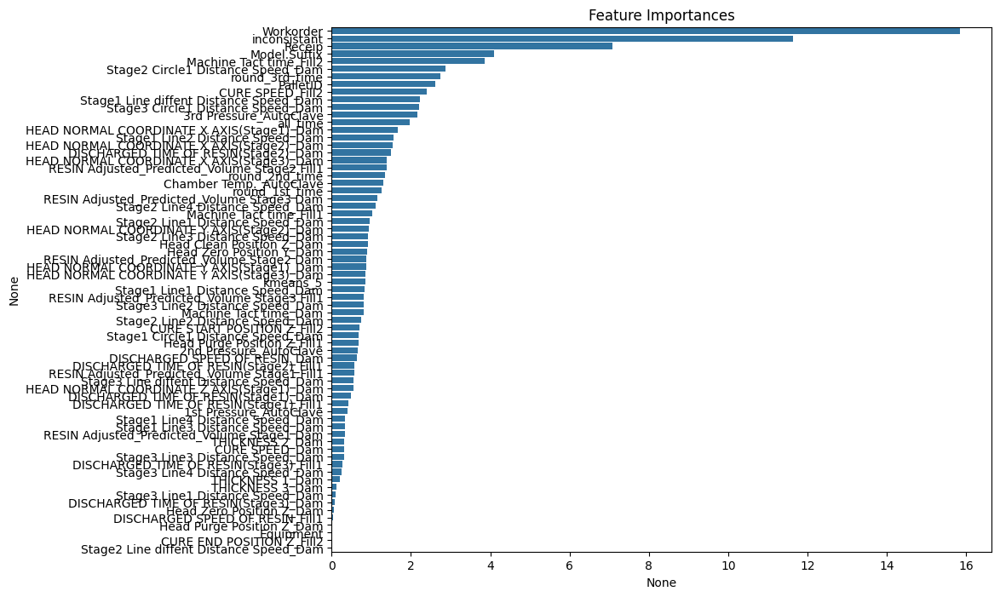

0:	learn: 0.6515985	test: 0.6515801	best: 0.6515801 (0)	total: 16.5ms	remaining: 16.4s
100:	learn: 0.2030904	test: 0.2007596	best: 0.2007596 (100)	total: 1.05s	remaining: 9.4s
200:	learn: 0.1970647	test: 0.1966736	best: 0.1966736 (200)	total: 2.09s	remaining: 8.32s
300:	learn: 0.1943117	test: 0.1960916	best: 0.1960353 (287)	total: 3.06s	remaining: 7.12s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1959370101
bestIteration = 320

Shrink model to first 321 iterations.


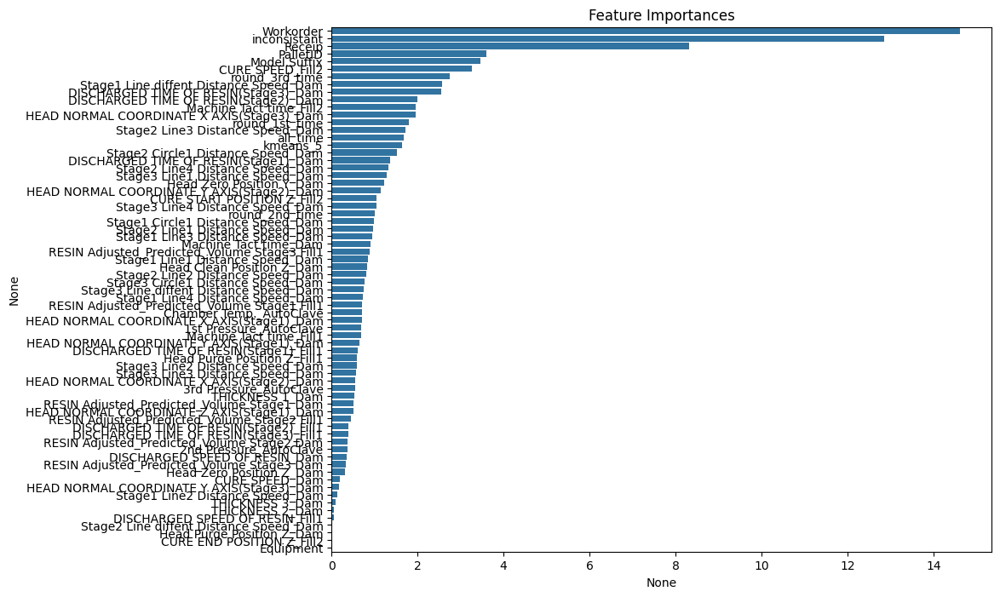

0:	learn: 0.6517075	test: 0.6514272	best: 0.6514272 (0)	total: 15.3ms	remaining: 15.3s
100:	learn: 0.2033138	test: 0.2013065	best: 0.2013065 (100)	total: 1.02s	remaining: 9.05s
200:	learn: 0.1986415	test: 0.1951116	best: 0.1951116 (200)	total: 2.02s	remaining: 8.02s
300:	learn: 0.1958519	test: 0.1920000	best: 0.1920000 (300)	total: 3.11s	remaining: 7.22s
400:	learn: 0.1923112	test: 0.1896657	best: 0.1896576 (399)	total: 4.33s	remaining: 6.47s
500:	learn: 0.1886135	test: 0.1876220	best: 0.1876220 (500)	total: 5.52s	remaining: 5.49s
600:	learn: 0.1851544	test: 0.1868398	best: 0.1865663 (569)	total: 6.71s	remaining: 4.46s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1865663277
bestIteration = 569

Shrink model to first 570 iterations.


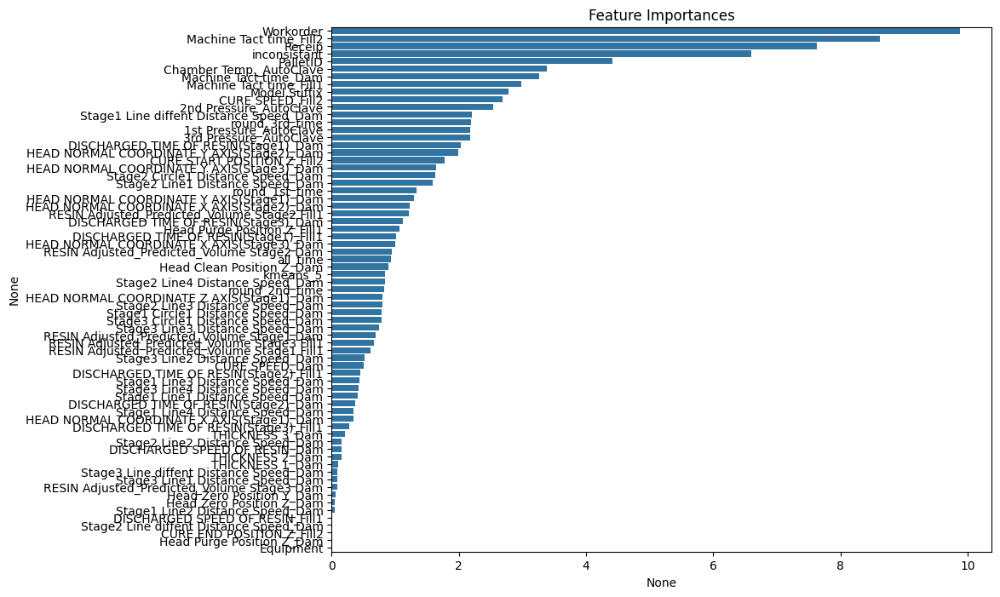

0:	learn: 0.6516002	test: 0.6515658	best: 0.6515658 (0)	total: 17.4ms	remaining: 17.4s
100:	learn: 0.2023174	test: 0.2065146	best: 0.2065146 (100)	total: 1.03s	remaining: 9.14s
200:	learn: 0.1970514	test: 0.2026714	best: 0.2026714 (200)	total: 2.09s	remaining: 8.29s
300:	learn: 0.1941841	test: 0.2005084	best: 0.2005084 (300)	total: 3.12s	remaining: 7.25s
400:	learn: 0.1899894	test: 0.1986428	best: 0.1986428 (400)	total: 4.28s	remaining: 6.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1984403694
bestIteration = 432

Shrink model to first 433 iterations.


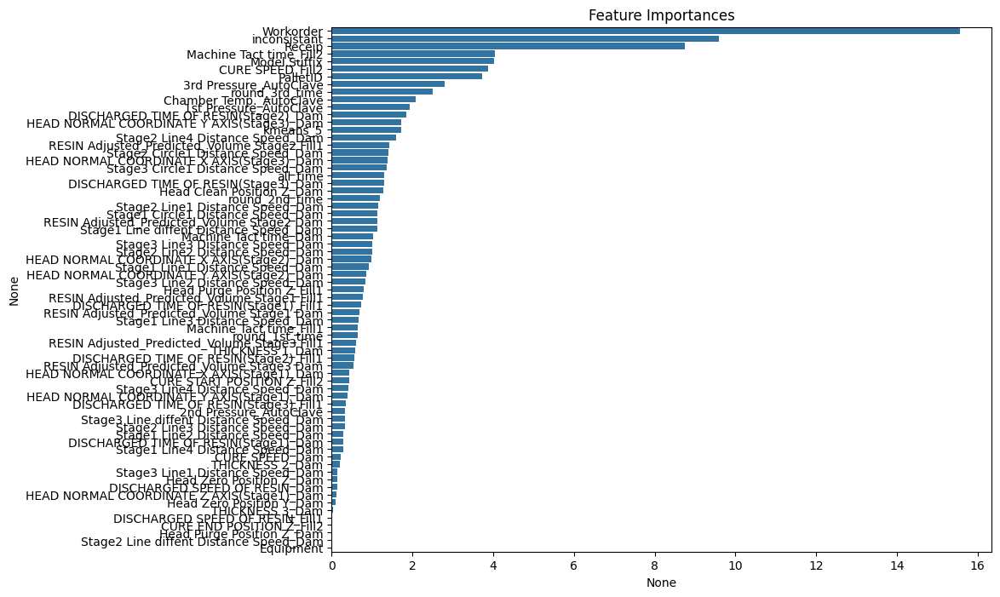

0:	learn: 0.6515272	test: 0.6516639	best: 0.6516639 (0)	total: 16.8ms	remaining: 16.7s
100:	learn: 0.2021894	test: 0.2048723	best: 0.2048723 (100)	total: 1.07s	remaining: 9.57s
200:	learn: 0.1979453	test: 0.2027943	best: 0.2027840 (197)	total: 2.1s	remaining: 8.34s
300:	learn: 0.1951904	test: 0.2009123	best: 0.2008997 (298)	total: 3.14s	remaining: 7.29s
400:	learn: 0.1907798	test: 0.1969879	best: 0.1969879 (400)	total: 4.29s	remaining: 6.4s
500:	learn: 0.1868305	test: 0.1956702	best: 0.1956702 (500)	total: 5.47s	remaining: 5.45s
600:	learn: 0.1838969	test: 0.1946239	best: 0.1946151 (599)	total: 6.65s	remaining: 4.41s
700:	learn: 0.1814393	test: 0.1937899	best: 0.1937812 (696)	total: 7.83s	remaining: 3.34s
800:	learn: 0.1787417	test: 0.1931219	best: 0.1929901 (764)	total: 9.02s	remaining: 2.24s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.192990135
bestIteration = 764

Shrink model to first 765 iterations.


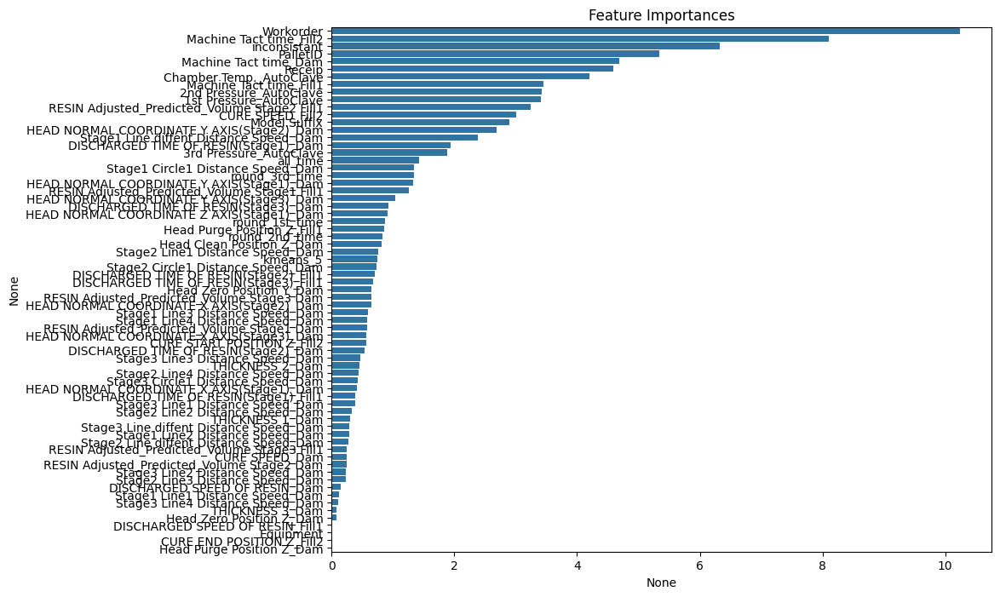

0:	learn: 0.6515938	test: 0.6515093	best: 0.6515093 (0)	total: 17.2ms	remaining: 17.1s
100:	learn: 0.2038278	test: 0.1981130	best: 0.1981130 (100)	total: 1.02s	remaining: 9.12s
200:	learn: 0.1988934	test: 0.1914448	best: 0.1914448 (200)	total: 1.97s	remaining: 7.82s
300:	learn: 0.1962281	test: 0.1892352	best: 0.1892331 (299)	total: 2.96s	remaining: 6.87s
400:	learn: 0.1913395	test: 0.1869745	best: 0.1869745 (400)	total: 4.11s	remaining: 6.14s
500:	learn: 0.1884969	test: 0.1854916	best: 0.1854912 (499)	total: 5.28s	remaining: 5.26s
600:	learn: 0.1856757	test: 0.1845149	best: 0.1845149 (600)	total: 6.47s	remaining: 4.3s
700:	learn: 0.1828357	test: 0.1841641	best: 0.1841297 (690)	total: 7.65s	remaining: 3.26s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1839135023
bestIteration = 723

Shrink model to first 724 iterations.


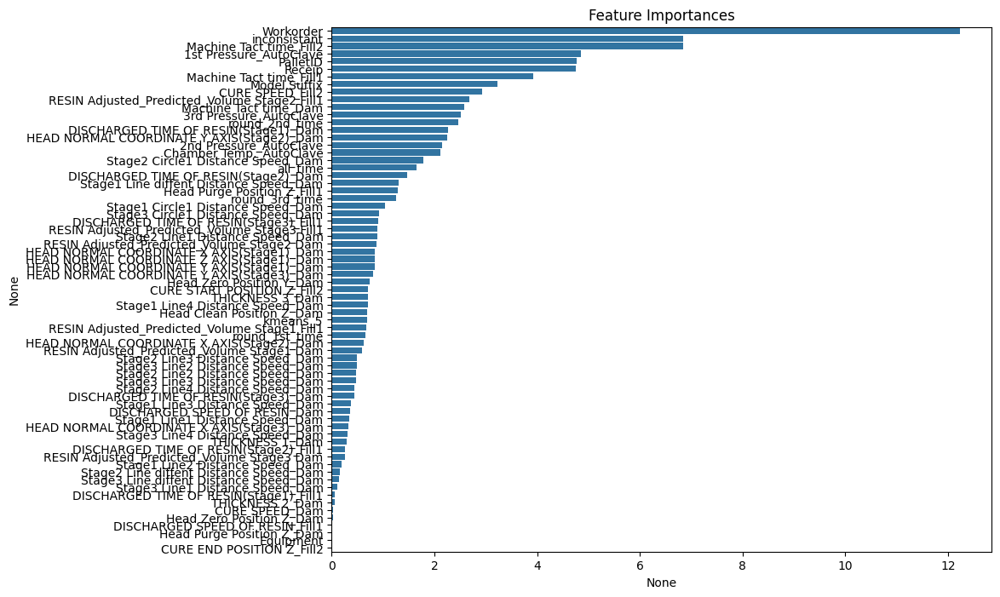

0:	learn: 0.6515461	test: 0.6515669	best: 0.6515669 (0)	total: 16.5ms	remaining: 16.5s
100:	learn: 0.2030520	test: 0.2056445	best: 0.2056445 (100)	total: 1.02s	remaining: 9.11s
200:	learn: 0.1976484	test: 0.1998800	best: 0.1998800 (200)	total: 2.02s	remaining: 8.04s
300:	learn: 0.1949534	test: 0.1969273	best: 0.1969273 (300)	total: 3.05s	remaining: 7.08s
400:	learn: 0.1900166	test: 0.1934986	best: 0.1934777 (393)	total: 4.21s	remaining: 6.3s
500:	learn: 0.1858832	test: 0.1927878	best: 0.1926398 (499)	total: 5.38s	remaining: 5.36s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1924460318
bestIteration = 543

Shrink model to first 544 iterations.


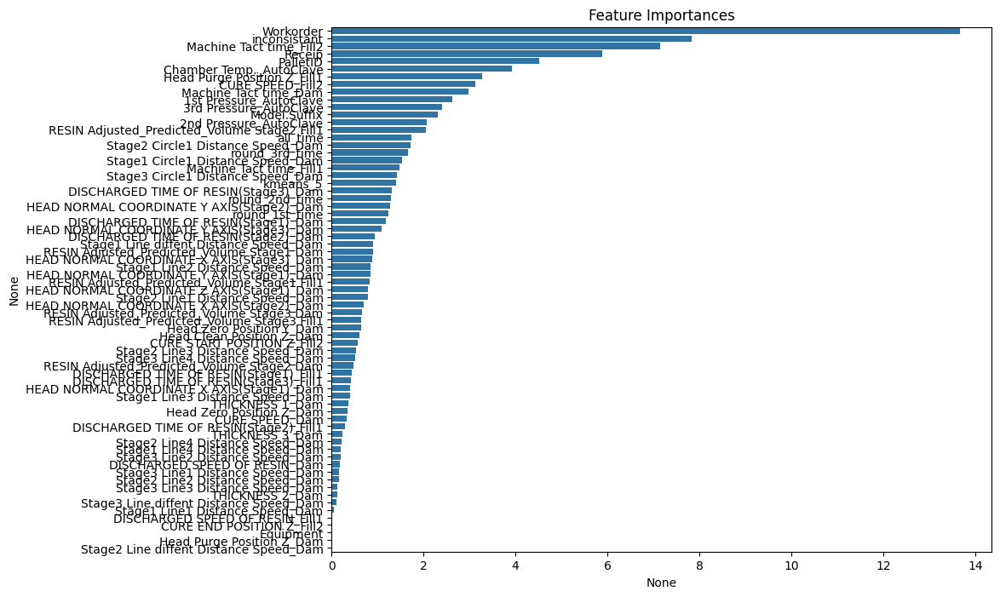

0:	learn: 0.6515194	test: 0.6517334	best: 0.6517334 (0)	total: 15.2ms	remaining: 15.2s
100:	learn: 0.2023757	test: 0.2095600	best: 0.2095600 (100)	total: 1.01s	remaining: 9s
200:	learn: 0.1969026	test: 0.2063186	best: 0.2063186 (200)	total: 2.03s	remaining: 8.07s
300:	learn: 0.1937253	test: 0.2041852	best: 0.2041852 (300)	total: 3.07s	remaining: 7.13s
400:	learn: 0.1897590	test: 0.2012288	best: 0.2012288 (400)	total: 4.24s	remaining: 6.33s
500:	learn: 0.1860976	test: 0.1996631	best: 0.1996631 (500)	total: 5.42s	remaining: 5.39s
600:	learn: 0.1826769	test: 0.1989316	best: 0.1988610 (585)	total: 6.61s	remaining: 4.39s
700:	learn: 0.1796195	test: 0.1986138	best: 0.1985378 (683)	total: 7.81s	remaining: 3.33s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1982894167
bestIteration = 736

Shrink model to first 737 iterations.


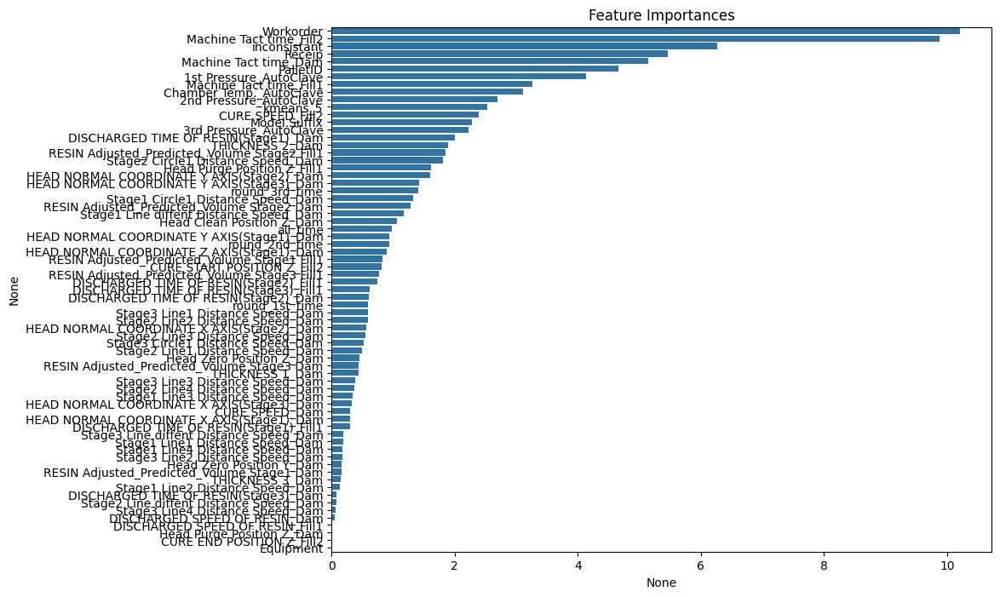

0:	learn: 0.6522438	test: 0.6523031	best: 0.6523031 (0)	total: 22.5ms	remaining: 22.5s
100:	learn: 0.2035520	test: 0.2008343	best: 0.2008343 (100)	total: 1.02s	remaining: 9.06s
200:	learn: 0.1984600	test: 0.1942825	best: 0.1942825 (200)	total: 1.98s	remaining: 7.88s
300:	learn: 0.1951869	test: 0.1908490	best: 0.1908490 (300)	total: 2.96s	remaining: 6.87s
400:	learn: 0.1915214	test: 0.1878334	best: 0.1878334 (400)	total: 4.12s	remaining: 6.16s
500:	learn: 0.1881969	test: 0.1860325	best: 0.1860325 (500)	total: 5.3s	remaining: 5.28s
600:	learn: 0.1849135	test: 0.1852905	best: 0.1851984 (580)	total: 6.49s	remaining: 4.31s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1851930622
bestIteration = 621

Shrink model to first 622 iterations.


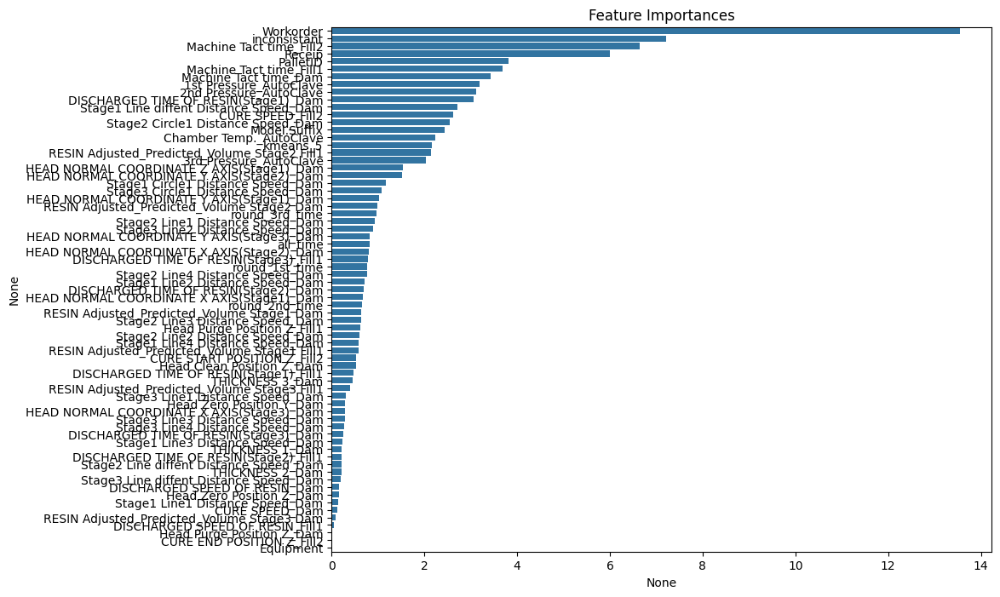

0:	learn: 0.6515585	test: 0.6515583	best: 0.6515583 (0)	total: 16.3ms	remaining: 16.3s
100:	learn: 0.2026767	test: 0.2065415	best: 0.2065415 (100)	total: 1.04s	remaining: 9.25s
200:	learn: 0.1981675	test: 0.2015366	best: 0.2015232 (199)	total: 2.02s	remaining: 8.04s
300:	learn: 0.1950672	test: 0.1983150	best: 0.1983150 (300)	total: 3.03s	remaining: 7.04s
400:	learn: 0.1911877	test: 0.1948941	best: 0.1948941 (400)	total: 4.15s	remaining: 6.19s
500:	learn: 0.1879626	test: 0.1938873	best: 0.1938873 (500)	total: 5.31s	remaining: 5.29s
600:	learn: 0.1851637	test: 0.1938929	best: 0.1937802 (557)	total: 6.49s	remaining: 4.31s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1937801565
bestIteration = 557

Shrink model to first 558 iterations.


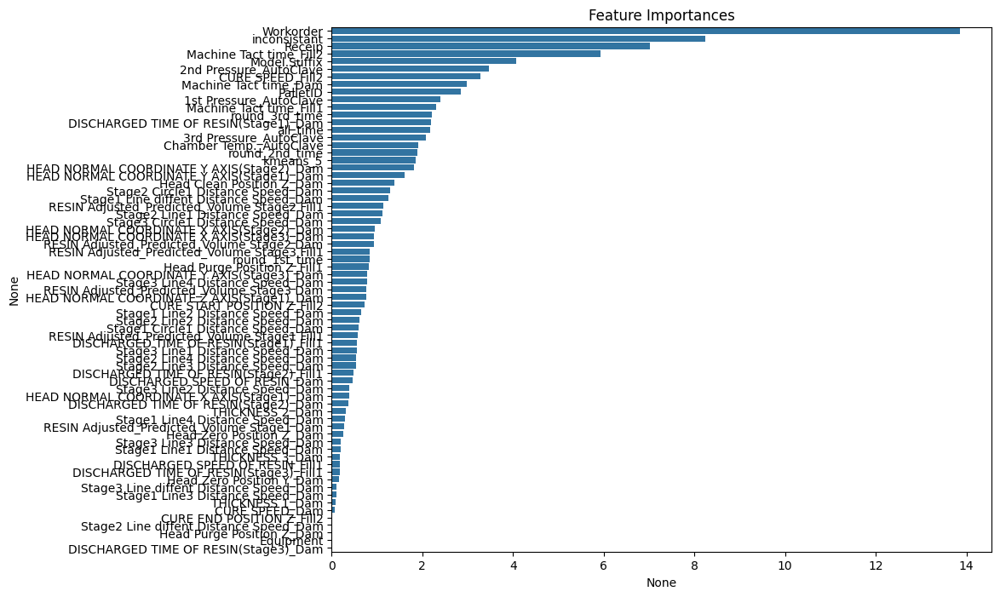

In [89]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_cat_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_cat_last, y_train_cat_last):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)
    
    
    # fit the model
    cat_best_model.fit(
        X_train_cat_last.iloc[train_idx], y_train_cat_last[train_idx],
        eval_set = [(X_train_cat_last.iloc[valid_idx], y_train_cat_last[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat_train.append(cat_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(cat_best_model.feature_importances_, index=list(X_train_cat_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [90]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat_train):
    pred_list.append(model.predict_proba(X_valid_cat_last)[:, 1])
    
# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [91]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_cat_last, cat_proba)
f1_scores = 2*recall*precision / (recall + precision)
cat_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_cat = (cat_proba >= cat_best_threshold).astype(int)

In [92]:
get_clf_eval(y_valid_cat_last, y_pred_custom_threshold_cat)

오차행렬:
 [[  43  130]
 [  65 2858]]

정확도: 0.9370
정밀도: 0.3981
재현율: 0.2486
F1: 0.3060


#### Lightgbm

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[758]	valid_0's binary_logloss: 0.194227


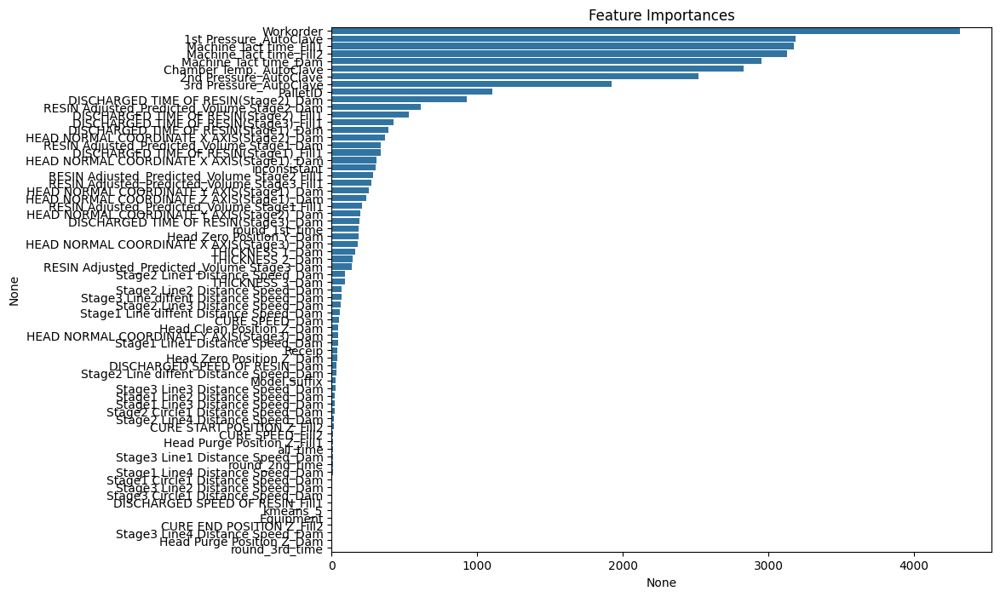

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[470]	valid_0's binary_logloss: 0.203032


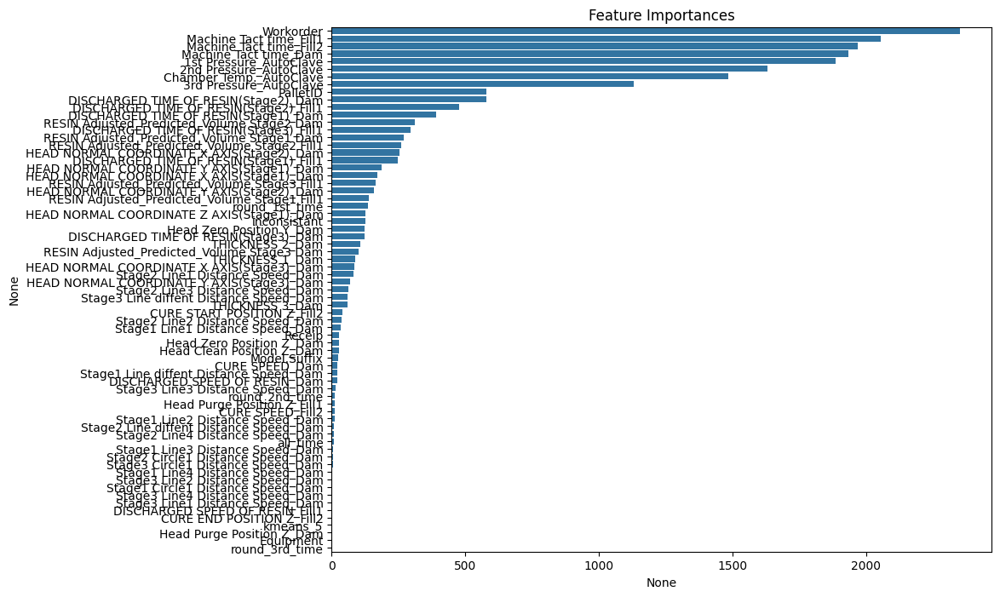

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[989]	valid_0's binary_logloss: 0.19435


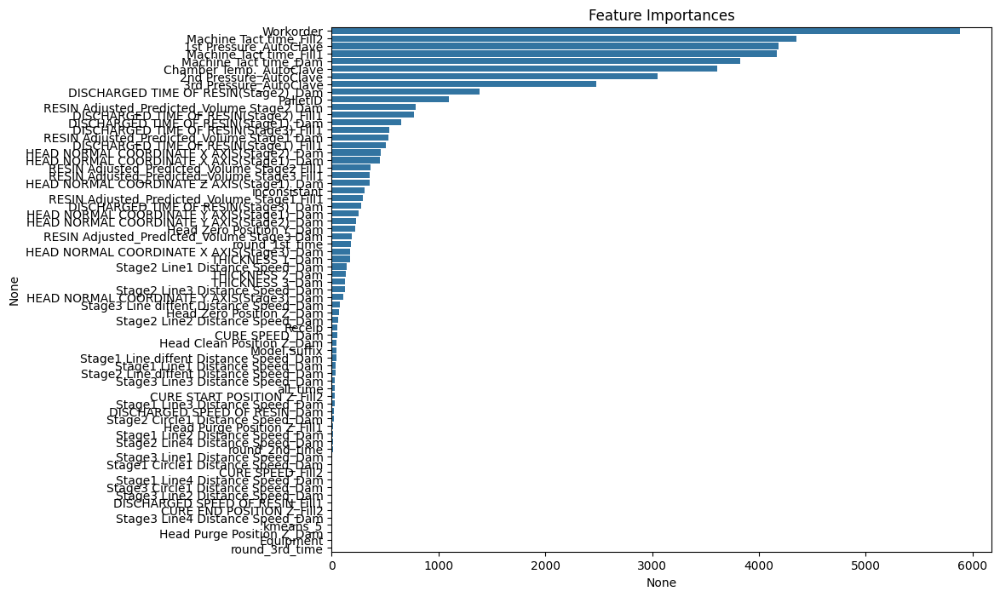

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[730]	valid_0's binary_logloss: 0.200051


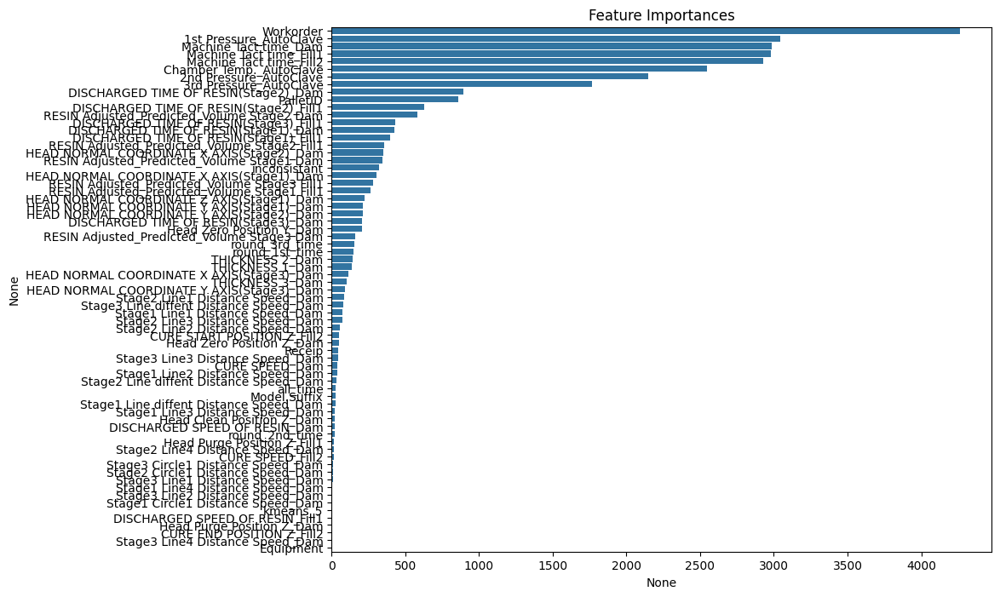

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[671]	valid_0's binary_logloss: 0.191573


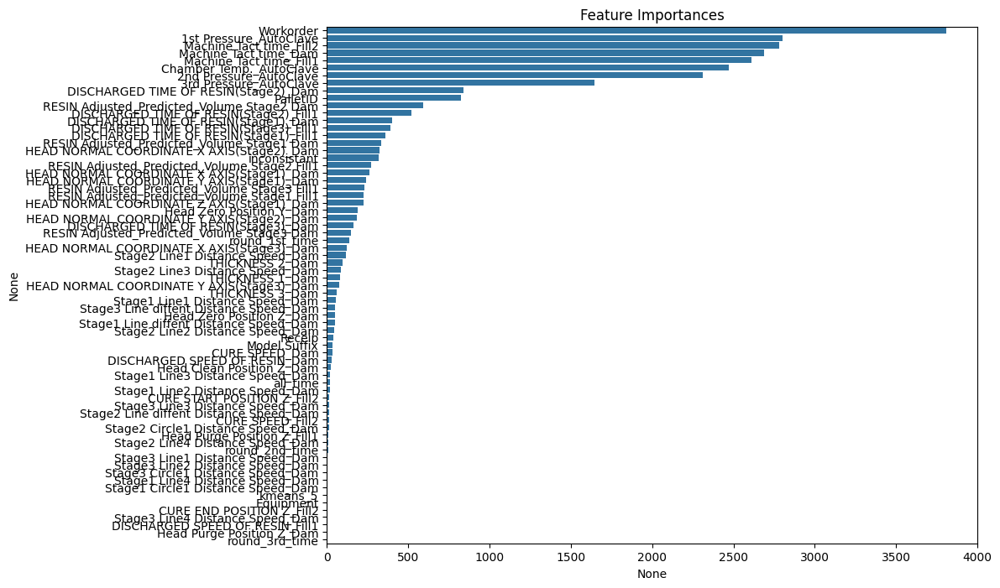

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[821]	valid_0's binary_logloss: 0.190964


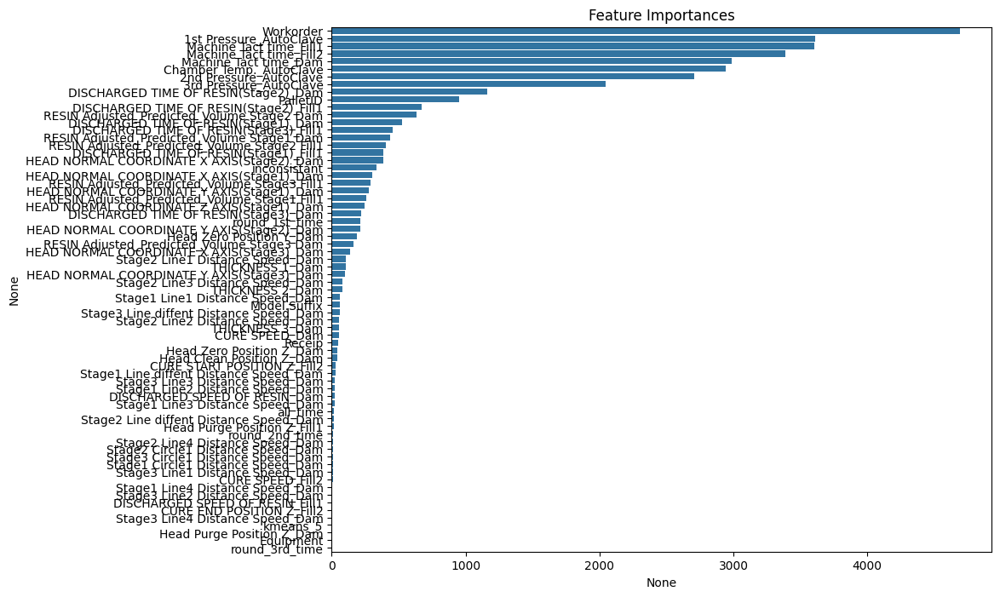

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[493]	valid_0's binary_logloss: 0.197538


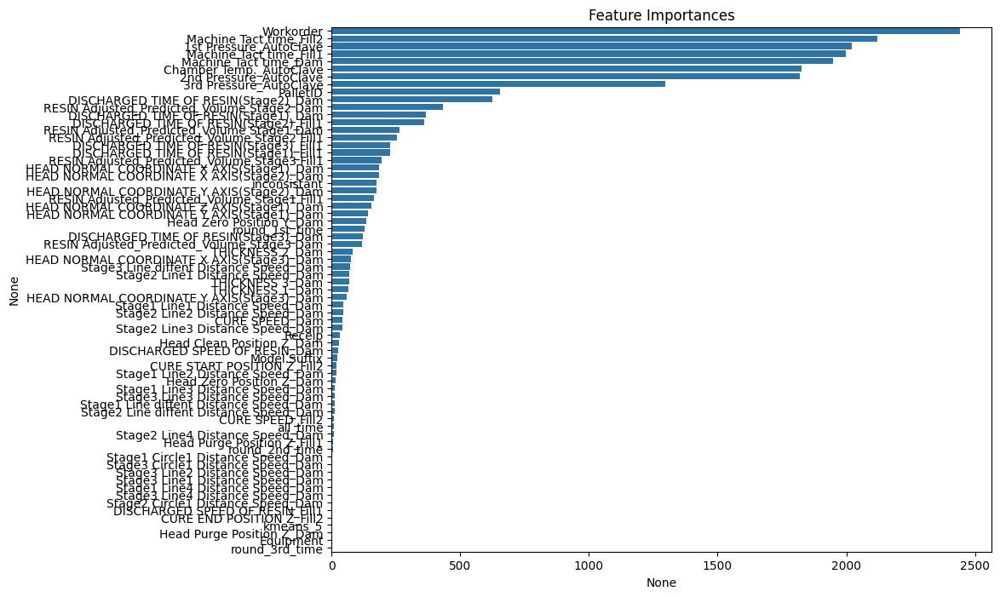

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[598]	valid_0's binary_logloss: 0.201132


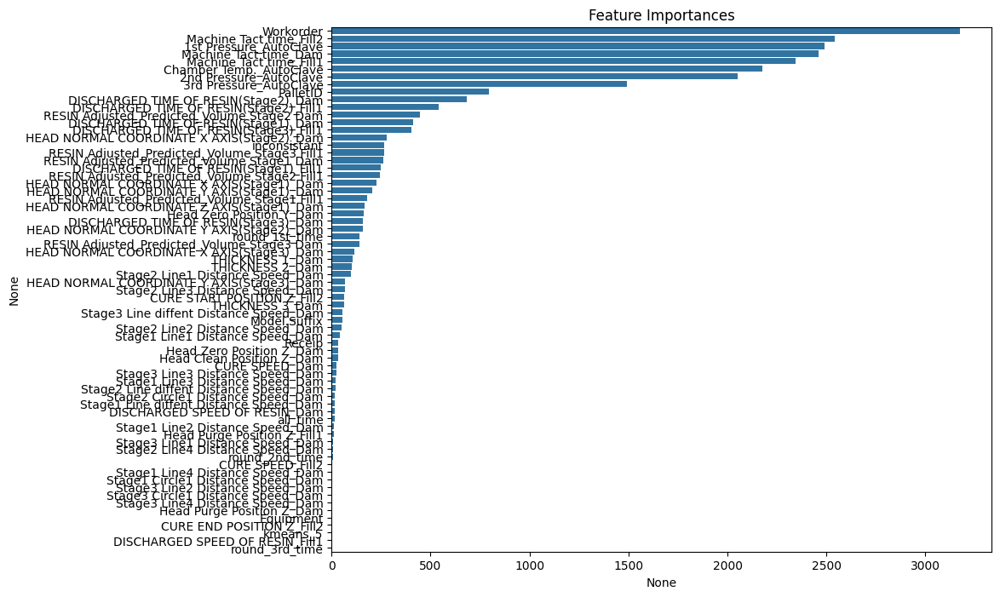

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[593]	valid_0's binary_logloss: 0.194051


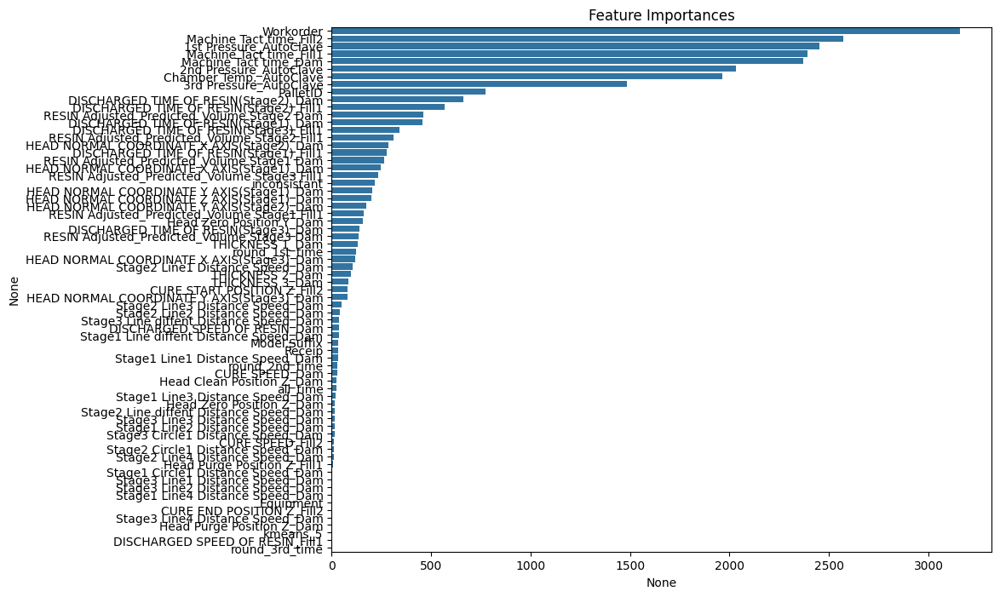

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[621]	valid_0's binary_logloss: 0.199856


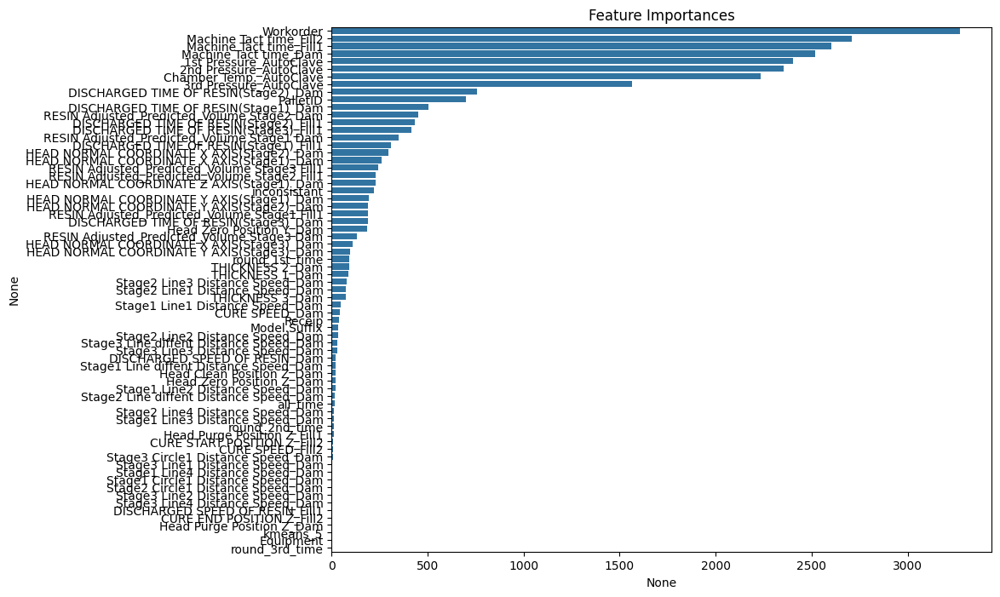

In [93]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_lgbm_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_lgbm_last, y_train_lgbm_last):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_train_lgbm_last.iloc[train_idx], y_train_lgbm_last[train_idx],
        eval_set = [(X_train_lgbm_last.iloc[valid_idx], y_train_lgbm_last[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm_train.append(lgbm_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(lgbm_best_model.feature_importances_, index=list(X_train_lgbm_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [94]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm_train):
    pred_list.append(model.predict_proba(X_valid_lgbm_last)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [95]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_lgbm_last, lgbm_proba)
f1_scores = 2*recall*precision / (recall + precision)
lgbm_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_lgbm = (lgbm_proba >= lgbm_best_threshold).astype(int)

In [96]:
get_clf_eval(y_valid_lgbm_last, y_pred_custom_threshold_lgbm)

오차행렬:
 [[  45  128]
 [  98 2825]]

정확도: 0.9270
정밀도: 0.3147
재현율: 0.2601
F1: 0.2848


#### XGBoost

[0]	validation_0-logloss:0.25522
[100]	validation_0-logloss:0.24146
[200]	validation_0-logloss:0.23080
[300]	validation_0-logloss:0.22242
[400]	validation_0-logloss:0.21570
[500]	validation_0-logloss:0.21043
[550]	validation_0-logloss:0.20831


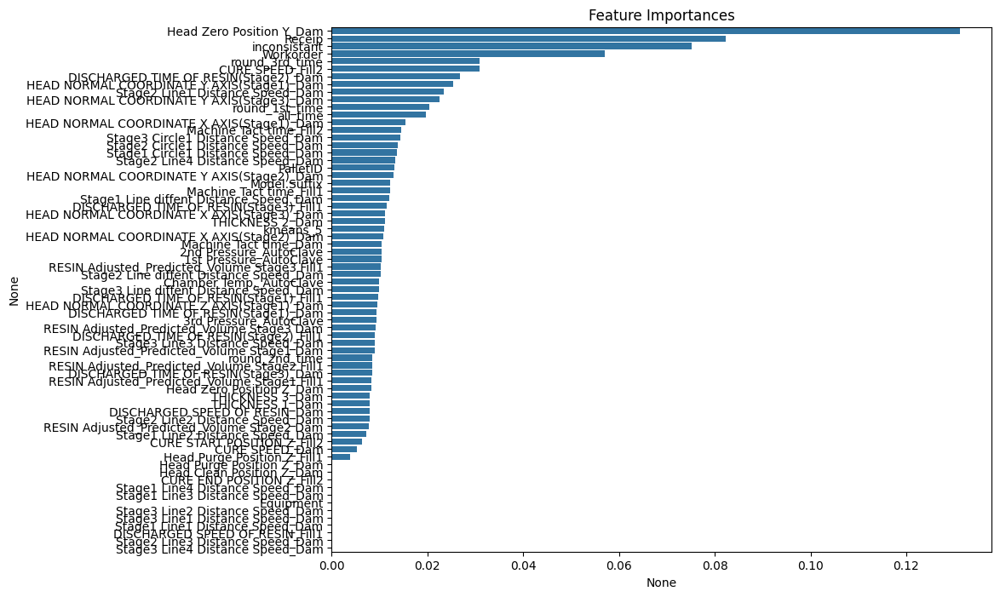

[0]	validation_0-logloss:0.25522
[100]	validation_0-logloss:0.24156
[200]	validation_0-logloss:0.23134
[300]	validation_0-logloss:0.22363
[400]	validation_0-logloss:0.21764
[500]	validation_0-logloss:0.21303
[550]	validation_0-logloss:0.21116


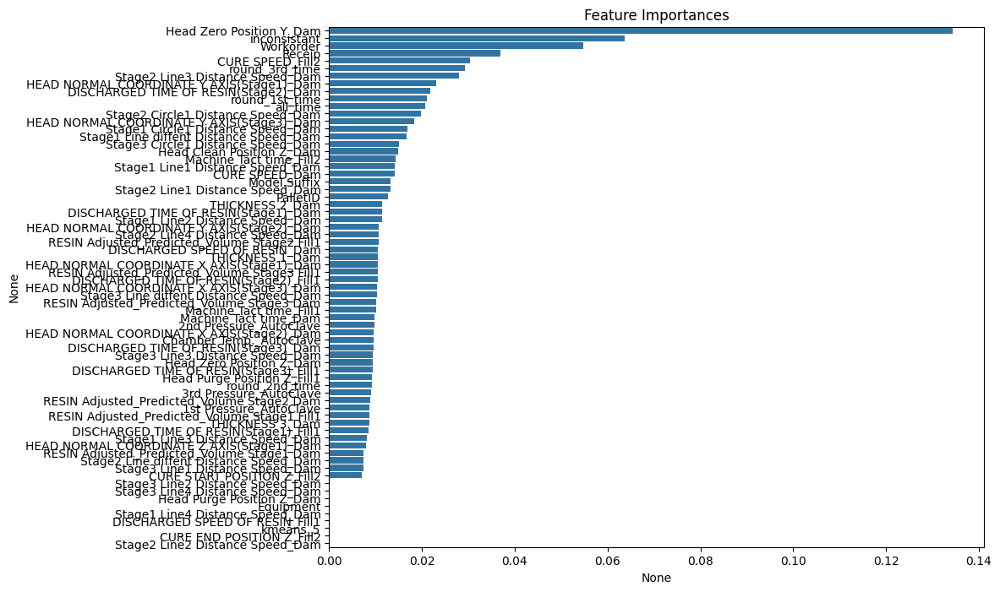

[0]	validation_0-logloss:0.25523
[100]	validation_0-logloss:0.24103
[200]	validation_0-logloss:0.23005
[300]	validation_0-logloss:0.22141
[400]	validation_0-logloss:0.21451
[500]	validation_0-logloss:0.20916
[550]	validation_0-logloss:0.20684


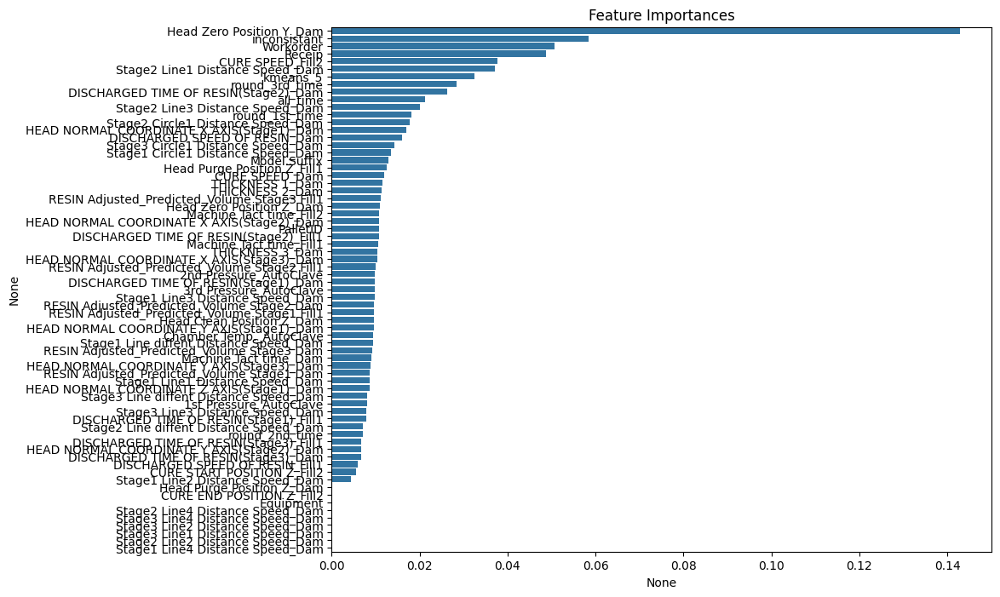

[0]	validation_0-logloss:0.25524
[100]	validation_0-logloss:0.24300
[200]	validation_0-logloss:0.23323
[300]	validation_0-logloss:0.22531
[400]	validation_0-logloss:0.21913
[500]	validation_0-logloss:0.21422
[550]	validation_0-logloss:0.21221


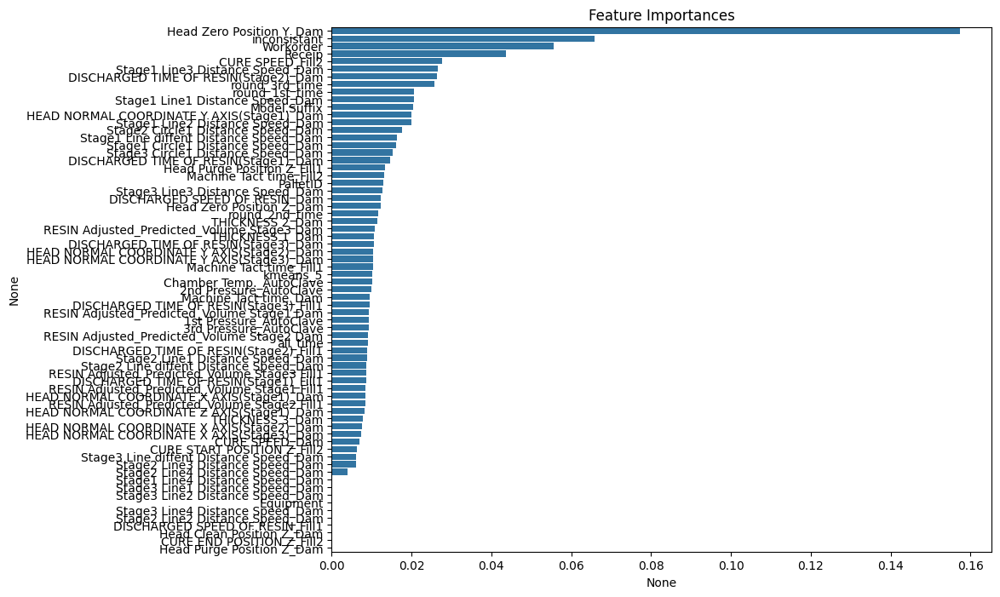

[0]	validation_0-logloss:0.25521
[100]	validation_0-logloss:0.24068
[200]	validation_0-logloss:0.22930
[300]	validation_0-logloss:0.22023
[400]	validation_0-logloss:0.21308
[500]	validation_0-logloss:0.20746
[550]	validation_0-logloss:0.20518


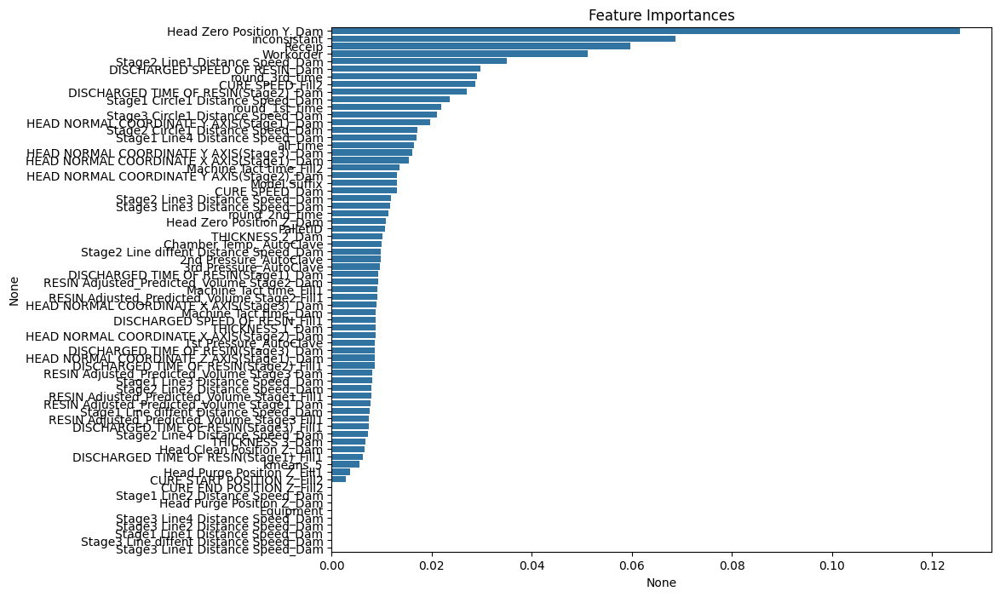

[0]	validation_0-logloss:0.25521
[100]	validation_0-logloss:0.24004
[200]	validation_0-logloss:0.22876
[300]	validation_0-logloss:0.21992
[400]	validation_0-logloss:0.21302
[500]	validation_0-logloss:0.20760
[550]	validation_0-logloss:0.20529


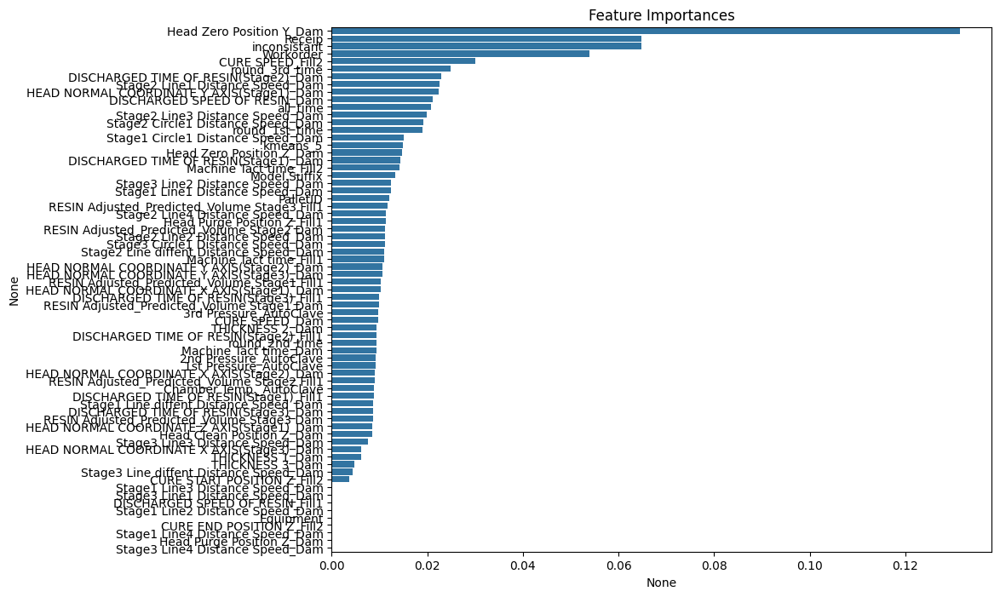

[0]	validation_0-logloss:0.25521
[100]	validation_0-logloss:0.24178
[200]	validation_0-logloss:0.23129
[300]	validation_0-logloss:0.22268
[400]	validation_0-logloss:0.21597
[500]	validation_0-logloss:0.21061
[550]	validation_0-logloss:0.20833


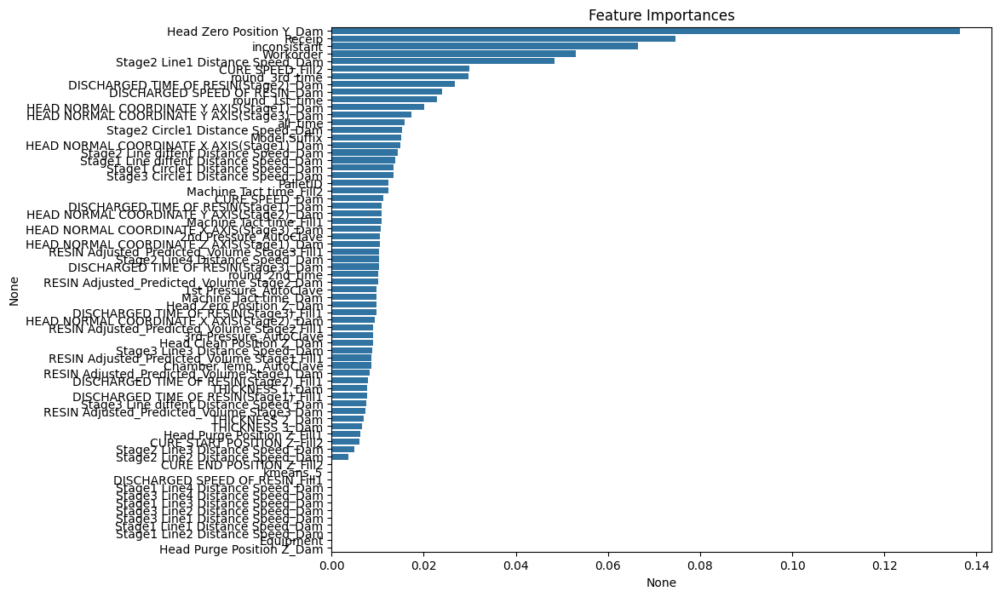

[0]	validation_0-logloss:0.25522
[100]	validation_0-logloss:0.24244
[200]	validation_0-logloss:0.23242
[300]	validation_0-logloss:0.22458
[400]	validation_0-logloss:0.21836
[500]	validation_0-logloss:0.21349
[550]	validation_0-logloss:0.21148


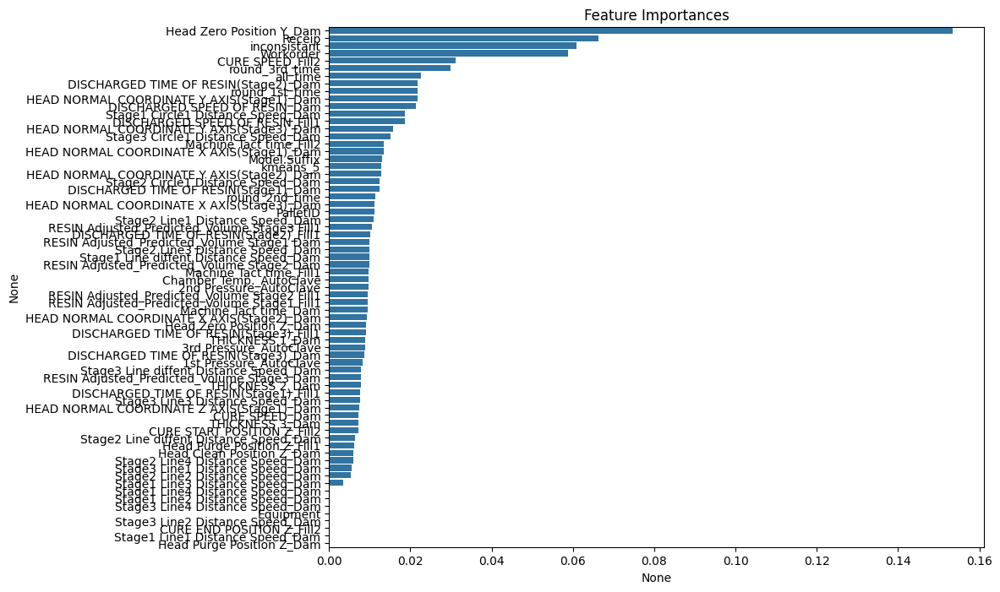

[0]	validation_0-logloss:0.25660
[100]	validation_0-logloss:0.24127
[200]	validation_0-logloss:0.22976
[300]	validation_0-logloss:0.22073
[400]	validation_0-logloss:0.21373
[500]	validation_0-logloss:0.20802
[550]	validation_0-logloss:0.20558


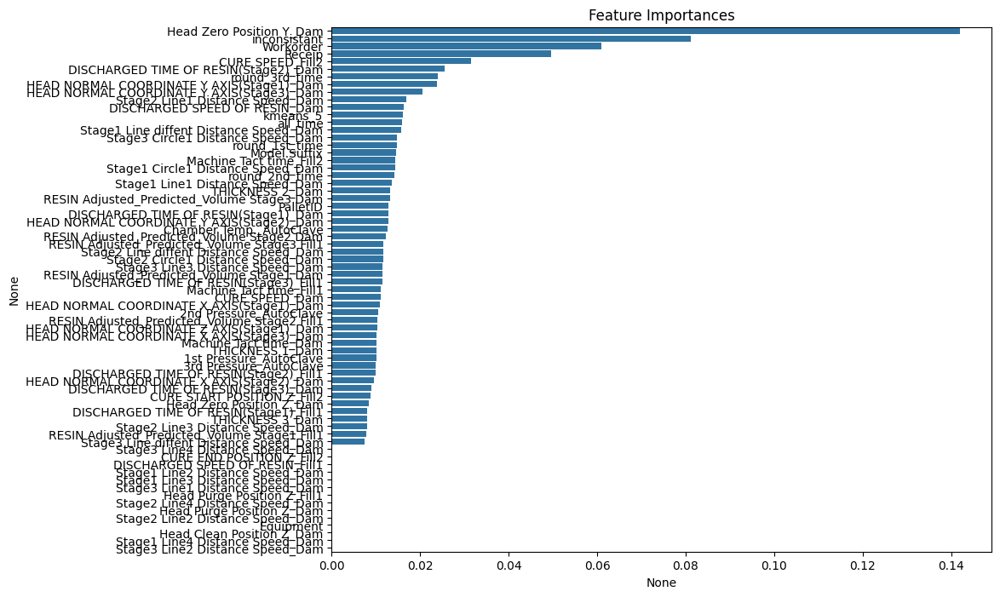

[0]	validation_0-logloss:0.25664
[100]	validation_0-logloss:0.24342
[200]	validation_0-logloss:0.23305
[300]	validation_0-logloss:0.22501
[400]	validation_0-logloss:0.21851
[500]	validation_0-logloss:0.21334
[550]	validation_0-logloss:0.21119


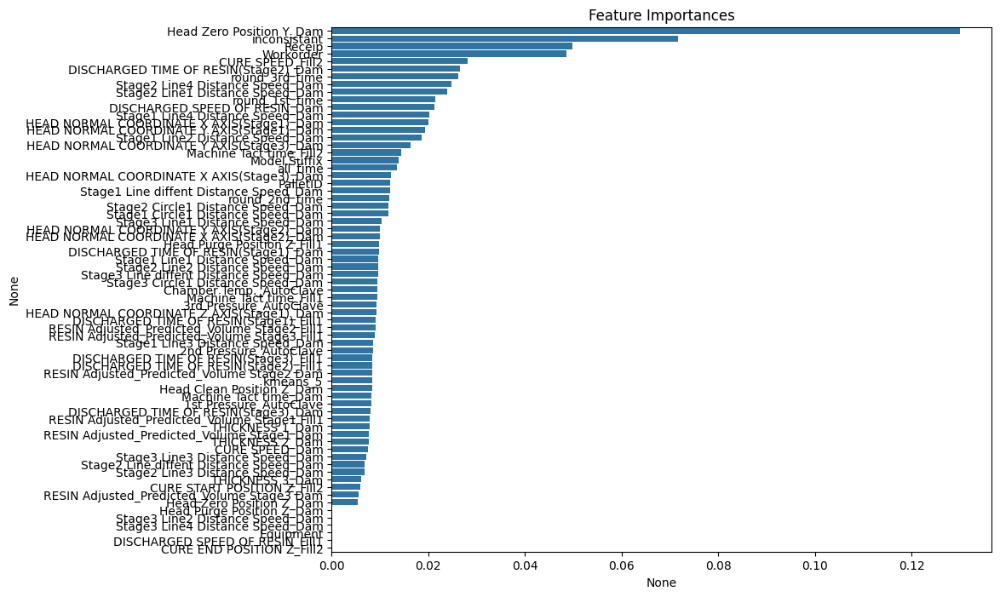

In [97]:
# Stratified cv fitting models_xgb_train

# 해당 모델 저장 리스트
models_xgb_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_xgb_last, y_train_xgb_last):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True,)

    # fit the model
    xgb_best_model.fit(
        X_train_xgb_last.iloc[train_idx], y_train_xgb_last[train_idx],
        eval_set = [(X_train_xgb_last.iloc[valid_idx], y_train_xgb_last[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb_train.append(xgb_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(xgb_best_model.feature_importances_, index=list(X_train_xgb_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [98]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb_train):
    pred_list.append(model.predict_proba(X_valid_xgb_last)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [99]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, xgb_proba)
f1_scores = 2*recall*precision / (recall + precision)
xgb_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_xgb = (xgb_proba >= xgb_best_threshold).astype(int)

In [100]:
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold_xgb)

오차행렬:
 [[  40  133]
 [  49 2874]]

정확도: 0.9412
정밀도: 0.4494
재현율: 0.2312
F1: 0.3053


#### Ensemble tuning

In [101]:
def weight_test(last_num, test_set, prob):

    from itertools import product
    col_n = len(prob.columns)
    row_n = len(prob)
    
    
    # best ensemble
    best_f1 = 0
    best_f1_t = 0
    best_weights = None
    best_weights_t = None
    A = [i for i in range(last_num + 1)]
    
    for w in tqdm(product(A, repeat = col_n)):
        
        # 가중치 열 만들기
        weight_frame = pd.DataFrame([w]*row_n, columns = prob.columns)
        
        # 가중치 곱해주기
        prob_weight = prob * weight_frame
        
        # 가중치의 합
        w_sum = sum(w)
        
        # 평균 계산해주기
        final_proba = np.sum(prob_weight/w_sum, axis = 1)
        
        # 가중 평균 계산
        y_pred = (final_proba > 0.5).astype(int)

        # F1 스코어 계산
        f1 = f1_score(test_set, y_pred)

        # Threshold 스코어 계산
        precision, recall, thresholds = precision_recall_curve(test_set, final_proba)
        f1_scores = 2*recall*precision / (recall + precision)
        best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold = (final_proba >= best_threshold).astype(int)
        f1_t = f1_score(test_set, y_pred_custom_threshold)

        # 최고 성능 저장
        if f1 > best_f1:
            best_f1 = f1
            best_weights = w

        if f1_t > best_f1_t:
            best_f1_t = f1_t
            best_weights_t = w
            
#         print(f'weight: {w}, best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

    print('종료되었습니다.')
    return best_f1, best_f1_t, best_weights, best_weights_t

In [102]:
# 함수 적용
best_f1, best_f1_t, best_weights, best_weights_t = weight_test(last_num = 20, test_set = y_valid_xgb_last, prob = pd.DataFrame({'cat_proba': cat_proba, 'lgbm_proba': lgbm_proba, 'xgb_proba': xgb_proba}))
print(f'best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

9261it [01:01, 150.59it/s]

종료되었습니다.
best_f1: 0.1595744680851064, best_f1_t: 0.328125, best_weights: (1, 0, 0), best_weights_t: (2, 0, 1)


In [103]:
# best ensemble 적용
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
y_best = (cat + lgbm + xgb)/(sum(best_weights_t))

In [104]:
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, y_best)
f1_scores = 2*recall*precision / (recall + precision)
weights_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold = (y_best >= weights_best_threshold).astype(int)
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold)

오차행렬:
 [[  42  131]
 [  41 2882]]

정확도: 0.9444
정밀도: 0.5060
재현율: 0.2428
F1: 0.3281


## 6. Inference

### Catboost

In [105]:
# 해당 모델 저장 리스트
models_cat = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_cat, y_cat):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)

    # fit the model
    cat_best_model.fit(
        X_cat.iloc[train_idx], y_cat[train_idx],
        eval_set = [(X_cat.iloc[valid_idx], y_cat[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat.append(cat_best_model)

0:	learn: 0.6516055	test: 0.6514892	best: 0.6514892 (0)	total: 16.3ms	remaining: 16.3s
100:	learn: 0.2027850	test: 0.1971075	best: 0.1971075 (100)	total: 1.16s	remaining: 10.3s
200:	learn: 0.1968331	test: 0.1901234	best: 0.1901234 (200)	total: 2.35s	remaining: 9.33s
300:	learn: 0.1939652	test: 0.1870634	best: 0.1870634 (300)	total: 3.58s	remaining: 8.31s
400:	learn: 0.1903529	test: 0.1842079	best: 0.1842079 (400)	total: 4.93s	remaining: 7.36s
500:	learn: 0.1872911	test: 0.1832826	best: 0.1832613 (491)	total: 6.34s	remaining: 6.32s
600:	learn: 0.1844225	test: 0.1824690	best: 0.1824610 (599)	total: 7.75s	remaining: 5.15s
700:	learn: 0.1817471	test: 0.1819158	best: 0.1819101 (698)	total: 9.15s	remaining: 3.9s
800:	learn: 0.1793882	test: 0.1812656	best: 0.1812531 (799)	total: 10.5s	remaining: 2.62s
900:	learn: 0.1774077	test: 0.1808646	best: 0.1808444 (891)	total: 12s	remaining: 1.31s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1808134578
bestIteration = 904

Shrink

In [106]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat):
    pred_list.append(model.predict_proba(X_test_cat)[:, 1])

# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [107]:
np.unique(np.where(cat_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([6587,   40]))

### LGBM

In [108]:
# 해당 모델 저장 리스트
models_lgbm = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_lgbm, y_lgbm):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_lgbm.iloc[train_idx], y_lgbm[train_idx],
        eval_set = [(X_lgbm.iloc[valid_idx], y_lgbm[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm.append(lgbm_best_model)

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[893]	valid_0's binary_logloss: 0.190023
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[752]	valid_0's binary_logloss: 0.190706
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[879]	valid_0's binary_logloss: 0.193113
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[848]	valid_0's binary_logloss: 0.193166
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[441]	valid_0's binary_logloss: 0.203561
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[466]	valid_0's binary_logloss: 0.20632
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[735]	valid_0's binary_logloss: 0.195076
Training until validation scores don't imp

In [109]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm):
    pred_list.append(model.predict_proba(X_test_lgbm)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [110]:
np.unique(np.where(lgbm_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([6601,   26]))

### XGB

In [111]:
# 해당 모델 저장 리스트
models_xgb = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_xgb, y_xgb):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True)

    # fit the model
    xgb_best_model.fit(
        X_xgb.iloc[train_idx], y_xgb[train_idx],
        eval_set = [(X_xgb.iloc[valid_idx], y_xgb[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb.append(xgb_best_model)

[0]	validation_0-logloss:0.25490
[100]	validation_0-logloss:0.23993
[200]	validation_0-logloss:0.22846
[300]	validation_0-logloss:0.21927
[400]	validation_0-logloss:0.21185
[500]	validation_0-logloss:0.20594
[550]	validation_0-logloss:0.20340
[0]	validation_0-logloss:0.25602
[100]	validation_0-logloss:0.24142
[200]	validation_0-logloss:0.23028
[300]	validation_0-logloss:0.22137
[400]	validation_0-logloss:0.21458
[500]	validation_0-logloss:0.20906
[550]	validation_0-logloss:0.20679
[0]	validation_0-logloss:0.25602
[100]	validation_0-logloss:0.24210
[200]	validation_0-logloss:0.23137
[300]	validation_0-logloss:0.22272
[400]	validation_0-logloss:0.21608
[500]	validation_0-logloss:0.21080
[550]	validation_0-logloss:0.20855
[0]	validation_0-logloss:0.25603
[100]	validation_0-logloss:0.24116
[200]	validation_0-logloss:0.23039
[300]	validation_0-logloss:0.22192
[400]	validation_0-logloss:0.21522
[500]	validation_0-logloss:0.21000
[550]	validation_0-logloss:0.20773
[0]	validation_0-logloss:0.2

In [112]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb):
    pred_list.append(model.predict_proba(X_test_xgb)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [113]:
np.unique(np.where(xgb_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([6626,    1]))

In [114]:
# 추론
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
p2 = (cat + lgbm + xgb)/(sum(best_weights_t))

In [201]:
p1_2 = np.where(p1 >= 0.22576361221779545, 'AbNormal', 'Normal')

In [202]:
np.unique(p1_2, return_counts = True)

(array(['AbNormal', 'Normal'], dtype='<U8'), array([   41, 10693]))

In [205]:
p2_2 = np.where(p2 >= 0.328125, 'AbNormal', 'Normal')

In [206]:
np.unique(p2_2, return_counts = True)

(array(['AbNormal', 'Normal'], dtype='<U8'), array([  43, 6584]))

In [207]:
equip1_p = pd.DataFrame({'index': equip1_index_test, 'p': p1})
equip2_p = pd.DataFrame({'index': equip2_index_test, 'p': p2})

In [208]:
p3 = pd.concat([equip1_p, equip2_p]).sort_values('index')

In [209]:
np.unique(p3, return_counts = True)

(array([0.00000000e+00, 3.85352872e-02, 3.85942612e-02, ...,
        1.73580000e+04, 1.73590000e+04, 1.73600000e+04]),
 array([1, 1, 1, ..., 1, 1, 1]))

In [210]:
pd.crosstab(p3['p'], df_test['inconsistant'])

ValueError: cannot reindex on an axis with duplicate labels

## 7. Submission

In [ ]:
# 제출 데이터 읽어오기 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")
df_sub["target"] = p2

# 제출 파일 저장
df_sub.to_csv("submission.csv", index=False)

In [ ]:
df_sub['target']

# 꼭 df_sub['target'] 확인하고 제출하시오